In [1]:
import tensorflow as tf

print("TensorFlow:", tf.__version__)
print("GPU:", tf.config.list_physical_devices("GPU"))

TensorFlow: 2.20.0
GPU: []


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

BASE = "/content/drive/MyDrive/RTSD_practice"

print("Файлы в RTSD_practice:")
print(os.listdir(BASE))

Файлы в RTSD_practice:
['dataset_metadata.csv', 'test_metadata.csv', 'val_metadata.csv', 'train_metadata.csv', 'prepared_dataset_15k.tar', 'results', 'models']


In [ ]:
import os
import tarfile

archive = "/content/drive/MyDrive/RTSD_practice/prepared_dataset_15k.tar"
extract_path = "/content/prepared_dataset"

if not os.path.exists(os.path.join(extract_path, "prepared_dataset")):
    os.makedirs(extract_path, exist_ok=True)

    with tarfile.open(archive, "r") as tar:
        tar.extractall(extract_path)

print("Распаковка завершена.")
print("Путь к изображениям:")
print("/content/prepared_dataset/prepared_dataset")

Распаковка завершена.
Путь к изображениям:
/content/prepared_dataset/prepared_dataset


In [ ]:
import pandas as pd
import os

DATASET_ROOT = "/content/prepared_dataset/prepared_dataset"

train_df = pd.read_csv(os.path.join(BASE, "train_metadata.csv"))
val_df = pd.read_csv(os.path.join(BASE, "val_metadata.csv"))
test_df = pd.read_csv(os.path.join(BASE, "test_metadata.csv"))

class_names = sorted(train_df["class_name"].unique())
class_to_id = {name: i for i, name in enumerate(class_names)}

for df in [train_df, val_df, test_df]:
    df["label"] = df["class_name"].map(class_to_id)
    df["filepath"] = df.apply(
        lambda row: os.path.join(
            DATASET_ROOT,
            row["class_name"],
            row["filename"]
        ),
        axis=1
    )

print("Train:", len(train_df))
print("Val:", len(val_df))
print("Test:", len(test_df))
print("Классов:", len(class_names))

print("\nПример:")
print(train_df.iloc[0]["filepath"])
print("Файл существует:", os.path.exists(train_df.iloc[0]["filepath"]))

Train: 10501
Val: 2258
Test: 2241
Классов: 15

Пример:
/content/prepared_dataset/prepared_dataset/5_19_1/5_19_1_0001.jpg
Файл существует: True


In [ ]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
NUM_CLASSES = len(class_names)
AUTOTUNE = tf.data.AUTOTUNE

def load_image(filepath, label):
    image = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, IMG_SIZE)
    image = tf.cast(image, tf.float32)
    return image, label

def make_dataset(df, training=False):
    ds = tf.data.Dataset.from_tensor_slices(
        (df["filepath"].values, df["label"].values)
    )

    if training:
        ds = ds.shuffle(
            len(df),
            seed=42,
            reshuffle_each_iteration=True
        )

    ds = ds.map(load_image, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(AUTOTUNE)

    return ds

train_ds = make_dataset(train_df, training=True)
val_ds = make_dataset(val_df)
test_ds = make_dataset(test_df)

print("Dataset создан.")

Dataset создан.


In [ ]:
images, labels = next(iter(train_ds))

print("Размер batch:", images.shape)
print("Метки:", labels[:10].numpy())
print(
    "Диапазон пикселей:",
    images.numpy().min(),
    images.numpy().max()
)

Размер batch: (32, 224, 224, 3)
Метки: [ 7 12 12  0  6  3  8  5 10 11]
Диапазон пикселей: 0.0 255.0


In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(0.05),
    tf.keras.layers.RandomZoom(0.10),
    tf.keras.layers.RandomTranslation(
        height_factor=0.05,
        width_factor=0.05
    ),
    tf.keras.layers.RandomContrast(0.15),
], name="data_augmentation")

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras import layers, Model

# Базовая модель MobileNetV2 с весами ImageNet
base_model = MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3)
)

# Замораживаем базовую модель
base_model.trainable = False

# Вход
inputs = layers.Input(shape=(224, 224, 3))

# Аугментация
x = data_augmentation(inputs)

# Preprocessing именно для MobileNetV2
x = preprocess_input(x)

# Базовая CNN
x = base_model(x, training=False)

# Классификатор
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.2)(x)

outputs = layers.Dense(
    NUM_CLASSES,
    activation="softmax"
)(x)

mobilenet_model = Model(inputs, outputs)

mobilenet_model.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_4 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_2 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_6      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 15)             │        19,215 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,277,199 (8.69 MB)

 Trainable params: 19,215 (75.06 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
mobilenet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("MobileNetV2 скомпилирована.")

MobileNetV2 скомпилирована.


In [ ]:
EPOCHS = 5

history_mobilenet = mobilenet_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7951 - loss: 0.6918 - val_accuracy: 0.9132 - val_loss: 0.2973
Epoch 2/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9137 - loss: 0.2831 - val_accuracy: 0.9305 - val_loss: 0.2248
Epoch 3/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9290 - loss: 0.2232 - val_accuracy: 0.9367 - val_loss: 0.2054
Epoch 4/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9381 - loss: 0.1961 - val_accuracy: 0.9455 - val_loss: 0.1810
Epoch 5/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9411 - loss: 0.1789 - val_accuracy: 0.9460 - val_loss: 0.1709


In [ ]:
test_loss, test_accuracy = mobilenet_model.evaluate(
    test_ds,
    verbose=1
)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9442 - loss: 0.1676
Test Loss: 0.1676
Test Accuracy: 0.9442


In [ ]:
import numpy as np
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Получаем истинные метки
y_true = np.concatenate([
    labels.numpy()
    for _, labels in test_ds
])

# Получаем вероятности и предсказанные классы
y_prob = mobilenet_model.predict(test_ds, verbose=1)
y_pred = np.argmax(y_prob, axis=1)

# Метрики
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(
    y_true, y_pred, average="macro", zero_division=0
)
recall = recall_score(
    y_true, y_pred, average="macro", zero_division=0
)
f1 = f1_score(
    y_true, y_pred, average="macro", zero_division=0
)

print("MobileNetV2 — Test metrics")
print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1-score : {f1:.4f}")

print("\nClassification report:")
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names,
        digits=4,
        zero_division=0
    )
)

71/71 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step
MobileNetV2 — Test metrics
Accuracy : 0.9442
Precision: 0.9458
Recall   : 0.9439
F1-score : 0.9441

Classification report:
              precision    recall  f1-score   support

        1_17     0.9784    0.9577    0.9680       142
        1_23     0.9847    0.9085    0.9451       142
         2_1     1.0000    0.9866    0.9932       149
         2_4     0.9937    0.9812    0.9874       160
        3_20     0.9573    0.9691    0.9632       162
        3_24     0.9763    0.9538    0.9649       173
        3_27     0.8741    0.9690    0.9191       129
       4_1_1     1.0000    0.9058    0.9506       138
      5_15_1     0.9222    0.9167    0.9194       168
      5_15_2     0.8371    0.9430    0.8869       158
    5_15_2_2     0.8788    0.8345    0.8561       139
      5_15_3     0.9315    0.9444    0.9379       144
        5_16     0.9930    0.9860    0.9895       143
      5_19_1     0.9363    0.9245    0.9304       159
        5_20     0.9231   

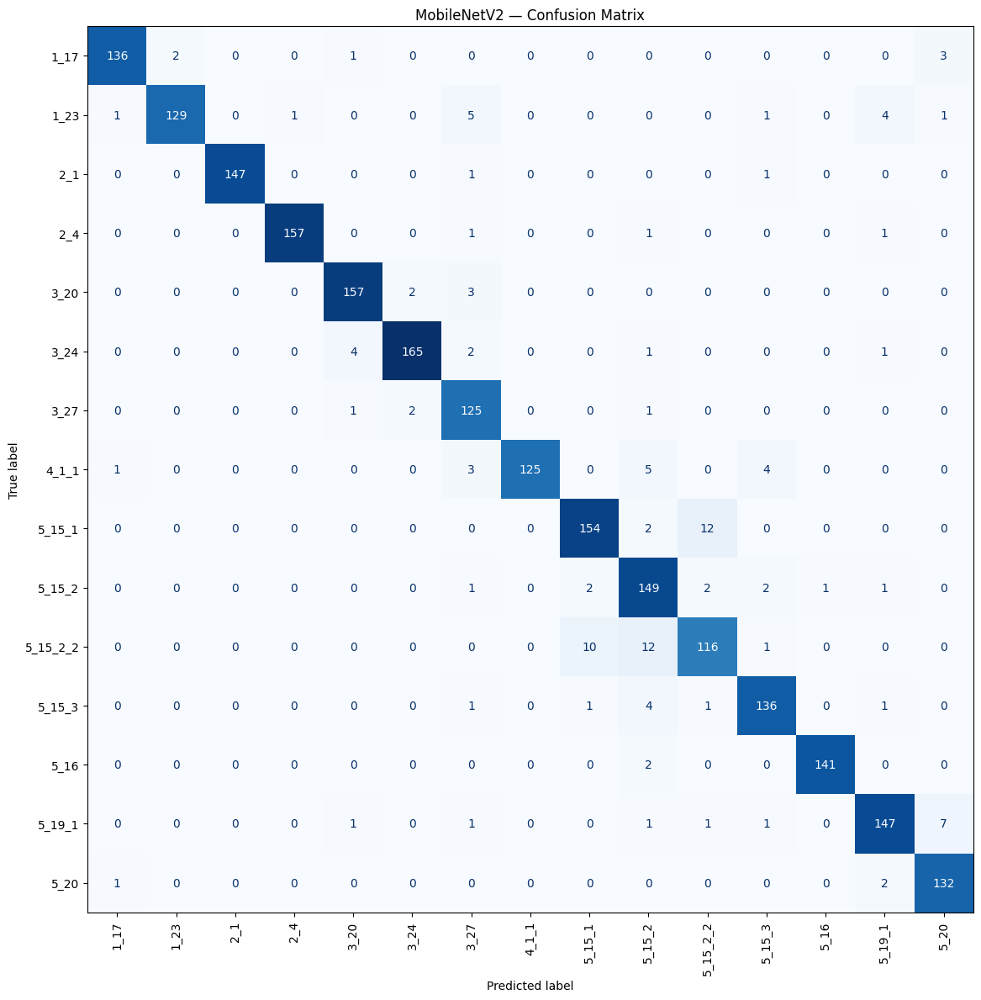

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(12, 12))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=class_names
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

ax.set_title("MobileNetV2 — Confusion Matrix")
plt.tight_layout()
plt.show()

In [ ]:
import os

RESULTS_DIR = "/content/drive/MyDrive/RTSD_practice/results"
MODELS_DIR = "/content/drive/MyDrive/RTSD_practice/models"

os.makedirs(RESULTS_DIR, exist_ok=True)
os.makedirs(MODELS_DIR, exist_ok=True)

print("Папки готовы.")

Папки готовы.


In [ ]:
mobilenet_model.save(
    os.path.join(MODELS_DIR, "MobileNetV2.keras")
)

print("✅ MobileNetV2 сохранена.")

✅ MobileNetV2 сохранена.


In [ ]:
import json

with open(
    os.path.join(RESULTS_DIR, "MobileNetV2_history.json"),
    "w"
) as f:
    json.dump(history_mobilenet.history, f)

print("✅ История обучения сохранена.")

✅ История обучения сохранена.


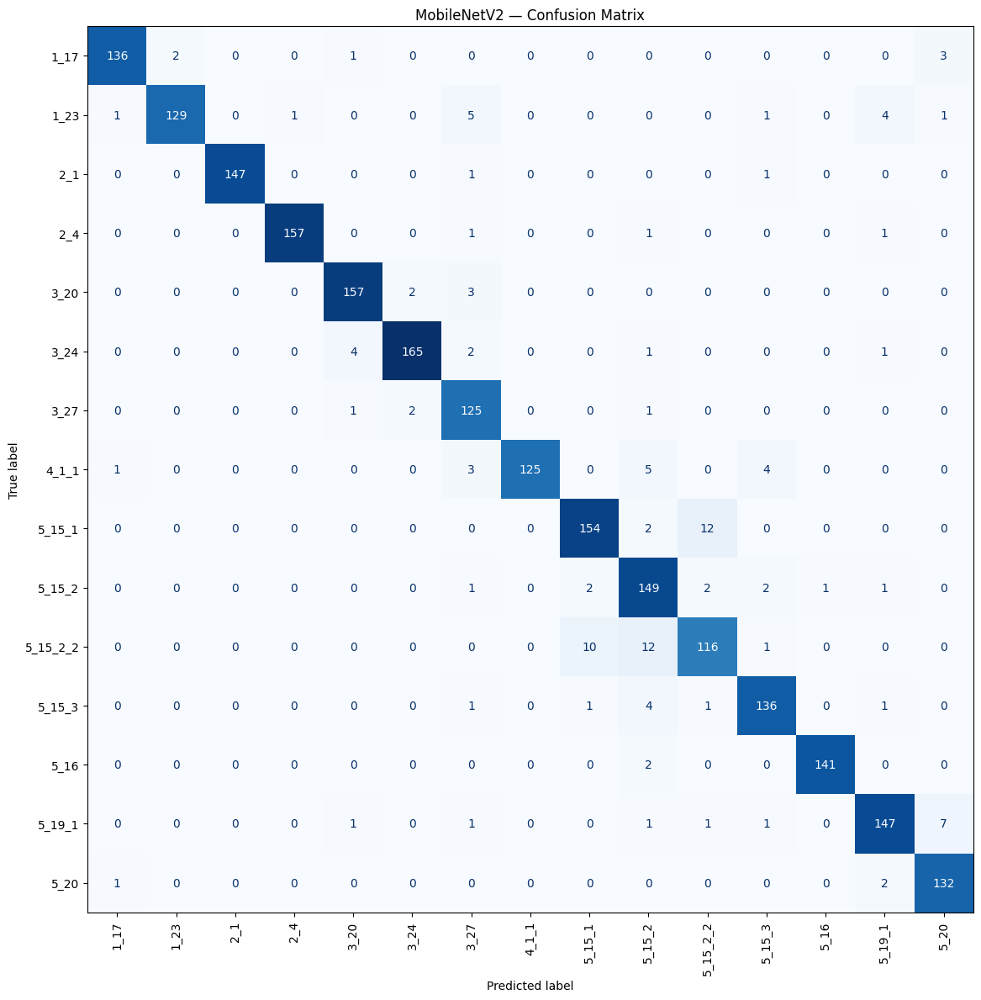

✅ Матрица сохранена.


In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(12, 12))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=class_names
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

ax.set_title("MobileNetV2 — Confusion Matrix")
plt.tight_layout()

plt.savefig(
    os.path.join(RESULTS_DIR, "MobileNetV2_confusion_matrix.png"),
    dpi=200,
    bbox_inches="tight"
)

plt.show()

print("✅ Матрица сохранена.")

In [ ]:
mobilenet_result = pd.DataFrame([{
    "model": "MobileNetV2",
    "accuracy": accuracy,
    "precision_macro": precision,
    "recall_macro": recall,
    "f1_macro": f1,
    "test_loss": test_loss,
    "epochs": EPOCHS,
    "input_size": "224x224",
    "batch_size": BATCH_SIZE,
    "total_params": mobilenet_model.count_params(),
    "trainable_params": sum(
        tf.keras.backend.count_params(w)
        for w in mobilenet_model.trainable_weights
    ),
    "non_trainable_params": sum(
        tf.keras.backend.count_params(w)
        for w in mobilenet_model.non_trainable_weights
    )
}])

mobilenet_result.to_csv(
    os.path.join(RESULTS_DIR, "MobileNetV2_metrics.csv"),
    index=False
)

mobilenet_result

,model,accuracy,precision_macro,recall_macro,f1_macro,test_loss,epochs,input_size,batch_size,total_params,trainable_params,non_trainable_params
0,MobileNetV2,0.944221,0.945764,0.943914,0.944087,0.167565,5,224x224,32,2277199,19215,2257984


In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras import layers, Model

base_model = ResNet50(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3)
)

base_model.trainable = False

inputs = layers.Input(shape=(224, 224, 3))

x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.2)(x)

outputs = layers.Dense(
    NUM_CLASSES,
    activation="softmax"
)(x)

resnet_model = Model(inputs, outputs)

resnet_model.summary()

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ data_augmentation   │ (None, 224, 224,  │          0 │ input_layer_18[0… │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_6          │ (None, 224, 224)  │          0 │ data_augmentatio… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_7          │ (None, 224, 224)  │          0 │ data_augmentatio… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_8          │ (None, 224, 224)  │          0 │ data_augmentatio… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack_2 (Stack)     │ (None, 224, 224,  │          0 │ get_item_6[0][0], │
│                     │ 3)                │            │ get_item_7[0][0], │
│                     │                   │            │ get_item_8[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, 224, 224,  │          0 │ stack_2[0][0]     │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add_3[0][0]       │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 2048)      │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 15)        │     30,735 │ dropout_7[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 23,618,447 (90.10 MB)

 Trainable params: 30,735 (120.06 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
resnet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("ResNet50 скомпилирована.")

ResNet50 скомпилирована.


In [ ]:
history_resnet = resnet_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 65s 179ms/step - accuracy: 0.8519 - loss: 0.4880 - val_accuracy: 0.9411 - val_loss: 0.2006
Epoch 2/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 57s 172ms/step - accuracy: 0.9451 - loss: 0.1799 - val_accuracy: 0.9455 - val_loss: 0.1737
Epoch 3/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 57s 172ms/step - accuracy: 0.9580 - loss: 0.1388 - val_accuracy: 0.9593 - val_loss: 0.1460
Epoch 4/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 57s 173ms/step - accuracy: 0.9651 - loss: 0.1112 - val_accuracy: 0.9601 - val_loss: 0.1251
Epoch 5/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 57s 172ms/step - accuracy: 0.9675 - loss: 0.1023 - val_accuracy: 0.9663 - val_loss: 0.1219


In [ ]:
test_loss, test_accuracy = resnet_model.evaluate(
    test_ds,
    verbose=1
)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - accuracy: 0.9683 - loss: 0.1070
Test Loss: 0.1070
Test Accuracy: 0.9683


In [ ]:
import numpy as np
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

y_true_resnet = np.concatenate([
    labels.numpy()
    for _, labels in test_ds
])

y_prob_resnet = resnet_model.predict(test_ds, verbose=1)
y_pred_resnet = np.argmax(y_prob_resnet, axis=1)

accuracy_resnet = accuracy_score(y_true_resnet, y_pred_resnet)
precision_resnet = precision_score(
    y_true_resnet, y_pred_resnet,
    average="macro", zero_division=0
)
recall_resnet = recall_score(
    y_true_resnet, y_pred_resnet,
    average="macro", zero_division=0
)
f1_resnet = f1_score(
    y_true_resnet, y_pred_resnet,
    average="macro", zero_division=0
)

print("ResNet50 — Test metrics")
print(f"Accuracy : {accuracy_resnet:.4f}")
print(f"Precision: {precision_resnet:.4f}")
print(f"Recall   : {recall_resnet:.4f}")
print(f"F1-score : {f1_resnet:.4f}")

print("\nClassification report:")
print(
    classification_report(
        y_true_resnet,
        y_pred_resnet,
        target_names=class_names,
        digits=4,
        zero_division=0
    )
)

71/71 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step
ResNet50 — Test metrics
Accuracy : 0.9683
Precision: 0.9684
Recall   : 0.9686
F1-score : 0.9683

Classification report:
              precision    recall  f1-score   support

        1_17     0.9718    0.9718    0.9718       142
        1_23     0.9517    0.9718    0.9617       142
         2_1     1.0000    0.9933    0.9966       149
         2_4     0.9876    0.9938    0.9907       160
        3_20     0.9697    0.9877    0.9786       162
        3_24     0.9882    0.9653    0.9766       173
        3_27     0.9621    0.9845    0.9732       129
       4_1_1     1.0000    0.9493    0.9740       138
      5_15_1     0.9753    0.9405    0.9576       168
      5_15_2     0.9608    0.9304    0.9453       158
    5_15_2_2     0.9097    0.9424    0.9258       139
      5_15_3     0.9038    0.9792    0.9400       144
        5_16     1.0000    1.0000    1.0000       143
      5_19_1     0.9682    0.9560    0.9620       159
        5_20     0.9774    

In [ ]:
resnet_model.save(
    os.path.join(MODELS_DIR, "ResNet50.keras")
)

print("✅ ResNet50 сохранена.")

✅ ResNet50 сохранена.


In [ ]:
with open(
    os.path.join(RESULTS_DIR, "ResNet50_history.json"),
    "w"
) as f:
    json.dump(history_resnet.history, f)

print("✅ История ResNet50 сохранена.")

✅ История ResNet50 сохранена.


In [ ]:
resnet_result = pd.DataFrame([{
    "model": "ResNet50",
    "accuracy": accuracy_resnet,
    "precision_macro": precision_resnet,
    "recall_macro": recall_resnet,
    "f1_macro": f1_resnet,
    "test_loss": test_loss,
    "epochs": EPOCHS,
    "input_size": "224x224",
    "batch_size": BATCH_SIZE,
    "total_params": resnet_model.count_params(),
    "trainable_params": sum(
        tf.keras.backend.count_params(w)
        for w in resnet_model.trainable_weights
    ),
    "non_trainable_params": sum(
        tf.keras.backend.count_params(w)
        for w in resnet_model.non_trainable_weights
    )
}])

resnet_result.to_csv(
    os.path.join(RESULTS_DIR, "ResNet50_metrics.csv"),
    index=False
)

resnet_result

,model,accuracy,precision_macro,recall_macro,f1_macro,test_loss,epochs,input_size,batch_size,total_params,trainable_params,non_trainable_params
0,ResNet50,0.968318,0.968425,0.96859,0.968269,0.107015,5,224x224,32,23618447,30735,23587712


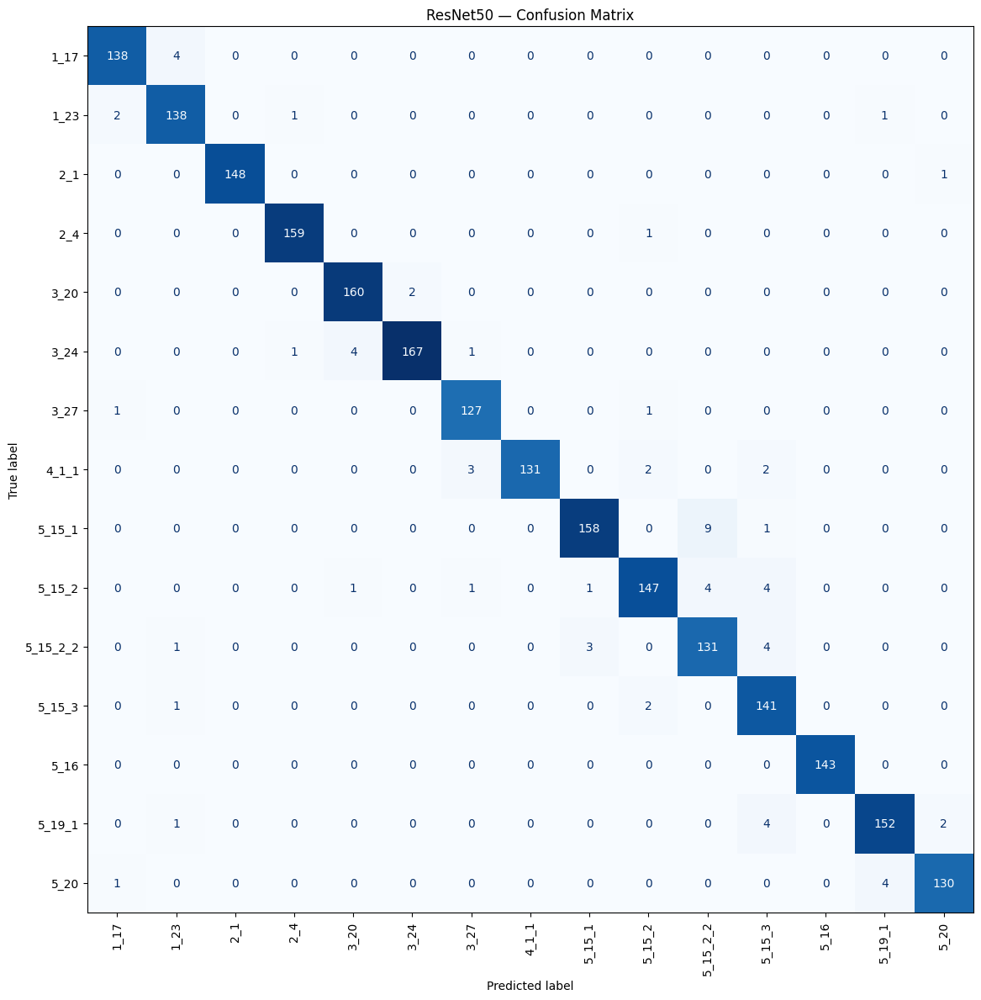

In [ ]:
cm_resnet = confusion_matrix(y_true_resnet, y_pred_resnet)

fig, ax = plt.subplots(figsize=(12, 12))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_resnet,
    display_labels=class_names
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

ax.set_title("ResNet50 — Confusion Matrix")
plt.tight_layout()

plt.savefig(
    os.path.join(RESULTS_DIR, "ResNet50_confusion_matrix.png"),
    dpi=200,
    bbox_inches="tight"
)

plt.show()

In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers, Model

# Базовая модель EfficientNetB0 с ImageNet
base_model = EfficientNetB0(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3)
)

# Замораживаем базовую модель
base_model.trainable = False

# Вход
inputs = layers.Input(shape=(224, 224, 3))

# Аугментация
x = data_augmentation(inputs)

# EfficientNetB0 в Keras включает необходимое масштабирование
# входных значений внутри самой модели
x = base_model(x, training=False)

# Классификатор
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.2)(x)

outputs = layers.Dense(
    NUM_CLASSES,
    activation="softmax"
)(x)

efficientnet_model = Model(inputs, outputs)

efficientnet_model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_8      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 15)             │        19,215 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,068,786 (15.52 MB)

 Trainable params: 19,215 (75.06 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
efficientnet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("EfficientNetB0 скомпилирована.")

EfficientNetB0 скомпилирована.


In [ ]:
history_efficientnet = efficientnet_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 45s 105ms/step - accuracy: 0.7969 - loss: 0.8150 - val_accuracy: 0.9061 - val_loss: 0.3842
Epoch 2/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - accuracy: 0.9096 - loss: 0.3517 - val_accuracy: 0.9269 - val_loss: 0.2835
Epoch 3/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - accuracy: 0.9271 - loss: 0.2733 - val_accuracy: 0.9291 - val_loss: 0.2484
Epoch 4/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - accuracy: 0.9337 - loss: 0.2391 - val_accuracy: 0.9407 - val_loss: 0.2148
Epoch 5/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - accuracy: 0.9411 - loss: 0.2126 - val_accuracy: 0.9455 - val_loss: 0.1948


In [ ]:
test_loss, test_accuracy = efficientnet_model.evaluate(
    test_ds,
    verbose=1
)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

71/71 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - accuracy: 0.9460 - loss: 0.1768
Test Loss: 0.1768
Test Accuracy: 0.9460


In [ ]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)
import numpy as np

y_true_efficientnet = np.concatenate([
    labels.numpy()
    for _, labels in test_ds
])

y_prob_efficientnet = efficientnet_model.predict(
    test_ds,
    verbose=1
)

y_pred_efficientnet = np.argmax(
    y_prob_efficientnet,
    axis=1
)

accuracy_efficientnet = accuracy_score(
    y_true_efficientnet,
    y_pred_efficientnet
)

precision_efficientnet = precision_score(
    y_true_efficientnet,
    y_pred_efficientnet,
    average="macro",
    zero_division=0
)

recall_efficientnet = recall_score(
    y_true_efficientnet,
    y_pred_efficientnet,
    average="macro",
    zero_division=0
)

f1_efficientnet = f1_score(
    y_true_efficientnet,
    y_pred_efficientnet,
    average="macro",
    zero_division=0
)

print("EfficientNetB0 — Test metrics")
print(f"Accuracy : {accuracy_efficientnet:.4f}")
print(f"Precision: {precision_efficientnet:.4f}")
print(f"Recall   : {recall_efficientnet:.4f}")
print(f"F1-score : {f1_efficientnet:.4f}")

print("\nClassification report:")
print(
    classification_report(
        y_true_efficientnet,
        y_pred_efficientnet,
        target_names=class_names,
        digits=4,
        zero_division=0
    )
)

71/71 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step
EfficientNetB0 — Test metrics
Accuracy : 0.9460
Precision: 0.9459
Recall   : 0.9467
F1-score : 0.9457

Classification report:
              precision    recall  f1-score   support

        1_17     0.9706    0.9296    0.9496       142
        1_23     0.9500    0.9366    0.9433       142
         2_1     0.9932    0.9732    0.9831       149
         2_4     0.9812    0.9812    0.9812       160
        3_20     0.9412    0.9877    0.9639       162
        3_24     0.9938    0.9249    0.9581       173
        3_27     0.8993    0.9690    0.9328       129
       4_1_1     0.9708    0.9638    0.9673       138
      5_15_1     0.9752    0.9345    0.9544       168
      5_15_2     0.8981    0.8924    0.8952       158
    5_15_2_2     0.8649    0.9209    0.8920       139
      5_15_3     0.8839    0.9514    0.9164       144
        5_16     0.9597    1.0000    0.9795       143
      5_19_1     0.9724    0.8868    0.9276       159
        5_20     0.934

In [ ]:
efficientnet_model.save(
    os.path.join(MODELS_DIR, "EfficientNetB0.keras")
)

print("✅ EfficientNetB0 сохранена.")

✅ EfficientNetB0 сохранена.


In [ ]:
with open(
    os.path.join(RESULTS_DIR, "EfficientNetB0_history.json"),
    "w"
) as f:
    json.dump(history_efficientnet.history, f)

print("✅ История EfficientNetB0 сохранена.")

✅ История EfficientNetB0 сохранена.


In [ ]:
efficientnet_result = pd.DataFrame([{
    "model": "EfficientNetB0",
    "accuracy": accuracy_efficientnet,
    "precision_macro": precision_efficientnet,
    "recall_macro": recall_efficientnet,
    "f1_macro": f1_efficientnet,
    "test_loss": test_loss,
    "epochs": EPOCHS,
    "input_size": "224x224",
    "batch_size": BATCH_SIZE,
    "total_params": efficientnet_model.count_params(),
    "trainable_params": sum(
        tf.keras.backend.count_params(w)
        for w in efficientnet_model.trainable_weights
    ),
    "non_trainable_params": sum(
        tf.keras.backend.count_params(w)
        for w in efficientnet_model.non_trainable_weights
    )
}])

efficientnet_result.to_csv(
    os.path.join(RESULTS_DIR, "EfficientNetB0_metrics.csv"),
    index=False
)

efficientnet_result

,model,accuracy,precision_macro,recall_macro,f1_macro,test_loss,epochs,input_size,batch_size,total_params,trainable_params,non_trainable_params
0,EfficientNetB0,0.946006,0.945898,0.946666,0.945702,0.176764,5,224x224,32,4068786,19215,4049571.0


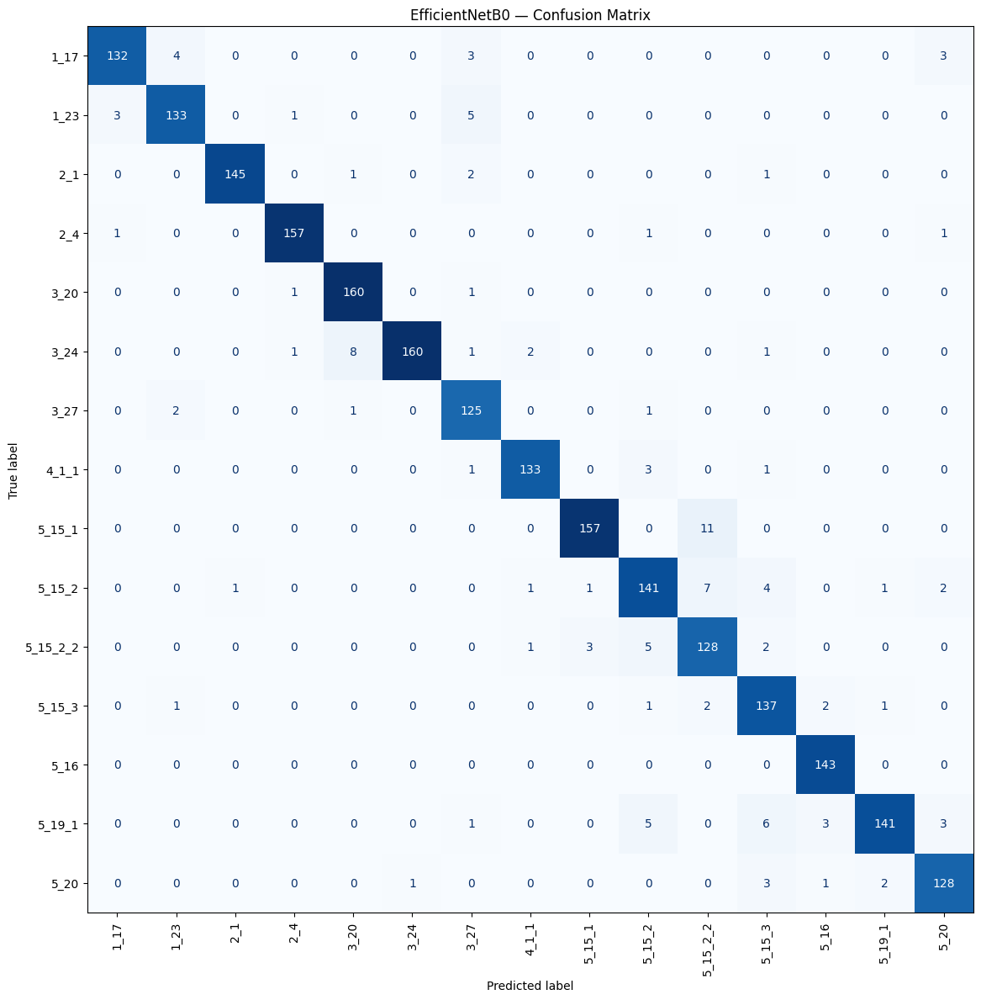

In [ ]:
cm_efficientnet = confusion_matrix(
    y_true_efficientnet,
    y_pred_efficientnet
)

fig, ax = plt.subplots(figsize=(12, 12))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_efficientnet,
    display_labels=class_names
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

ax.set_title("EfficientNetB0 — Confusion Matrix")
plt.tight_layout()

plt.savefig(
    os.path.join(
        RESULTS_DIR,
        "EfficientNetB0_confusion_matrix.png"
    ),
    dpi=200,
    bbox_inches="tight"
)

plt.show()

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import layers, Model

# Базовая модель VGG16 с ImageNet
base_model = VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3)
)

# Замораживаем базовую модель
base_model.trainable = False

# Вход
inputs = layers.Input(shape=(224, 224, 3))

# Аугментация
x = data_augmentation(inputs)

# Preprocessing VGG16
x = preprocess_input(x)

# Базовая CNN
x = base_model(x, training=False)

# Классификатор
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.2)(x)

outputs = layers.Dense(
    NUM_CLASSES,
    activation="softmax"
)(x)

vgg_model = Model(inputs, outputs)

vgg_model.summary()

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_22      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ data_augmentation   │ (None, 224, 224,  │          0 │ input_layer_22[0… │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_9          │ (None, 224, 224)  │          0 │ data_augmentatio… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_10         │ (None, 224, 224)  │          0 │ data_augmentatio… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_11         │ (None, 224, 224)  │          0 │ data_augmentatio… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack_3 (Stack)     │ (None, 224, 224,  │          0 │ get_item_9[0][0], │
│                     │ 3)                │            │ get_item_10[0][0… │
│                     │                   │            │ get_item_11[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, 224, 224,  │          0 │ stack_3[0][0]     │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vgg16 (Functional)  │ (None, 7, 7, 512) │ 14,714,688 │ add_4[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 512)       │          0 │ vgg16[0][0]       │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 512)       │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 15)        │      7,695 │ dropout_9[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 14,722,383 (56.16 MB)

 Trainable params: 7,695 (30.06 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
vgg_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("VGG16 скомпилирована.")

VGG16 скомпилирована.


In [ ]:
history_vgg = vgg_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 63s 188ms/step - accuracy: 0.6377 - loss: 1.4067 - val_accuracy: 0.8928 - val_loss: 0.3645
Epoch 2/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 61s 185ms/step - accuracy: 0.8723 - loss: 0.4025 - val_accuracy: 0.9327 - val_loss: 0.2372
Epoch 3/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 61s 186ms/step - accuracy: 0.9049 - loss: 0.2955 - val_accuracy: 0.9424 - val_loss: 0.2064
Epoch 4/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 61s 186ms/step - accuracy: 0.9271 - loss: 0.2352 - val_accuracy: 0.9522 - val_loss: 0.1754
Epoch 5/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 61s 185ms/step - accuracy: 0.9293 - loss: 0.2113 - val_accuracy: 0.9548 - val_loss: 0.1690


In [ ]:
test_loss, test_accuracy = vgg_model.evaluate(
    test_ds,
    verbose=1
)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - accuracy: 0.9603 - loss: 0.1381
Test Loss: 0.1381
Test Accuracy: 0.9603


In [ ]:
import numpy as np
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

y_true_vgg = np.concatenate([
    labels.numpy()
    for _, labels in test_ds
])

y_prob_vgg = vgg_model.predict(test_ds, verbose=1)
y_pred_vgg = np.argmax(y_prob_vgg, axis=1)

accuracy_vgg = accuracy_score(y_true_vgg, y_pred_vgg)

precision_vgg = precision_score(
    y_true_vgg,
    y_pred_vgg,
    average="macro",
    zero_division=0
)

recall_vgg = recall_score(
    y_true_vgg,
    y_pred_vgg,
    average="macro",
    zero_division=0
)

f1_vgg = f1_score(
    y_true_vgg,
    y_pred_vgg,
    average="macro",
    zero_division=0
)

print("VGG16 — Test metrics")
print(f"Accuracy : {accuracy_vgg:.4f}")
print(f"Precision: {precision_vgg:.4f}")
print(f"Recall   : {recall_vgg:.4f}")
print(f"F1-score : {f1_vgg:.4f}")

print("\nClassification report:")
print(
    classification_report(
        y_true_vgg,
        y_pred_vgg,
        target_names=class_names,
        digits=4,
        zero_division=0
    )
)

71/71 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step
VGG16 — Test metrics
Accuracy : 0.9603
Precision: 0.9606
Recall   : 0.9598
F1-score : 0.9600

Classification report:
              precision    recall  f1-score   support

        1_17     0.9718    0.9718    0.9718       142
        1_23     0.9580    0.9648    0.9614       142
         2_1     0.9867    0.9933    0.9900       149
         2_4     0.9691    0.9812    0.9752       160
        3_20     0.9817    0.9938    0.9877       162
        3_24     0.9880    0.9538    0.9706       173
        3_27     0.9407    0.9845    0.9621       129
       4_1_1     0.9638    0.9638    0.9638       138
      5_15_1     0.9205    0.9643    0.9419       168
      5_15_2     0.9317    0.9494    0.9404       158
    5_15_2_2     0.9297    0.8561    0.8914       139
      5_15_3     0.9648    0.9514    0.9580       144
        5_16     0.9860    0.9860    0.9860       143
      5_19_1     0.9321    0.9497    0.9408       159
        5_20     0.9844    0.9

In [ ]:
vgg_model.save(
    os.path.join(MODELS_DIR, "VGG16.keras")
)

print("✅ VGG16 сохранена.")

✅ VGG16 сохранена.


In [ ]:
with open(
    os.path.join(RESULTS_DIR, "VGG16_history.json"),
    "w"
) as f:
    json.dump(history_vgg.history, f)

print("✅ История VGG16 сохранена.")

✅ История VGG16 сохранена.


In [ ]:
vgg_result = pd.DataFrame([{
    "model": "VGG16",
    "accuracy": accuracy_vgg,
    "precision_macro": precision_vgg,
    "recall_macro": recall_vgg,
    "f1_macro": f1_vgg,
    "test_loss": test_loss,
    "epochs": EPOCHS,
    "input_size": "224x224",
    "batch_size": BATCH_SIZE,
    "total_params": vgg_model.count_params(),
    "trainable_params": sum(
        tf.keras.backend.count_params(w)
        for w in vgg_model.trainable_weights
    ),
    "non_trainable_params": sum(
        tf.keras.backend.count_params(w)
        for w in vgg_model.non_trainable_weights
    )
}])

vgg_result.to_csv(
    os.path.join(RESULTS_DIR, "VGG16_metrics.csv"),
    index=False
)

vgg_result

,model,accuracy,precision_macro,recall_macro,f1_macro,test_loss,epochs,input_size,batch_size,total_params,trainable_params,non_trainable_params
0,VGG16,0.960286,0.960601,0.959813,0.959953,0.138088,5,224x224,32,14722383,7695,14714688


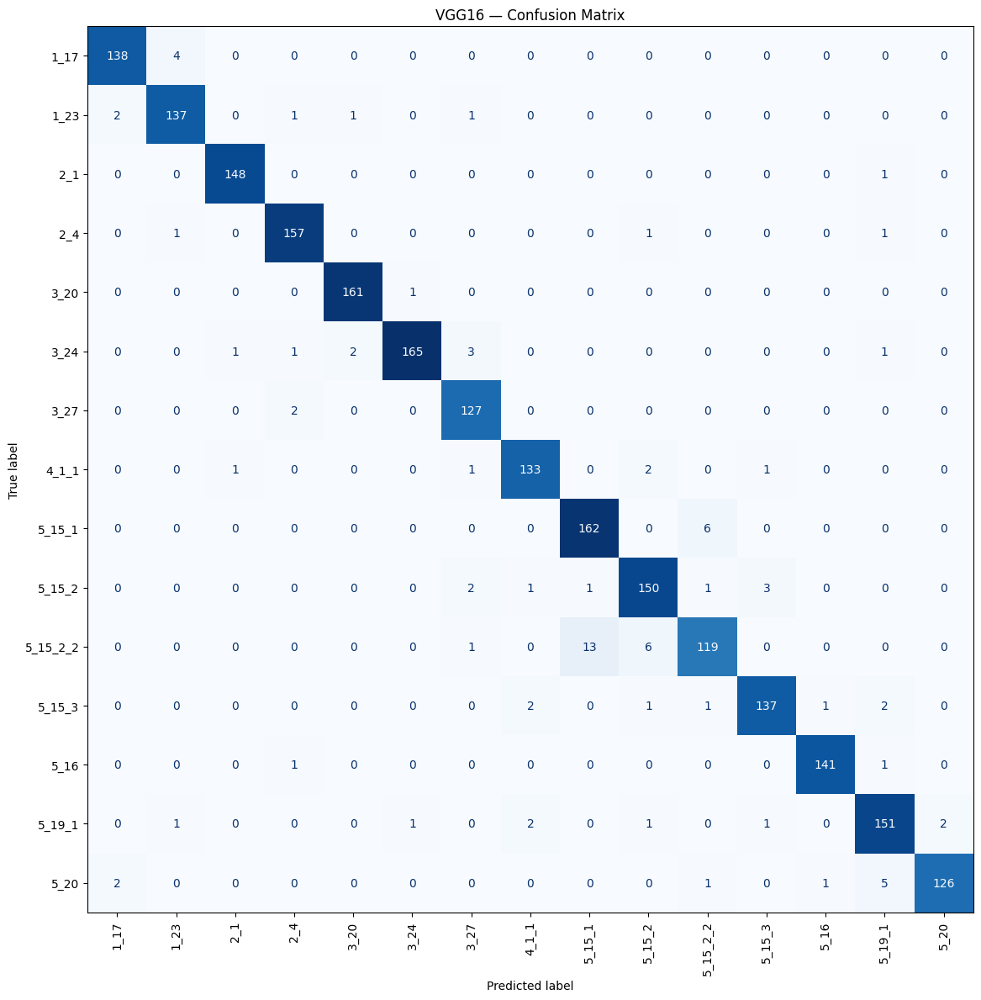

In [ ]:
cm_vgg = confusion_matrix(
    y_true_vgg,
    y_pred_vgg
)

fig, ax = plt.subplots(figsize=(12, 12))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_vgg,
    display_labels=class_names
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

ax.set_title("VGG16 — Confusion Matrix")
plt.tight_layout()

plt.savefig(
    os.path.join(
        RESULTS_DIR,
        "VGG16_confusion_matrix.png"
    ),
    dpi=200,
    bbox_inches="tight"
)

plt.show()

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras import layers, Model

# Базовая модель DenseNet121 с ImageNet
base_model = DenseNet121(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3)
)

# Замораживаем базовую модель
base_model.trainable = False

# Вход
inputs = layers.Input(shape=(224, 224, 3))

# Аугментация
x = data_augmentation(inputs)

# Preprocessing DenseNet121
x = preprocess_input(x)

# Базовая CNN
x = base_model(x, training=False)

# Классификатор
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.2)(x)

outputs = layers.Dense(
    NUM_CLASSES,
    activation="softmax"
)(x)

densenet_model = Model(inputs, outputs)

densenet_model.summary()

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_24 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_5 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ add_5 (Add)                     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_6 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_10     │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 15)             │        15,375 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,052,879 (26.90 MB)

 Trainable params: 15,375 (60.06 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [ ]:
densenet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("DenseNet121 скомпилирована.")

DenseNet121 скомпилирована.


In [ ]:
history_densenet = densenet_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 78s 201ms/step - accuracy: 0.6970 - loss: 1.0177 - val_accuracy: 0.8875 - val_loss: 0.4224
Epoch 2/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 62s 189ms/step - accuracy: 0.8732 - loss: 0.4301 - val_accuracy: 0.9212 - val_loss: 0.2995
Epoch 3/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 62s 190ms/step - accuracy: 0.8988 - loss: 0.3383 - val_accuracy: 0.9274 - val_loss: 0.2557
Epoch 4/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 72s 220ms/step - accuracy: 0.9100 - loss: 0.2928 - val_accuracy: 0.9327 - val_loss: 0.2330
Epoch 5/5
329/329 ━━━━━━━━━━━━━━━━━━━━ 63s 190ms/step - accuracy: 0.9204 - loss: 0.2610 - val_accuracy: 0.9358 - val_loss: 0.2096


In [ ]:
test_loss, test_accuracy = densenet_model.evaluate(
    test_ds,
    verbose=1
)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - accuracy: 0.9398 - loss: 0.1991
Test Loss: 0.1991
Test Accuracy: 0.9398


In [ ]:
import numpy as np
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

y_true_densenet = np.concatenate([
    labels.numpy()
    for _, labels in test_ds
])

y_prob_densenet = densenet_model.predict(
    test_ds,
    verbose=1
)

y_pred_densenet = np.argmax(
    y_prob_densenet,
    axis=1
)

accuracy_densenet = accuracy_score(
    y_true_densenet,
    y_pred_densenet
)

precision_densenet = precision_score(
    y_true_densenet,
    y_pred_densenet,
    average="macro",
    zero_division=0
)

recall_densenet = recall_score(
    y_true_densenet,
    y_pred_densenet,
    average="macro",
    zero_division=0
)

f1_densenet = f1_score(
    y_true_densenet,
    y_pred_densenet,
    average="macro",
    zero_division=0
)

print("DenseNet121 — Test metrics")
print(f"Accuracy : {accuracy_densenet:.4f}")
print(f"Precision: {precision_densenet:.4f}")
print(f"Recall   : {recall_densenet:.4f}")
print(f"F1-score : {f1_densenet:.4f}")

print("\nClassification report:")
print(
    classification_report(
        y_true_densenet,
        y_pred_densenet,
        target_names=class_names,
        digits=4,
        zero_division=0
    )
)

71/71 ━━━━━━━━━━━━━━━━━━━━ 16s 187ms/step
DenseNet121 — Test metrics
Accuracy : 0.9398
Precision: 0.9405
Recall   : 0.9395
F1-score : 0.9392

Classification report:
              precision    recall  f1-score   support

        1_17     0.9510    0.9577    0.9544       142
        1_23     0.9710    0.9437    0.9571       142
         2_1     0.9866    0.9866    0.9866       149
         2_4     0.9515    0.9812    0.9662       160
        3_20     0.9257    1.0000    0.9614       162
        3_24     0.9938    0.9249    0.9581       173
        3_27     0.9764    0.9612    0.9688       129
       4_1_1     0.8940    0.9783    0.9343       138
      5_15_1     0.8722    0.9345    0.9023       168
      5_15_2     0.9198    0.9430    0.9313       158
    5_15_2_2     0.8926    0.7770    0.8308       139
      5_15_3     0.9281    0.8958    0.9117       144
        5_16     0.9726    0.9930    0.9827       143
      5_19_1     0.9583    0.8679    0.9109       159
        5_20     0.9143 

In [ ]:
densenet_model.save(
    os.path.join(MODELS_DIR, "DenseNet121.keras")
)

print("✅ DenseNet121 сохранена.")

✅ DenseNet121 сохранена.


In [ ]:
with open(
    os.path.join(RESULTS_DIR, "DenseNet121_history.json"),
    "w"
) as f:
    json.dump(history_densenet.history, f)

print("✅ История DenseNet121 сохранена.")

✅ История DenseNet121 сохранена.


In [ ]:
densenet_result = pd.DataFrame([{
    "model": "DenseNet121",
    "accuracy": accuracy_densenet,
    "precision_macro": precision_densenet,
    "recall_macro": recall_densenet,
    "f1_macro": f1_densenet,
    "test_loss": test_loss,
    "epochs": EPOCHS,
    "input_size": "224x224",
    "batch_size": BATCH_SIZE,
    "total_params": densenet_model.count_params(),
    "trainable_params": sum(
        tf.keras.backend.count_params(w)
        for w in densenet_model.trainable_weights
    ),
    "non_trainable_params": sum(
        tf.keras.backend.count_params(w)
        for w in densenet_model.non_trainable_weights
    )
}])

densenet_result.to_csv(
    os.path.join(RESULTS_DIR, "DenseNet121_metrics.csv"),
    index=False
)

densenet_result

,model,accuracy,precision_macro,recall_macro,f1_macro,test_loss,epochs,input_size,batch_size,total_params,trainable_params,non_trainable_params
0,DenseNet121,0.939759,0.940526,0.939536,0.93915,0.199112,5,224x224,32,7052879,15375,7037504


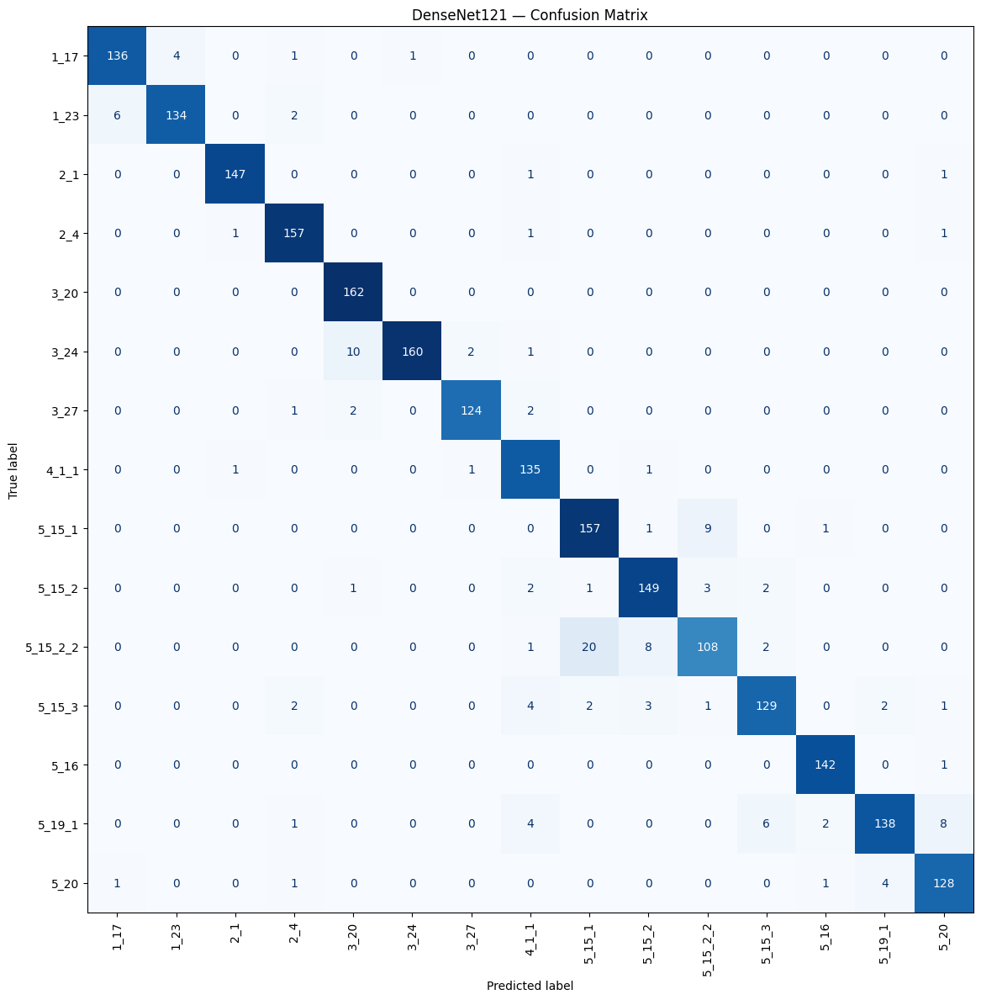

In [ ]:
cm_densenet = confusion_matrix(
    y_true_densenet,
    y_pred_densenet
)

fig, ax = plt.subplots(figsize=(12, 12))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_densenet,
    display_labels=class_names
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

ax.set_title("DenseNet121 — Confusion Matrix")
plt.tight_layout()

plt.savefig(
    os.path.join(
        RESULTS_DIR,
        "DenseNet121_confusion_matrix.png"
    ),
    dpi=200,
    bbox_inches="tight"
)

plt.show()

In [ ]:
import pandas as pd
import os

metrics_files = [
    "MobileNetV2_metrics.csv",
    "ResNet50_metrics.csv",
    "EfficientNetB0_metrics.csv",
    "VGG16_metrics.csv",
    "DenseNet121_metrics.csv"
]

results_list = []

for filename in metrics_files:
    path = os.path.join(RESULTS_DIR, filename)

    df = pd.read_csv(path)
    results_list.append(df)

comparison_df = pd.concat(
    results_list,
    ignore_index=True
)

comparison_df = comparison_df.sort_values(
    "f1_macro",
    ascending=False
).reset_index(drop=True)

print("Сравнение пяти моделей:")
display(comparison_df)

Сравнение пяти моделей:


,model,accuracy,precision_macro,recall_macro,f1_macro,test_loss,epochs,input_size,batch_size,total_params,trainable_params,non_trainable_params
0,ResNet50,0.968318,0.968425,0.968590,0.968269,0.107015,5,224x224,32,23618447,30735,23587712.0
1,VGG16,0.960286,0.960601,0.959813,0.959953,0.138088,5,224x224,32,14722383,7695,14714688.0
2,EfficientNetB0,0.946006,0.945898,0.946666,0.945702,0.176764,5,224x224,32,4068786,19215,4049571.0
3,MobileNetV2,0.944221,0.945764,0.943914,0.944087,0.167565,5,224x224,32,2277199,19215,2257984.0
4,DenseNet121,0.939759,0.940526,0.939536,0.939150,0.199112,5,224x224,32,7052879,15375,7037504.0


In [ ]:
import time
import numpy as np
import pandas as pd

# Берём один batch
test_images, test_labels = next(iter(test_ds))

models = {
    "MobileNetV2": mobilenet_model,
    "ResNet50": resnet_model,
    "EfficientNetB0": efficientnet_model,
    "VGG16": vgg_model,
    "DenseNet121": densenet_model
}

N_RUNS = 50
BATCH_SIZE_SPEED = test_images.shape[0]

inference_results = []

for model_name, model in models.items():

    # Warm-up
    for _ in range(5):
        output = model(test_images, training=False)
        _ = output.numpy()

    # Измерение
    start = time.perf_counter()

    for _ in range(N_RUNS):
        output = model(test_images, training=False)
        _ = output.numpy()  # ждём завершения GPU

    end = time.perf_counter()

    total_time = end - start
    total_images = N_RUNS * BATCH_SIZE_SPEED

    mean_ms_per_image = (total_time / total_images) * 1000

    inference_results.append({
        "model": model_name,
        "mean_inference_ms": mean_ms_per_image,
        "batch_size": BATCH_SIZE_SPEED,
        "runs": N_RUNS
    })

inference_df = pd.DataFrame(inference_results)

print("Стабильное измерение скорости инференса:")
display(
    inference_df.sort_values(
        "mean_inference_ms"
    ).reset_index(drop=True)
)

Стабильное измерение скорости инференса:


,model,mean_inference_ms,batch_size,runs
0,MobileNetV2,4.807671,32,50
1,VGG16,6.626910,32,50
2,ResNet50,7.405343,32,50
3,EfficientNetB0,9.207965,32,50
4,DenseNet121,14.458775,32,50


In [ ]:
import os
import pandas as pd

model_files = {
    "MobileNetV2": "MobileNetV2.keras",
    "ResNet50": "ResNet50.keras",
    "EfficientNetB0": "EfficientNetB0.keras",
    "VGG16": "VGG16.keras",
    "DenseNet121": "DenseNet121.keras"
}

model_size_results = []

for model_name, filename in model_files.items():
    path = os.path.join(MODELS_DIR, filename)

    size_mb = os.path.getsize(path) / (1024 ** 2)

    model_size_results.append({
        "model": model_name,
        "size_mb": size_mb
    })

model_size_df = pd.DataFrame(model_size_results)

display(
    model_size_df.sort_values("size_mb").reset_index(drop=True)
)

,model,size_mb
0,MobileNetV2,9.408007
1,EfficientNetB0,16.487319
2,DenseNet121,28.482356
3,VGG16,56.321661
4,ResNet50,90.974771


In [ ]:
final_comparison = comparison_df.merge(
    inference_df[["model", "mean_inference_ms"]],
    on="model",
    how="left"
).merge(
    model_size_df,
    on="model",
    how="left"
)

final_comparison = final_comparison.sort_values(
    "f1_macro",
    ascending=False
).reset_index(drop=True)

final_comparison.to_csv(
    os.path.join(RESULTS_DIR, "models_comparison_final.csv"),
    index=False
)

display(final_comparison)

,model,accuracy,precision_macro,recall_macro,f1_macro,test_loss,epochs,input_size,batch_size,total_params,trainable_params,non_trainable_params,mean_inference_ms,size_mb
0,ResNet50,0.968318,0.968425,0.968590,0.968269,0.107015,5,224x224,32,23618447,30735,23587712.0,7.405343,90.974771
1,VGG16,0.960286,0.960601,0.959813,0.959953,0.138088,5,224x224,32,14722383,7695,14714688.0,6.626910,56.321661
2,EfficientNetB0,0.946006,0.945898,0.946666,0.945702,0.176764,5,224x224,32,4068786,19215,4049571.0,9.207965,16.487319
3,MobileNetV2,0.944221,0.945764,0.943914,0.944087,0.167565,5,224x224,32,2277199,19215,2257984.0,4.807671,9.408007
4,DenseNet121,0.939759,0.940526,0.939536,0.939150,0.199112,5,224x224,32,7052879,15375,7037504.0,14.458775,28.482356


In [ ]:
error_df = test_df.copy()

error_df["true_class"] = [
    class_names[i] for i in y_true_resnet
]

error_df["pred_class"] = [
    class_names[i] for i in y_pred_resnet
]

error_df["confidence"] = np.max(y_prob_resnet, axis=1)

error_df["filepath"] = error_df.apply(
    lambda row: os.path.join(
        DATASET_ROOT,
        row["class_name"],
        row["filename"]
    ),
    axis=1
)

errors = error_df[
    error_df["true_class"] != error_df["pred_class"]
].copy()

errors = errors.sort_values(
    "confidence",
    ascending=False
)

print("Всего ошибок ResNet50:", len(errors))

display(
    errors[
        [
            "filename",
            "true_class",
            "pred_class",
            "confidence"
        ]
    ].head(20)
)

Всего ошибок ResNet50: 71


,filename,true_class,pred_class,confidence
1956,5_15_1_0972.jpg,5_15_1,5_15_2_2,0.993027
1814,5_15_1_0116.jpg,5_15_1,5_15_2_2,0.973880
2088,5_15_2_2_0913.jpg,5_15_2_2,5_15_1,0.969073
474,5_15_2_0112.jpg,5_15_2,5_15_3,0.959639
495,5_15_2_0278.jpg,5_15_2,5_15_2_2,0.930241
609,3_24_0006.jpg,3_24,3_20,0.918278
2148,1_17_0365.jpg,1_17,1_23,0.917528
1661,5_15_3_0078.jpg,5_15_3,5_15_2,0.901167
155,5_19_1_0970.jpg,5_19_1,5_15_3,0.866311
1177,1_23_0733.jpg,1_23,1_17,0.841960


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

examples = errors.head(6)

plt.figure(figsize=(15, 10))

for i, (_, row) in enumerate(examples.iterrows()):
    img = Image.open(row["filepath"])

    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(
        f"Истина: {row['true_class']}\n"
        f"Предсказание: {row['pred_class']}\n"
        f"Уверенность: {row['confidence']:.1%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

NameError: name 'errors' is not defined

In [ ]:
errors[
    ["filename", "true_class", "pred_class", "confidence"]
].head(10)

,filename,true_class,pred_class,confidence
1956,5_15_1_0972.jpg,5_15_1,5_15_2_2,0.993027
1814,5_15_1_0116.jpg,5_15_1,5_15_2_2,0.973880
2088,5_15_2_2_0913.jpg,5_15_2_2,5_15_1,0.969073
474,5_15_2_0112.jpg,5_15_2,5_15_3,0.959639
495,5_15_2_0278.jpg,5_15_2,5_15_2_2,0.930241
609,3_24_0006.jpg,3_24,3_20,0.918278
2148,1_17_0365.jpg,1_17,1_23,0.917528
1661,5_15_3_0078.jpg,5_15_3,5_15_2,0.901167
155,5_19_1_0970.jpg,5_19_1,5_15_3,0.866311
1177,1_23_0733.jpg,1_23,1_17,0.841960


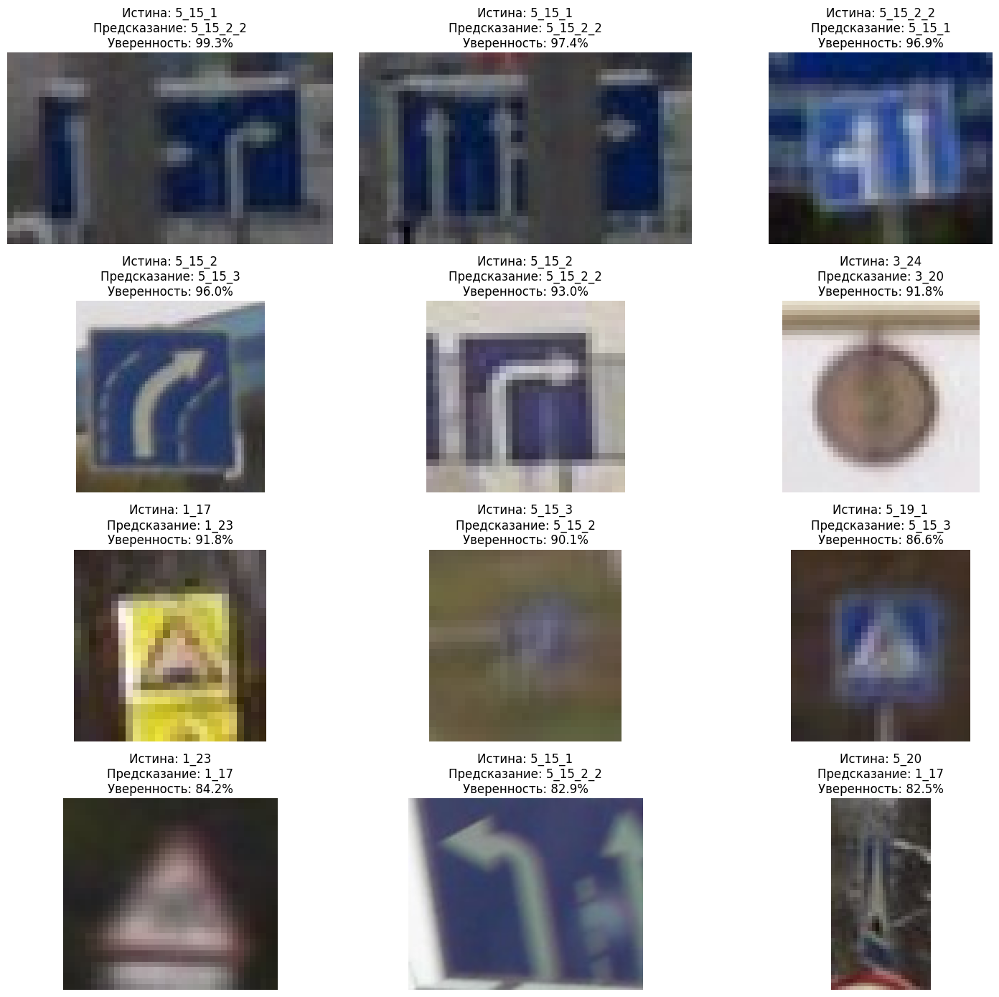

In [ ]:
examples = errors.iloc[0:12]

plt.figure(figsize=(15, 14))

for i, (_, row) in enumerate(examples.iterrows()):
    img = Image.open(row["filepath"])

    plt.subplot(4, 3, i + 1)
    plt.imshow(img)
    plt.title(
        f"Истина: {row['true_class']}\n"
        f"Предсказание: {row['pred_class']}\n"
        f"Уверенность: {row['confidence']:.1%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import os

MODEL_DIR = "/content/drive/MyDrive/RTSD_practice/models"
RESULTS_DIR = "/content/drive/MyDrive/RTSD_practice/results"

print("MODELS:")
print(os.listdir(MODEL_DIR))

print("\nRESULTS:")
print(os.listdir(RESULTS_DIR))

MODELS:
['MobileNetV2.keras', 'ResNet50.keras', 'EfficientNetB0.keras', 'VGG16.keras', 'DenseNet121.keras']

RESULTS:
['MobileNetV2_metrics.csv', 'MobileNetV2_history.json', 'MobileNetV2_confusion_matrix.png', 'ResNet50_history.json', 'ResNet50_confusion_matrix.png', 'ResNet50_metrics.csv', 'EfficientNetB0_confusion_matrix.png', 'EfficientNetB0_history.json', 'EfficientNetB0_metrics.csv', 'VGG16_history.json', 'VGG16_confusion_matrix.png', 'VGG16_metrics.csv', 'DenseNet121_metrics.csv', 'DenseNet121_confusion_matrix.png', 'DenseNet121_history.json', 'models_comparison_final.csv']


In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf

from tensorflow.keras.models import load_model
from PIL import Image
import cv2

# Пути
DATASET_ROOT = "/content/prepared_dataset"
MODEL_DIR = "/content/drive/MyDrive/RTSD_practice/models"

# Metadata
train_df = pd.read_csv(
    "/content/drive/MyDrive/RTSD_practice/train_metadata.csv"
)

val_df = pd.read_csv(
    "/content/drive/MyDrive/RTSD_practice/val_metadata.csv"
)

test_df = pd.read_csv(
    "/content/drive/MyDrive/RTSD_practice/test_metadata.csv"
)

# Классы
class_names = sorted(train_df["class_name"].unique())

class_to_label = {
    class_name: i
    for i, class_name in enumerate(class_names)
}

# Labels + правильные пути
for df in [train_df, val_df, test_df]:
    df["label"] = df["class_name"].map(class_to_label)

    df["filepath"] = df.apply(
        lambda row: os.path.join(
            DATASET_ROOT,
            row["class_name"],
            row["filename"]
        ),
        axis=1
    )

# Загружаем сохранённую ResNet50
resnet_model = load_model(
    os.path.join(MODEL_DIR, "ResNet50.keras")
)

print("Классов:", len(class_names))
print("Train:", len(train_df))
print("Val:", len(val_df))
print("Test:", len(test_df))
print("Все test-файлы существуют:",
      test_df["filepath"].map(os.path.exists).all())
print("ResNet50 загружена.")

Классов: 15
Train: 10501
Val: 2258
Test: 2241
Все test-файлы существуют: True
ResNet50 загружена.


In [ ]:
import os
import tarfile

ARCHIVE_PATH = "/content/drive/MyDrive/RTSD_practice/prepared_dataset_15k.tar"

with tarfile.open(ARCHIVE_PATH, "r") as tar:
    tar.extractall("/content")

print("Датасет распакован.")
print(
    "Все test-файлы существуют:",
    test_df["filepath"].map(os.path.exists).all()
)

/tmp/ipykernel_2230/163302434.py:7: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall("/content")


Датасет распакован.
Все test-файлы существуют: True


In [ ]:
import os

print("Содержимое /content:")
for item in os.listdir("/content"):
    print(item)

Содержимое /content:
.config
prepared_dataset
drive
sample_data


In [ ]:
import os

for root, dirs, files in os.walk("/content"):
    level = root.replace("/content", "").count(os.sep)

    if level > 2:
        dirs[:] = []

    print(
        "  " * level + os.path.basename(root) + "/",
        f"(files: {len(files)})"
    )

content/ (files: 0)
  .config/ (files: 8)
    configurations/ (files: 1)
    logs/ (files: 0)
      2026.08.24/ (files: 6)
  prepared_dataset/ (files: 0)
    1_23/ (files: 1000)
    5_16/ (files: 1000)
    1_17/ (files: 1000)
    5_15_2/ (files: 1000)
    5_15_2_2/ (files: 1000)
    5_15_3/ (files: 1000)
    2_4/ (files: 1000)
    3_24/ (files: 1000)
    3_20/ (files: 1000)
    4_1_1/ (files: 1000)
    5_15_1/ (files: 1000)
    3_27/ (files: 1000)
    2_1/ (files: 1000)
    5_19_1/ (files: 1000)
    5_20/ (files: 1000)
  drive/ (files: 0)
    MyDrive/ (files: 12)
      RTSD_practice/ (files: 5)
    .shortcut-targets-by-id/ (files: 0)
    .Trash-0/ (files: 0)
      files/ (files: 0)
      info/ (files: 0)
    .Encrypted/ (files: 0)
      MyDrive/ (files: 0)
      .shortcut-targets-by-id/ (files: 0)
  sample_data/ (files: 6)


In [ ]:
DATASET_ROOT = "/content/prepared_dataset"

# Обновляем пути к изображениям
for df in [train_df, val_df, test_df]:
    df["filepath"] = df.apply(
        lambda row: os.path.join(
            DATASET_ROOT,
            row["class_name"],
            row["filename"]
        ),
        axis=1
    )

print("Все test-файлы существуют:",
      test_df["filepath"].map(os.path.exists).all())

print("Количество test-файлов:", len(test_df))

Все test-файлы существуют: True
Количество test-файлов: 2241


In [ ]:
# Восстанавливаем числовые labels после сброса Colab

class_names = sorted(train_df["class_name"].unique())

class_to_label = {
    class_name: i
    for i, class_name in enumerate(class_names)
}

for df in [train_df, val_df, test_df]:
    df["label"] = df["class_name"].map(class_to_label)

print("Классов:", len(class_names))
print("Пример соответствия:")
for i, class_name in enumerate(class_names):
    print(i, "->", class_name)

print("\nРаспределение test labels:")
print(test_df["label"].value_counts().sort_index())

Классов: 15
Пример соответствия:
0 -> 1_17
1 -> 1_23
2 -> 2_1
3 -> 2_4
4 -> 3_20
5 -> 3_24
6 -> 3_27
7 -> 4_1_1
8 -> 5_15_1
9 -> 5_15_2
10 -> 5_15_2_2
11 -> 5_15_3
12 -> 5_16
13 -> 5_19_1
14 -> 5_20

Распределение test labels:
label
0     142
1     142
2     149
3     160
4     162
5     173
6     129
7     138
8     168
9     158
10    139
11    144
12    143
13    159
14    135
Name: count, dtype: int64


In [ ]:
import cv2
import numpy as np
from PIL import Image

IMG_SIZE = (224, 224)

def load_raw_image(filepath):
    img = Image.open(filepath).convert("RGB")
    return np.array(img)


def make_condition_image(img, condition):
    if condition == "small":
        img = cv2.resize(
            img, (64, 64),
            interpolation=cv2.INTER_AREA
        )
        img = cv2.resize(
            img, IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    elif condition == "blur":
        img = cv2.GaussianBlur(img, (9, 9), 0)
        img = cv2.resize(
            img, IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    elif condition == "dark":
        img = img.astype(np.float32) * 0.40
        img = np.clip(img, 0, 255).astype(np.uint8)
        img = cv2.resize(
            img, IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    else:
        img = cv2.resize(
            img, IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    return img.astype(np.float32)


def evaluate_stress_condition(df, condition):
    images = []
    labels = []

    for _, row in df.iterrows():
        img = load_raw_image(row["filepath"])
        img = make_condition_image(img, condition)

        images.append(img)
        labels.append(row["label"])

    images = np.array(images, dtype=np.float32)
    labels = np.array(labels)

    probabilities = resnet_model.predict(
        images,
        batch_size=32,
        verbose=1
    )

    predictions = np.argmax(probabilities, axis=1)
    accuracy = np.mean(predictions == labels)

    return accuracy

In [ ]:
import cv2
import numpy as np
import pandas as pd
from PIL import Image

# ---------------------------------------------------------
# Формируем сбалансированную выборку:
# 20 изображений на каждый из 15 классов = 300 изображений
# ---------------------------------------------------------

stress_df = (
    test_df
    .groupby("class_name", group_keys=False)
    .sample(n=20, random_state=42)
    .reset_index(drop=True)
)

print("Размер stress-test:", len(stress_df))
print("Изображений на класс:")
print(stress_df["class_name"].value_counts().sort_index())

Размер stress-test: 300
Изображений на класс:
class_name
1_17        20
1_23        20
2_1         20
2_4         20
3_20        20
3_24        20
3_27        20
4_1_1       20
5_15_1      20
5_15_2      20
5_15_2_2    20
5_15_3      20
5_16        20
5_19_1      20
5_20        20
Name: count, dtype: int64


In [ ]:
IMG_SIZE = (224, 224)

def load_raw_image(filepath):
    img = Image.open(filepath).convert("RGB")
    img = np.array(img)
    return img


def make_condition_image(img, condition):
    if condition == "small":
        # Имитируем маленький знак:
        # сначала сильно уменьшаем, затем увеличиваем обратно
        img = cv2.resize(img, (64, 64), interpolation=cv2.INTER_AREA)
        img = cv2.resize(img, IMG_SIZE, interpolation=cv2.INTER_LINEAR)

    elif condition == "blur":
        # Имитируем размытие
        img = cv2.GaussianBlur(img, (9, 9), 0)
        img = cv2.resize(img, IMG_SIZE, interpolation=cv2.INTER_LINEAR)

    elif condition == "dark":
        # Имитируем плохое освещение
        img = img.astype(np.float32) * 0.40
        img = np.clip(img, 0, 255).astype(np.uint8)
        img = cv2.resize(img, IMG_SIZE, interpolation=cv2.INTER_LINEAR)

    else:
        img = cv2.resize(img, IMG_SIZE, interpolation=cv2.INTER_LINEAR)

    return img.astype(np.float32)


def evaluate_stress_condition(df, condition):
    images = []
    labels = []

    for _, row in df.iterrows():
        img = load_raw_image(row["filepath"])
        img = make_condition_image(img, condition)

        images.append(img)
        labels.append(row["label"])

    images = np.array(images, dtype=np.float32)
    labels = np.array(labels)

    # Сохраняем вычисления по batch, чтобы не перегружать память
    probabilities = resnet_model.predict(
        images,
        batch_size=32,
        verbose=1
    )

    predictions = np.argmax(probabilities, axis=1)
    accuracy = np.mean(predictions == labels)

    return accuracy


results_stress = {}

for condition in ["small", "blur", "dark"]:
    print("\n" + "=" * 50)
    print("Условия:", condition)
    print("=" * 50)

    acc = evaluate_stress_condition(stress_df, condition)
    results_stress[condition] = acc

    print(f"Accuracy: {acc:.4f} ({acc:.2%})")


Условия: small
10/10 ━━━━━━━━━━━━━━━━━━━━ 64s 6s/step
Accuracy: 0.9700 (97.00%)

Условия: blur
10/10 ━━━━━━━━━━━━━━━━━━━━ 56s 6s/step
Accuracy: 0.8633 (86.33%)

Условия: dark
10/10 ━━━━━━━━━━━━━━━━━━━━ 53s 5s/step
Accuracy: 0.9367 (93.67%)


In [ ]:
acc_small_2 = evaluate_stress_condition(stress_df, "small")

print(f"Повторная проверка small: {acc_small_2:.4f} ({acc_small_2:.2%})")

10/10 ━━━━━━━━━━━━━━━━━━━━ 53s 5s/step
Повторная проверка small: 0.9700 (97.00%)


In [ ]:
# Accuracy на исходных изображениях той же самой stress-test выборки

original_acc = evaluate_stress_condition(stress_df, "original")

print(
    f"Original (те же 300 изображений): "
    f"{original_acc:.4f} ({original_acc:.2%})"
)

print(
    f"Small (64x64 -> 224x224): "
    f"{results_stress['small']:.4f} ({results_stress['small']:.2%})"
)

10/10 ━━━━━━━━━━━━━━━━━━━━ 54s 5s/step
Original (те же 300 изображений): 0.9633 (96.33%)
Small (64x64 -> 224x224): 0.9700 (97.00%)


In [ ]:
stress_df_2 = (
    test_df
    .groupby("class_name", group_keys=False)
    .sample(n=20, random_state=123)
    .reset_index(drop=True)
)

print("Размер второй выборки:", len(stress_df_2))

Размер второй выборки: 300


In [ ]:
original_acc_2 = evaluate_stress_condition(
    stress_df_2, "original"
)

small_acc_2 = evaluate_stress_condition(
    stress_df_2, "small"
)

print(f"Original: {original_acc_2:.2%}")
print(f"Small: {small_acc_2:.2%}")
print(
    f"Разница: {(small_acc_2 - original_acc_2) * 100:.2f} п.п."
)

10/10 ━━━━━━━━━━━━━━━━━━━━ 58s 5s/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 50s 5s/step
Original: 95.67%
Small: 96.33%
Разница: 0.67 п.п.


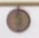

In [ ]:
from IPython.display import display
from PIL import Image

img = Image.open(
    "/content/drive/MyDrive/RTSD_practice/examples/errors/error_3_3_24_to_3_27.jpg"
)

display(img)

In [ ]:
import os
import shutil

EXAMPLES_DIR = "/content/drive/MyDrive/RTSD_practice/examples"
ERRORS_DIR = os.path.join(EXAMPLES_DIR, "errors")

os.makedirs(ERRORS_DIR, exist_ok=True)

source_path = "/content/prepared_dataset/5_20/5_20_0187.jpg"

output_path = os.path.join(
    ERRORS_DIR,
    "error_2_5_20_to_5_19_1.jpg"
)

shutil.copy2(source_path, output_path)

print("Сохранено:")
print(output_path)

Сохранено:
/content/drive/MyDrive/RTSD_practice/examples/errors/error_2_5_20_to_5_19_1.jpg


In [ ]:
source_path = "/content/prepared_dataset/3_24/3_24_0006.jpg"

output_path = os.path.join(
    ERRORS_DIR,
    "error_3_3_24_to_3_27.jpg"
)

shutil.copy2(source_path, output_path)

print("Сохранено:", output_path)

Сохранено: /content/drive/MyDrive/RTSD_practice/examples/errors/error_3_3_24_to_3_27.jpg


In [ ]:
three24_df = test_df[
    test_df["class_name"] == "3_24"
].copy()

images = []

for filepath in three24_df["filepath"]:
    img = Image.open(filepath).convert("RGB")
    img = img.resize((224, 224))
    images.append(np.array(img, dtype=np.float32))

images = np.array(images)

probs_324 = resnet_model.predict(
    images,
    batch_size=32,
    verbose=1
)

preds_324 = np.argmax(probs_324, axis=1)

three24_df["pred_class"] = [
    class_names[i] for i in preds_324
]

three24_df["confidence"] = np.max(
    probs_324,
    axis=1
)

candidate_324 = three24_df[
    three24_df["pred_class"] == "3_27"
].sort_values(
    "confidence",
    key=lambda x: abs(x - 0.654)
)

print(
    candidate_324[
        ["filename", "pred_class", "confidence"]
    ].head(10)
)

6/6 ━━━━━━━━━━━━━━━━━━━━ 29s 4s/step
          filename pred_class  confidence
667  3_24_0290.jpg       3_27    0.751638
746  3_24_0793.jpg       3_27    0.449373
747  3_24_0796.jpg       3_27    0.965634


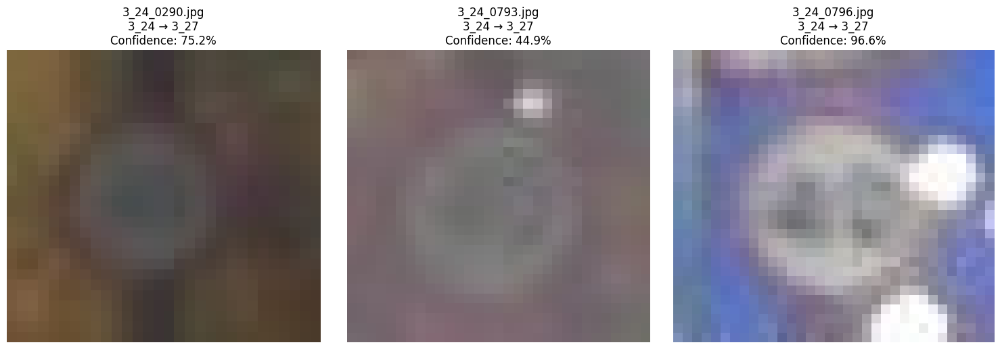

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

candidates = three24_df[
    three24_df["pred_class"] == "3_27"
].copy()

plt.figure(figsize=(15, 5))

for i, (_, row) in enumerate(candidates.iterrows()):
    img = Image.open(row["filepath"])

    plt.subplot(1, 3, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['filename']}\n"
        f"3_24 → 3_27\n"
        f"Confidence: {row['confidence']:.1%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import shutil
import os

source_path = "/content/prepared_dataset/3_24/3_24_0796.jpg"

output_path = (
    "/content/drive/MyDrive/RTSD_practice/examples/"
    "errors/error_3_3_24_to_3_27.jpg"
)

shutil.copy2(source_path, output_path)

print("Сохранено:", output_path)

Сохранено: /content/drive/MyDrive/RTSD_practice/examples/errors/error_3_3_24_to_3_27.jpg


Файлы в папке:
error_1_5_15_1_to_5_15_2_2.jpg
error_3_3_24_to_3_27.jpg
error_2_5_20_to_5_19_1.jpg


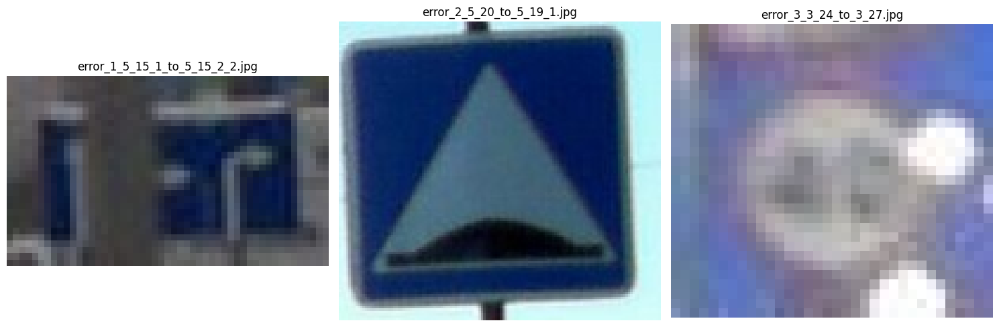

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

ERRORS_DIR = "/content/drive/MyDrive/RTSD_practice/examples/errors"

print("Файлы в папке:")
for f in os.listdir(ERRORS_DIR):
    print(f)

files = [
    "error_1_5_15_1_to_5_15_2_2.jpg",
    "error_2_5_20_to_5_19_1.jpg",
]

# Добавляем третью, если она уже сохранена
third_file = "error_3_3_24_to_3_27.jpg"

if os.path.exists(os.path.join(ERRORS_DIR, third_file)):
    files.append(third_file)

plt.figure(figsize=(15, 5))

for i, filename in enumerate(files):
    path = os.path.join(ERRORS_DIR, filename)

    img = Image.open(path)

    plt.subplot(1, len(files), i + 1)
    plt.imshow(img)
    plt.title(filename)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE

def load_image(filepath, label):
    image = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, IMG_SIZE)
    image = tf.cast(image, tf.float32)
    return image, label


test_ds = tf.data.Dataset.from_tensor_slices(
    (
        test_df["filepath"].values,
        test_df["label"].values
    )
)

test_ds = test_ds.map(
    load_image,
    num_parallel_calls=AUTOTUNE
)

test_ds = test_ds.batch(BATCH_SIZE)
test_ds = test_ds.prefetch(AUTOTUNE)


# Получаем предсказания сохранённой ResNet50
y_prob_final = resnet_model.predict(
    test_ds,
    verbose=1
)

y_pred_final = np.argmax(
    y_prob_final,
    axis=1
)

y_true_final = test_df["label"].values

print(
    f"Test accuracy: "
    f"{np.mean(y_pred_final == y_true_final):.4f}"
)

71/71 ━━━━━━━━━━━━━━━━━━━━ 379s 5s/step
Test accuracy: 0.9683


In [ ]:
# Сохраняем предсказания всех 2241 тестовых изображений

predictions_df = test_df[
    ["filename", "class_name", "label"]
].copy()

predictions_df["pred_label"] = y_pred_final

predictions_df["pred_class"] = [
    class_names[i]
    for i in y_pred_final
]

predictions_df["confidence"] = np.max(
    y_prob_final,
    axis=1
)

PREDICTIONS_PATH = (
    "/content/drive/MyDrive/RTSD_practice/"
    "ResNet50_test_predictions.csv"
)

predictions_df.to_csv(
    PREDICTIONS_PATH,
    index=False
)

print("Предсказания сохранены:")
print(PREDICTIONS_PATH)

print("\nКоличество строк:", len(predictions_df))

Предсказания сохранены:
/content/drive/MyDrive/RTSD_practice/ResNet50_test_predictions.csv

Количество строк: 2241


In [ ]:
correct_final = predictions_df[
    predictions_df["class_name"] ==
    predictions_df["pred_class"]
].copy()

correct_final = correct_final.sort_values(
    "confidence",
    ascending=False
)

print(
    correct_final[
        ["filename", "class_name", "pred_class", "confidence"]
    ].head(20).to_string(index=False)
)

     filename class_name pred_class  confidence
 2_4_0072.jpg        2_4        2_4         1.0
 2_4_0017.jpg        2_4        2_4         1.0
5_16_0913.jpg       5_16       5_16         1.0
5_16_0607.jpg       5_16       5_16         1.0
 2_1_0416.jpg        2_1        2_1         1.0
 2_1_0207.jpg        2_1        2_1         1.0
 2_1_0478.jpg        2_1        2_1         1.0
 2_1_0083.jpg        2_1        2_1         1.0
 2_1_0071.jpg        2_1        2_1         1.0
 2_1_0056.jpg        2_1        2_1         1.0
 2_1_0053.jpg        2_1        2_1         1.0
 2_1_0047.jpg        2_1        2_1         1.0
 2_1_0011.jpg        2_1        2_1         1.0
 2_1_0299.jpg        2_1        2_1         1.0
 2_1_0577.jpg        2_1        2_1         1.0
 2_1_0899.jpg        2_1        2_1         1.0
 2_1_0667.jpg        2_1        2_1         1.0
 2_1_0648.jpg        2_1        2_1         1.0
 2_1_0628.jpg        2_1        2_1         1.0
 2_1_0401.jpg        2_1        2_1     

In [ ]:
# Лучшие правильные примеры: максимум 2 на каждый класс
correct_visual_candidates = (
    correct_final
    .groupby("class_name", group_keys=False)
    .head(2)
)

print(
    correct_visual_candidates[
        ["filename", "class_name", "pred_class", "confidence"]
    ].to_string(index=False)
)

         filename class_name pred_class  confidence
     2_4_0072.jpg        2_4        2_4    1.000000
     2_4_0017.jpg        2_4        2_4    1.000000
    5_16_0913.jpg       5_16       5_16    1.000000
    5_16_0607.jpg       5_16       5_16    1.000000
     2_1_0416.jpg        2_1        2_1    1.000000
     2_1_0207.jpg        2_1        2_1    1.000000
    3_27_0945.jpg       3_27       3_27    1.000000
    3_27_0905.jpg       3_27       3_27    1.000000
   4_1_1_0108.jpg      4_1_1      4_1_1    1.000000
    1_23_0820.jpg       1_23       1_23    1.000000
    3_24_0091.jpg       3_24       3_24    1.000000
    3_24_0093.jpg       3_24       3_24    0.999999
    1_23_0154.jpg       1_23       1_23    0.999999
  5_19_1_0333.jpg     5_19_1     5_19_1    0.999999
    1_17_0338.jpg       1_17       1_17    0.999999
    1_17_0493.jpg       1_17       1_17    0.999999
   4_1_1_0129.jpg      4_1_1      4_1_1    0.999999
    3_20_0675.jpg       3_20       3_20    0.999999
  5_15_3_066

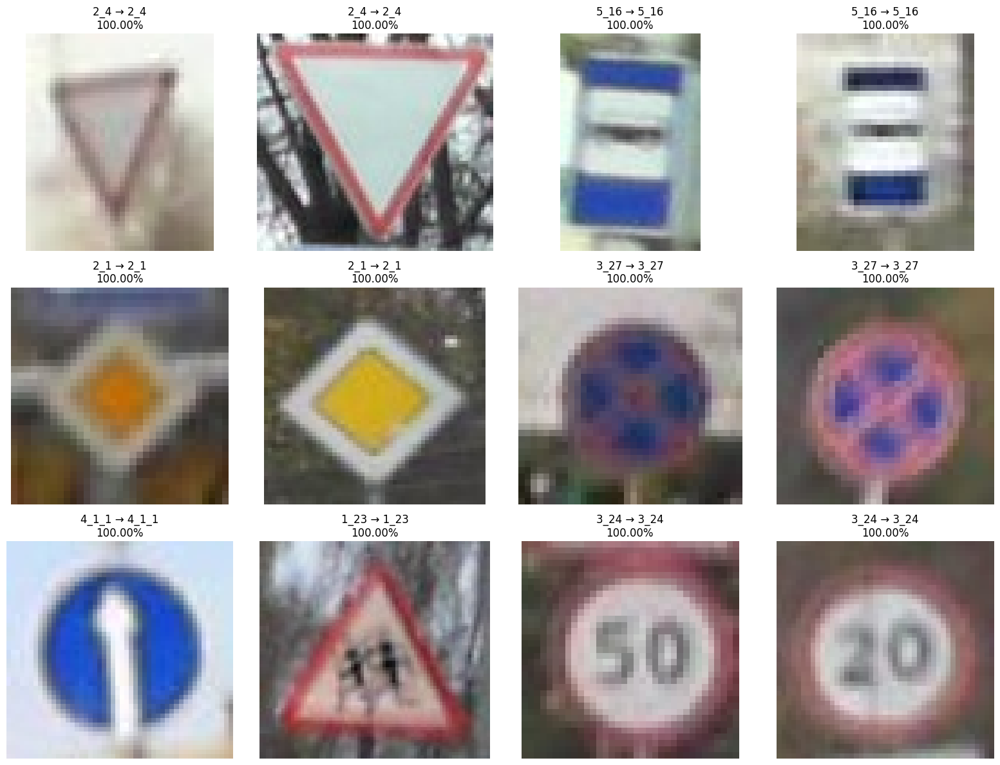

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

candidates = correct_visual_candidates.head(12)

plt.figure(figsize=(16, 12))

for i, (_, row) in enumerate(candidates.iterrows()):
    img = Image.open(
        os.path.join(
            "/content/prepared_dataset",
            row["class_name"],
            row["filename"]
        )
    )

    plt.subplot(3, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['class_name']} → {row['pred_class']}\n"
        f"{row['confidence']:.2%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
correct_low_conf = (
    predictions_df[
        predictions_df["class_name"] == predictions_df["pred_class"]
    ]
    .sort_values("confidence", ascending=True)
)

print(
    correct_low_conf[
        ["filename", "class_name", "pred_class", "confidence"]
    ].head(30).to_string(index=False)
)

         filename class_name pred_class  confidence
    5_20_0533.jpg       5_20       5_20    0.284063
    1_23_0393.jpg       1_23       1_23    0.311358
  5_15_2_0342.jpg     5_15_2     5_15_2    0.332568
  5_15_1_0355.jpg     5_15_1     5_15_1    0.378062
  5_19_1_0741.jpg     5_19_1     5_19_1    0.385410
  5_19_1_0019.jpg     5_19_1     5_19_1    0.404627
    3_24_0148.jpg       3_24       3_24    0.413201
  5_19_1_0592.jpg     5_19_1     5_19_1    0.415186
  5_19_1_0733.jpg     5_19_1     5_19_1    0.438865
    5_20_0396.jpg       5_20       5_20    0.439608
    3_20_0286.jpg       3_20       3_20    0.440604
    3_20_0469.jpg       3_20       3_20    0.455207
    5_20_0721.jpg       5_20       5_20    0.458870
  5_15_2_0626.jpg     5_15_2     5_15_2    0.459154
  5_15_2_0162.jpg     5_15_2     5_15_2    0.464068
     2_4_0555.jpg        2_4        2_4    0.464463
  5_15_2_0537.jpg     5_15_2     5_15_2    0.467184
    3_27_0040.jpg       3_27       3_27    0.492860
5_15_2_2_088

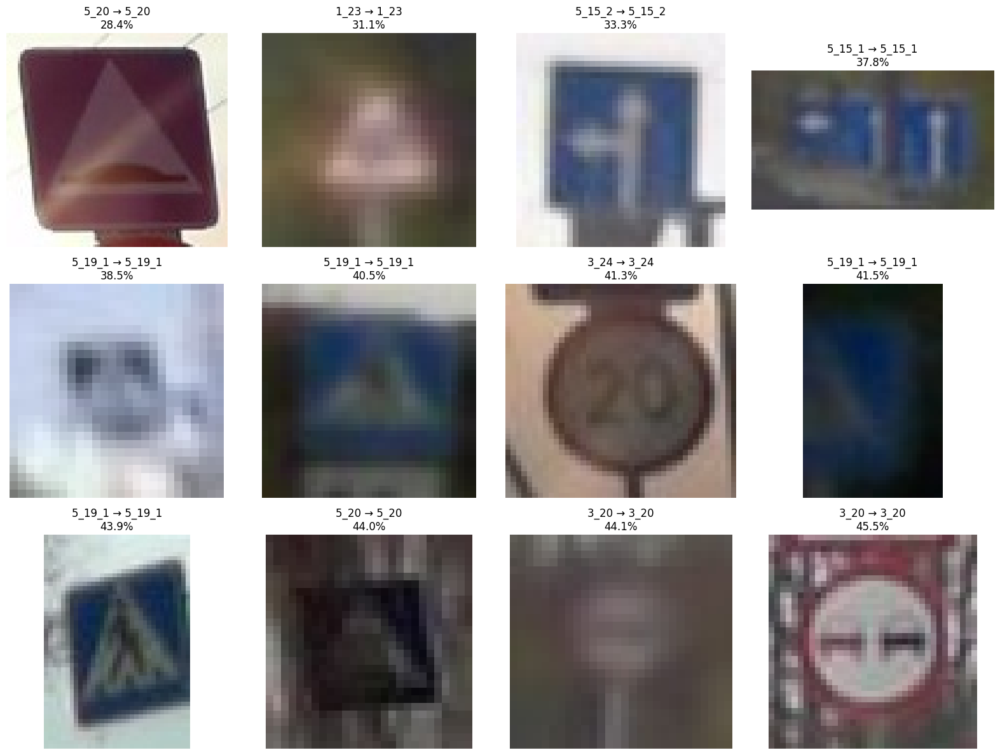

In [ ]:
correct_low_conf["filepath"] = correct_low_conf.apply(
    lambda row: os.path.join(
        "/content/prepared_dataset",
        row["class_name"],
        row["filename"]
    ),
    axis=1
)

candidates = correct_low_conf.head(12)

plt.figure(figsize=(16, 12))

for i, (_, row) in enumerate(candidates.iterrows()):
    img = Image.open(row["filepath"])

    plt.subplot(3, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['class_name']} → {row['pred_class']}\n"
        f"{row['confidence']:.1%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
one_per_class = (
    correct_final
    .sort_values("confidence", ascending=True)
    .groupby("class_name", group_keys=False)
    .head(1)
)

print(
    one_per_class[
        ["filename", "class_name", "pred_class", "confidence"]
    ].to_string(index=False)
)

         filename class_name pred_class  confidence
    5_20_0533.jpg       5_20       5_20    0.284063
    1_23_0393.jpg       1_23       1_23    0.311358
  5_15_2_0342.jpg     5_15_2     5_15_2    0.332568
  5_15_1_0355.jpg     5_15_1     5_15_1    0.378062
  5_19_1_0741.jpg     5_19_1     5_19_1    0.385410
    3_24_0148.jpg       3_24       3_24    0.413201
    3_20_0286.jpg       3_20       3_20    0.440604
     2_4_0555.jpg        2_4        2_4    0.464463
    3_27_0040.jpg       3_27       3_27    0.492860
5_15_2_2_0888.jpg   5_15_2_2   5_15_2_2    0.495722
  5_15_3_0060.jpg     5_15_3     5_15_3    0.516355
   4_1_1_0804.jpg      4_1_1      4_1_1    0.552110
    1_17_0800.jpg       1_17       1_17    0.662268
    5_16_0395.jpg       5_16       5_16    0.873099
     2_1_0041.jpg        2_1        2_1    0.918912


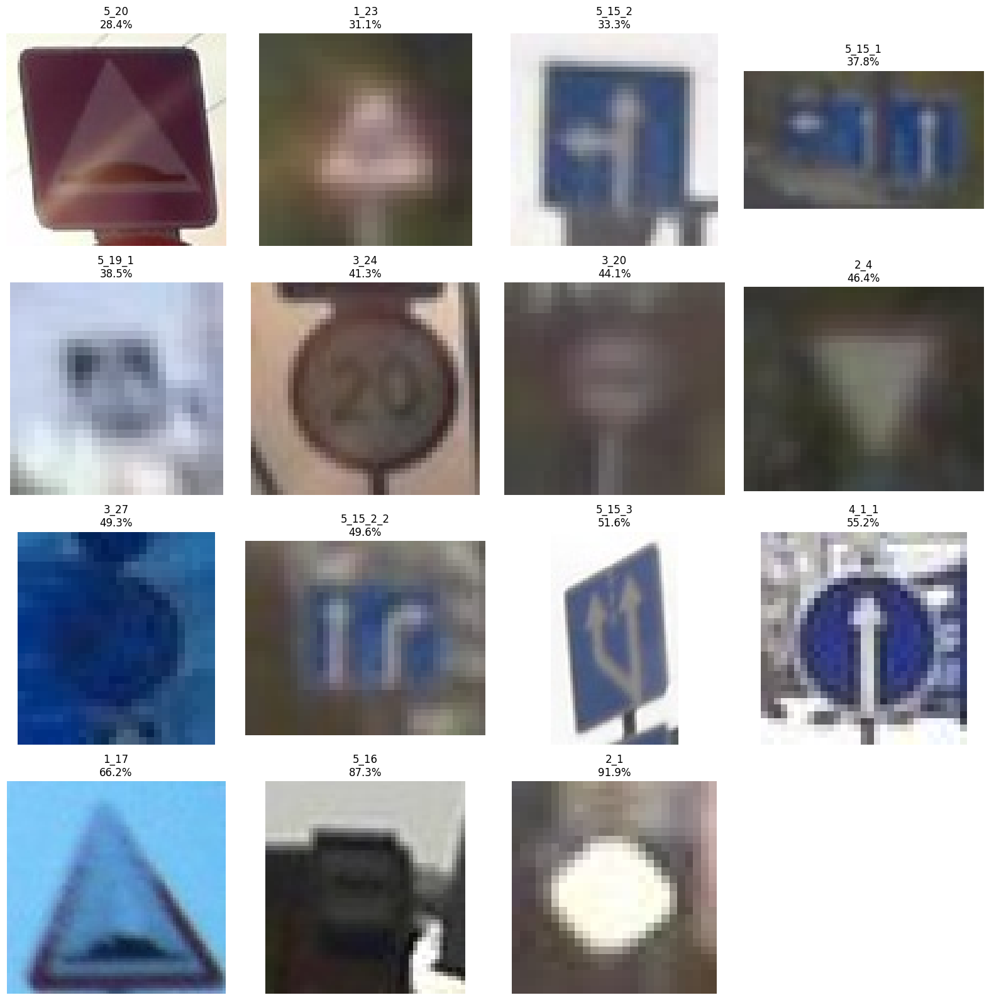

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

candidates = one_per_class

plt.figure(figsize=(16, 16))

for i, (_, row) in enumerate(candidates.iterrows()):
    img = Image.open(
        os.path.join(
            "/content/prepared_dataset",
            row["class_name"],
            row["filename"]
        )
    )

    plt.subplot(4, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['class_name']}\n"
        f"{row['confidence']:.1%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# По одному из разных классов, но с разной уверенностью
candidates = (
    correct_final
    .sort_values("confidence", ascending=True)
    .groupby("class_name", group_keys=False)
    .head(2)
    .reset_index(drop=True)
)

print("Кандидатов:", len(candidates))

Кандидатов: 30


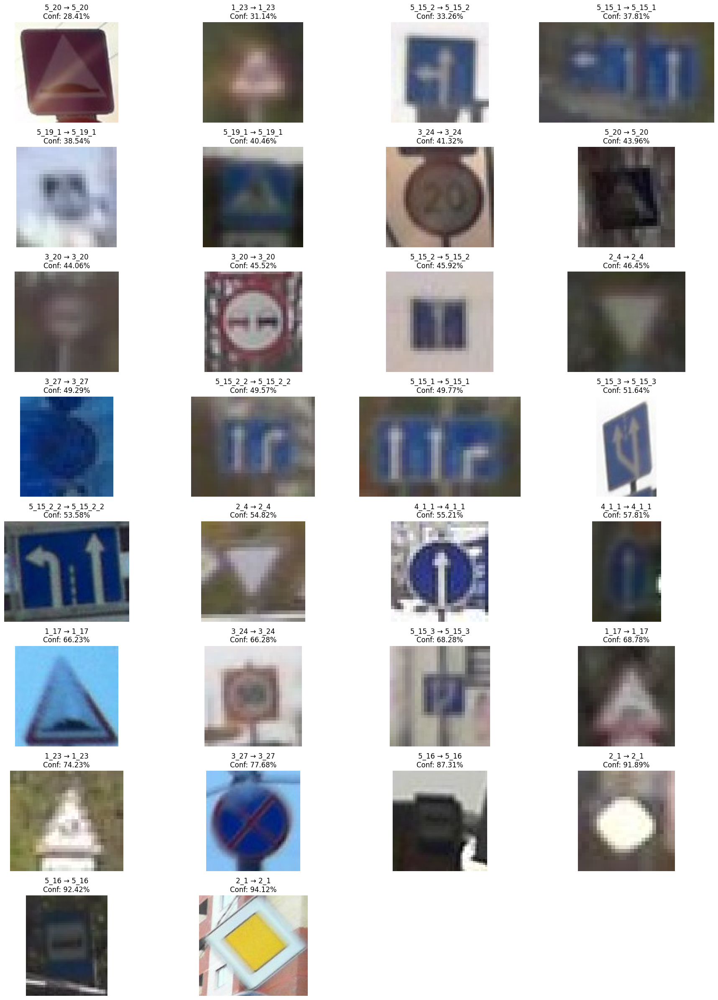

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

plt.figure(figsize=(18, 24))

for i, (_, row) in enumerate(candidates.iterrows()):
    img = Image.open(
        os.path.join(
            "/content/prepared_dataset",
            row["class_name"],
            row["filename"]
        )
    )

    plt.subplot(8, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['class_name']} → {row['pred_class']}\n"
        f"Conf: {row['confidence']:.2%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# Правильные предсказания с confidence 50–80%
low_medium_conf = correct_final[
    (correct_final["confidence"] >= 0.50) &
    (correct_final["confidence"] < 0.90)
].copy()

# Из разных классов
candidates_low = (
    low_medium_conf
    .groupby("class_name", group_keys=False)
    .head(2)
    .reset_index(drop=True)
)

print("Кандидатов:", len(candidates_low))

print(
    candidates_low[
        ["filename", "class_name", "confidence"]
    ].to_string(index=False)
)

Кандидатов: 26
         filename class_name  confidence
5_15_2_2_0404.jpg   5_15_2_2    0.898568
  5_15_2_0484.jpg     5_15_2    0.898429
    5_20_0358.jpg       5_20    0.898151
  5_15_1_0776.jpg     5_15_1    0.895668
  5_19_1_0976.jpg     5_19_1    0.892865
5_15_2_2_0874.jpg   5_15_2_2    0.891337
    3_20_0318.jpg       3_20    0.891207
    3_20_0982.jpg       3_20    0.890882
  5_15_1_0685.jpg     5_15_1    0.888178
  5_15_3_0656.jpg     5_15_3    0.886791
  5_15_2_0106.jpg     5_15_2    0.881714
   4_1_1_0640.jpg      4_1_1    0.876617
    1_17_0548.jpg       1_17    0.873483
    5_16_0395.jpg       5_16    0.873099
    1_23_0105.jpg       1_23    0.869791
  5_19_1_0085.jpg     5_19_1    0.865360
     2_4_0943.jpg        2_4    0.863916
    5_20_0349.jpg       5_20    0.855626
     2_4_0132.jpg        2_4    0.852899
    3_24_0345.jpg       3_24    0.820112
   4_1_1_0894.jpg      4_1_1    0.820049
    1_17_0522.jpg       1_17    0.818775
    3_24_0423.jpg       3_24    0.817379
 

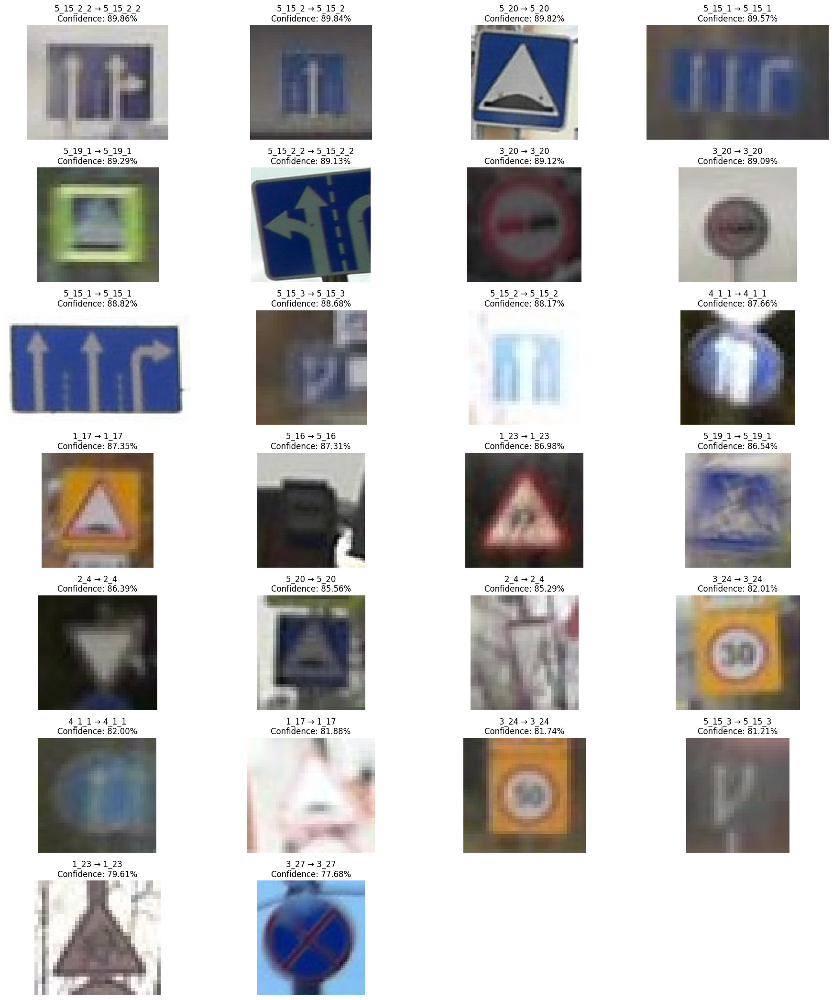

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

plt.figure(figsize=(18, 24))

for i, (_, row) in enumerate(candidates_low.iterrows()):

    img = Image.open(
        os.path.join(
            "/content/prepared_dataset",
            row["class_name"],
            row["filename"]
        )
    )

    plt.subplot(8, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['class_name']} → {row['pred_class']}\n"
        f"Confidence: {row['confidence']:.2%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [2]:
import os
import pandas as pd

DATASET_ROOT = "/content/prepared_dataset"

test_df = pd.read_csv(
    "/content/drive/MyDrive/RTSD_practice/test_metadata.csv"
)

test_df["filepath"] = test_df.apply(
    lambda row: os.path.join(
        DATASET_ROOT,
        row["class_name"],
        row["filename"]
    ),
    axis=1
)

print("Test:", len(test_df))
print(
    "Все файлы существуют:",
    test_df["filepath"].map(os.path.exists).all()
)

Test: 2241
Все файлы существуют: False


In [3]:
import tarfile

ARCHIVE_PATH = (
    "/content/drive/MyDrive/RTSD_practice/"
    "prepared_dataset_15k.tar"
)

with tarfile.open(ARCHIVE_PATH, "r") as tar:
    tar.extractall("/content")

print("Датасет распакован.")

print(
    "Все файлы существуют:",
    test_df["filepath"].map(os.path.exists).all()
)

/tmp/ipykernel_909/216541623.py:9: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall("/content")


Датасет распакован.
Все файлы существуют: True


In [4]:
PREDICTIONS_PATH = (
    "/content/drive/MyDrive/RTSD_practice/"
    "ResNet50_test_predictions.csv"
)

predictions_df = pd.read_csv(PREDICTIONS_PATH)

print("Строк:", len(predictions_df))
print(predictions_df.head())

Строк: 2241
          filename class_name  label  pred_label pred_class  confidence
0  5_19_1_0000.jpg     5_19_1     13          13     5_19_1    0.969745
1  5_19_1_0003.jpg     5_19_1     13          13     5_19_1    0.561454
2  5_19_1_0008.jpg     5_19_1     13          13     5_19_1    0.994679
3  5_19_1_0015.jpg     5_19_1     13          13     5_19_1    0.997976
4  5_19_1_0017.jpg     5_19_1     13          13     5_19_1    0.959107


In [5]:
correct_100 = predictions_df[
    (predictions_df["class_name"] == predictions_df["pred_class"]) &
    (predictions_df["confidence"] >= 0.9999)
].copy()

# По одному кандидату на класс
correct_100 = (
    correct_100
    .groupby("class_name", group_keys=False)
    .head(1)
    .reset_index(drop=True)
)

print(
    correct_100[
        ["filename", "class_name", "pred_class", "confidence"]
    ].to_string(index=False)
)

       filename class_name pred_class  confidence
5_19_1_0029.jpg     5_19_1     5_19_1    0.999977
   2_1_0010.jpg        2_1        2_1    0.999996
  5_16_0018.jpg       5_16       5_16    0.999911
5_15_2_0513.jpg     5_15_2     5_15_2    0.999931
  3_24_0028.jpg       3_24       3_24    0.999990
   2_4_0016.jpg        2_4        2_4    0.999991
  3_27_0011.jpg       3_27       3_27    0.999958
  1_23_0013.jpg       1_23       1_23    0.999967
 4_1_1_0093.jpg      4_1_1      4_1_1    0.999998
  5_20_0096.jpg       5_20       5_20    0.999954
  3_20_0081.jpg       3_20       3_20    0.999960
5_15_3_0173.jpg     5_15_3     5_15_3    0.999939
5_15_1_0064.jpg     5_15_1     5_15_1    0.999989
  1_17_0025.jpg       1_17       1_17    0.999935


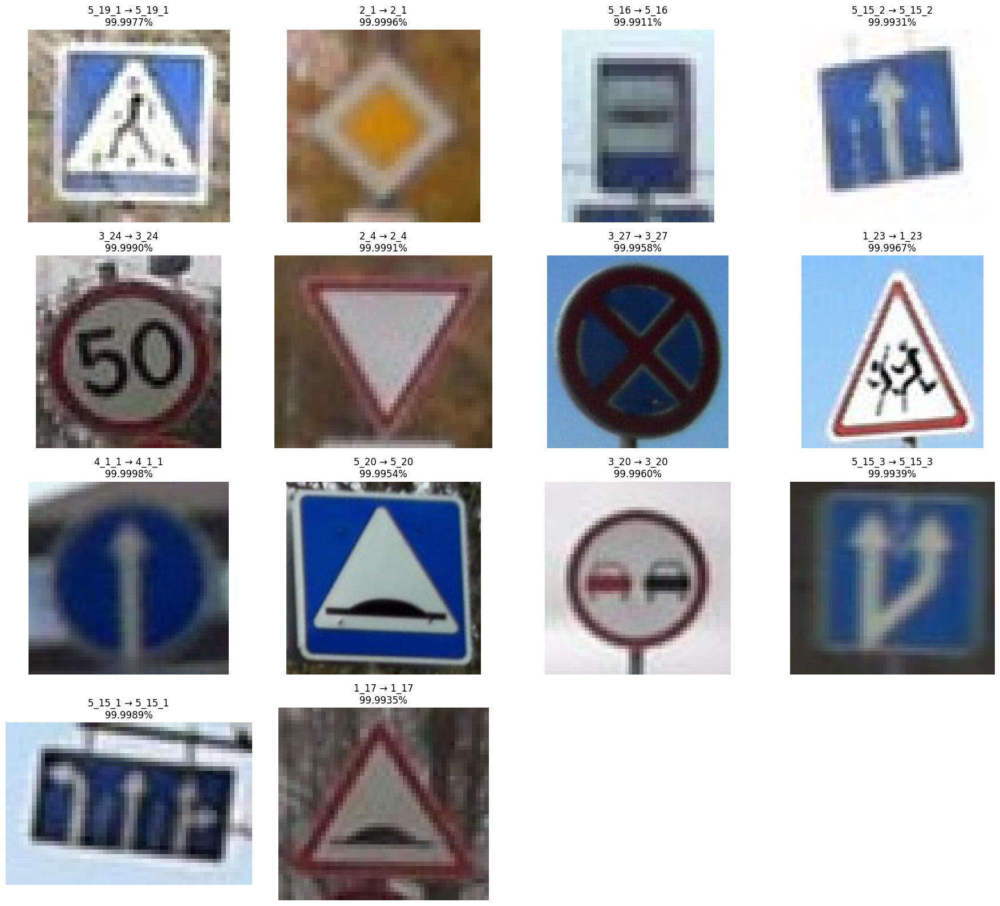

In [6]:
import matplotlib.pyplot as plt
from PIL import Image

candidates = correct_100

plt.figure(figsize=(18, 16))

for i, (_, row) in enumerate(candidates.iterrows()):

    filepath = os.path.join(
        DATASET_ROOT,
        row["class_name"],
        row["filename"]
    )

    img = Image.open(filepath)

    plt.subplot(4, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['class_name']} → {row['pred_class']}\n"
        f"{row['confidence']:.4%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [7]:
# Загружаем сохранённые predictions
PREDICTIONS_PATH = (
    "/content/drive/MyDrive/RTSD_practice/"
    "ResNet50_test_predictions.csv"
)

predictions_df = pd.read_csv(PREDICTIONS_PATH)

# Только правильные предсказания с очень высокой уверенностью
correct_100 = predictions_df[
    (predictions_df["class_name"] == predictions_df["pred_class"]) &
    (predictions_df["confidence"] >= 0.9999)
].copy()

# Перемешиваем, чтобы не смотреть классы в одном и том же порядке
correct_100 = correct_100.sample(
    frac=1,
    random_state=42
).reset_index(drop=True)

print("Всего таких примеров:", len(correct_100))

Всего таких примеров: 673


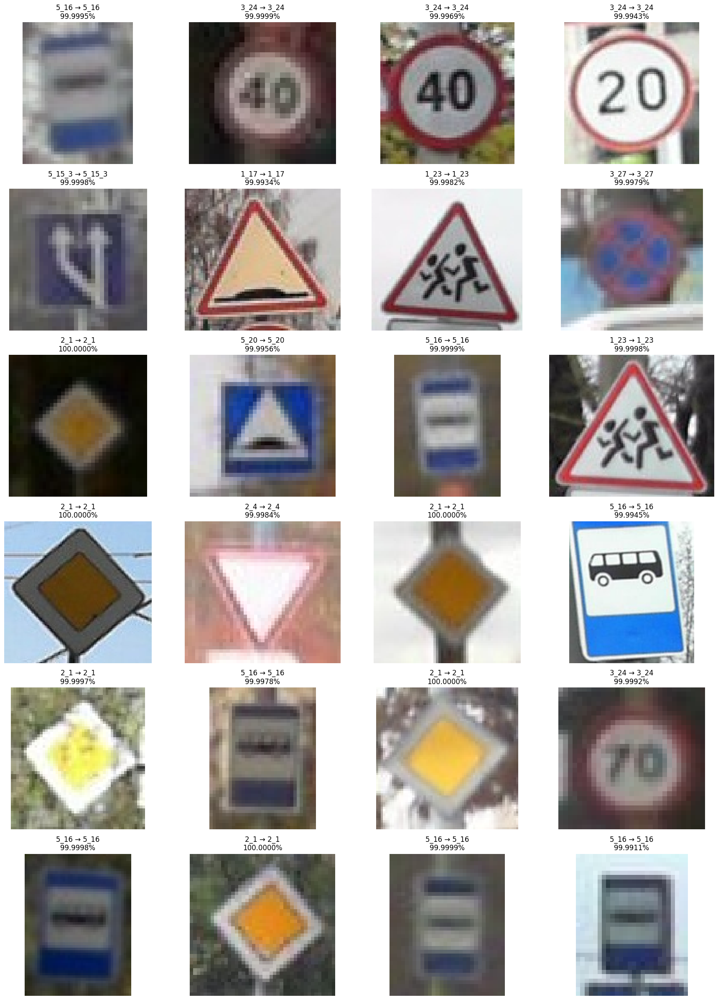

In [8]:
import matplotlib.pyplot as plt
from PIL import Image
import os

candidates = correct_100.head(24)

plt.figure(figsize=(18, 24))

for i, (_, row) in enumerate(candidates.iterrows()):

    filepath = os.path.join(
        "/content/prepared_dataset",
        row["class_name"],
        row["filename"]
    )

    img = Image.open(filepath)

    plt.subplot(6, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['class_name']} → {row['pred_class']}\n"
        f"{row['confidence']:.4%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [9]:
one_100_per_class = (
    correct_100
    .groupby("class_name", group_keys=False)
    .head(1)
)

print(
    one_100_per_class[
        ["filename", "class_name", "confidence"]
    ].to_string(index=False)
)

       filename class_name  confidence
  5_16_0478.jpg       5_16    0.999995
  3_24_0952.jpg       3_24    0.999999
5_15_3_0661.jpg     5_15_3    0.999999
  1_17_0627.jpg       1_17    0.999934
  1_23_0138.jpg       1_23    0.999982
  3_27_0761.jpg       3_27    0.999979
   2_1_0584.jpg        2_1    1.000000
  5_20_0693.jpg       5_20    0.999956
   2_4_0063.jpg        2_4    0.999984
5_19_1_0259.jpg     5_19_1    0.999925
5_15_1_0883.jpg     5_15_1    0.999996
 4_1_1_0386.jpg      4_1_1    0.999920
  3_20_0467.jpg       3_20    0.999967
5_15_2_0632.jpg     5_15_2    0.999984


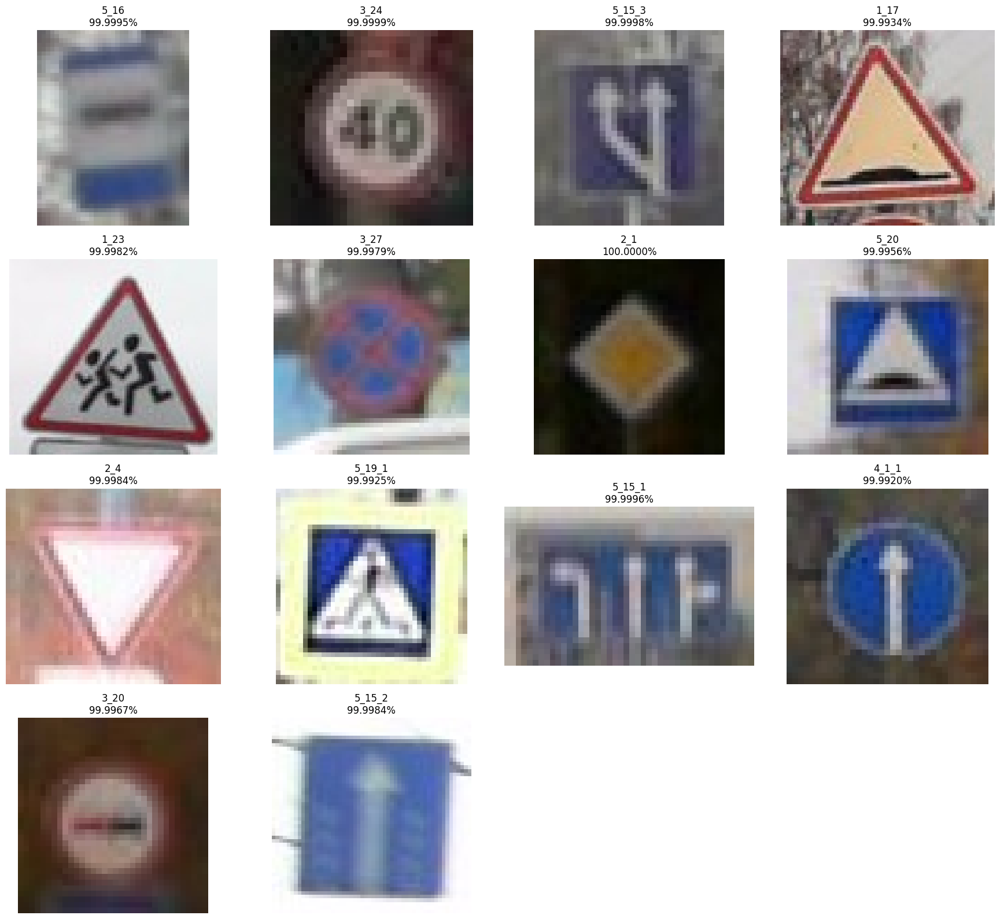

In [10]:
plt.figure(figsize=(18, 16))

for i, (_, row) in enumerate(one_100_per_class.iterrows()):

    filepath = os.path.join(
        "/content/prepared_dataset",
        row["class_name"],
        row["filename"]
    )

    img = Image.open(filepath)

    plt.subplot(4, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['class_name']}\n"
        f"{row['confidence']:.4%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

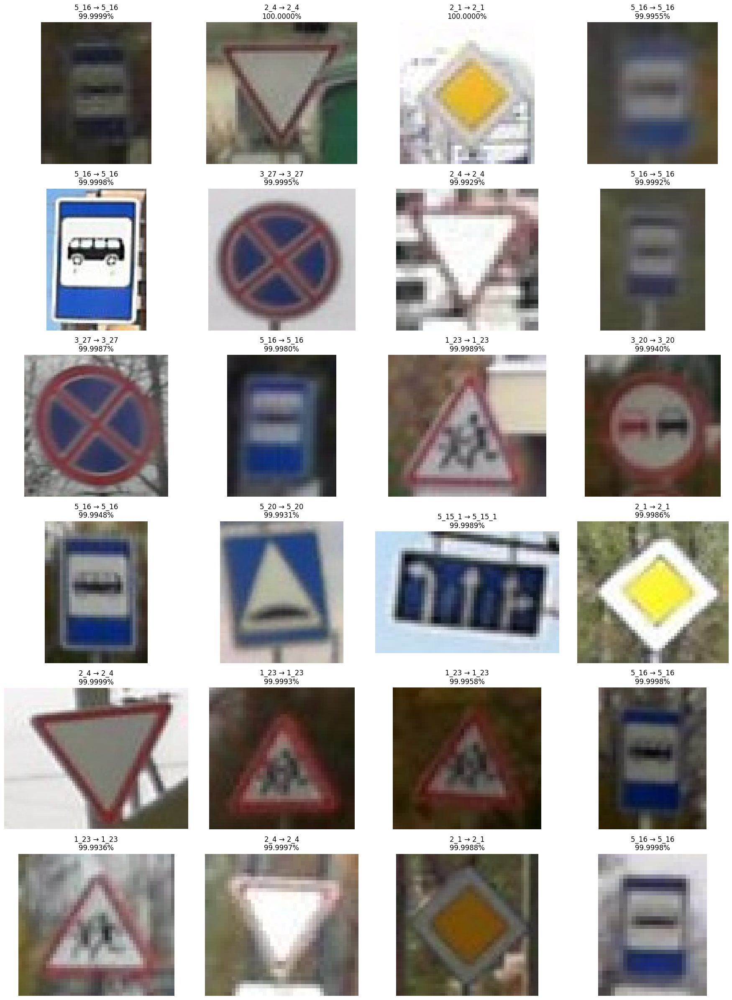

In [32]:
candidates = correct_100.iloc[480:504]

plt.figure(figsize=(18, 24))

for i, (_, row) in enumerate(candidates.iterrows()):

    filepath = os.path.join(
        "/content/prepared_dataset",
        row["class_name"],
        row["filename"]
    )

    img = Image.open(filepath)

    plt.subplot(6, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['class_name']} → {row['pred_class']}\n"
        f"{row['confidence']:.4%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [33]:
import os
import shutil

EXAMPLES_DIR = "/content/drive/MyDrive/RTSD_practice/examples"
CORRECT_DIR = os.path.join(EXAMPLES_DIR, "correct")

os.makedirs(CORRECT_DIR, exist_ok=True)

print("Папка:", CORRECT_DIR)

Папка: /content/drive/MyDrive/RTSD_practice/examples/correct


In [37]:
candidates_123 = predictions_df[
    (predictions_df["class_name"] == "1_23") &
    (predictions_df["pred_class"] == "1_23") &
    (predictions_df["confidence"] >= 0.999)
].copy()

candidates_123 = candidates_123.sort_values(
    "confidence",
    ascending=False
)

print(
    candidates_123[
        ["filename", "class_name", "pred_class", "confidence"]
    ].to_string(index=False)
)

     filename class_name pred_class  confidence
1_23_0820.jpg       1_23       1_23    1.000000
1_23_0154.jpg       1_23       1_23    0.999999
1_23_0250.jpg       1_23       1_23    0.999999
1_23_0109.jpg       1_23       1_23    0.999999
1_23_0562.jpg       1_23       1_23    0.999999
1_23_0915.jpg       1_23       1_23    0.999999
1_23_0638.jpg       1_23       1_23    0.999999
1_23_0300.jpg       1_23       1_23    0.999999
1_23_0542.jpg       1_23       1_23    0.999999
1_23_0923.jpg       1_23       1_23    0.999998
1_23_0261.jpg       1_23       1_23    0.999997
1_23_0034.jpg       1_23       1_23    0.999997
1_23_0114.jpg       1_23       1_23    0.999996
1_23_0786.jpg       1_23       1_23    0.999996
1_23_0675.jpg       1_23       1_23    0.999996
1_23_0223.jpg       1_23       1_23    0.999996
1_23_0259.jpg       1_23       1_23    0.999996
1_23_0208.jpg       1_23       1_23    0.999996
1_23_0524.jpg       1_23       1_23    0.999996
1_23_0502.jpg       1_23       1_23    0

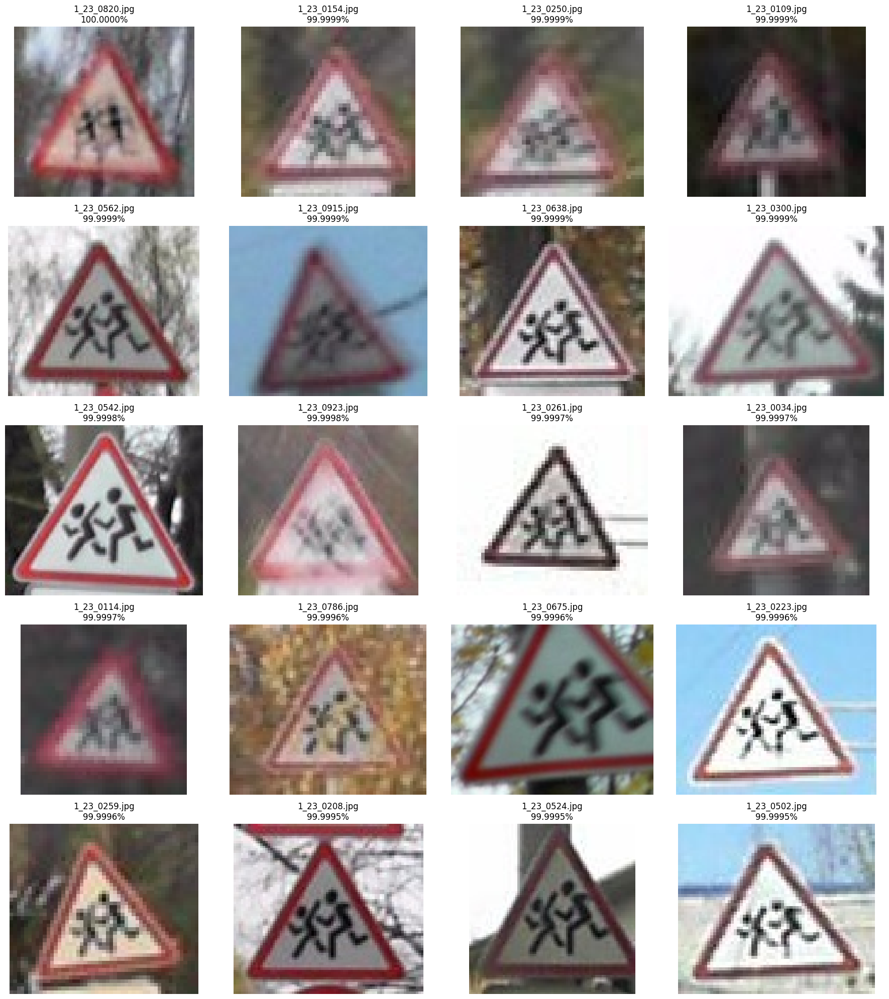

In [38]:
from PIL import Image
import matplotlib.pyplot as plt
import os

candidates = candidates_123.head(20)

plt.figure(figsize=(18, 20))

for i, (_, row) in enumerate(candidates.iterrows()):

    filepath = os.path.join(
        "/content/prepared_dataset",
        "1_23",
        row["filename"]
    )

    img = Image.open(filepath)

    plt.subplot(5, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['filename']}\n"
        f"{row['confidence']:.4%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

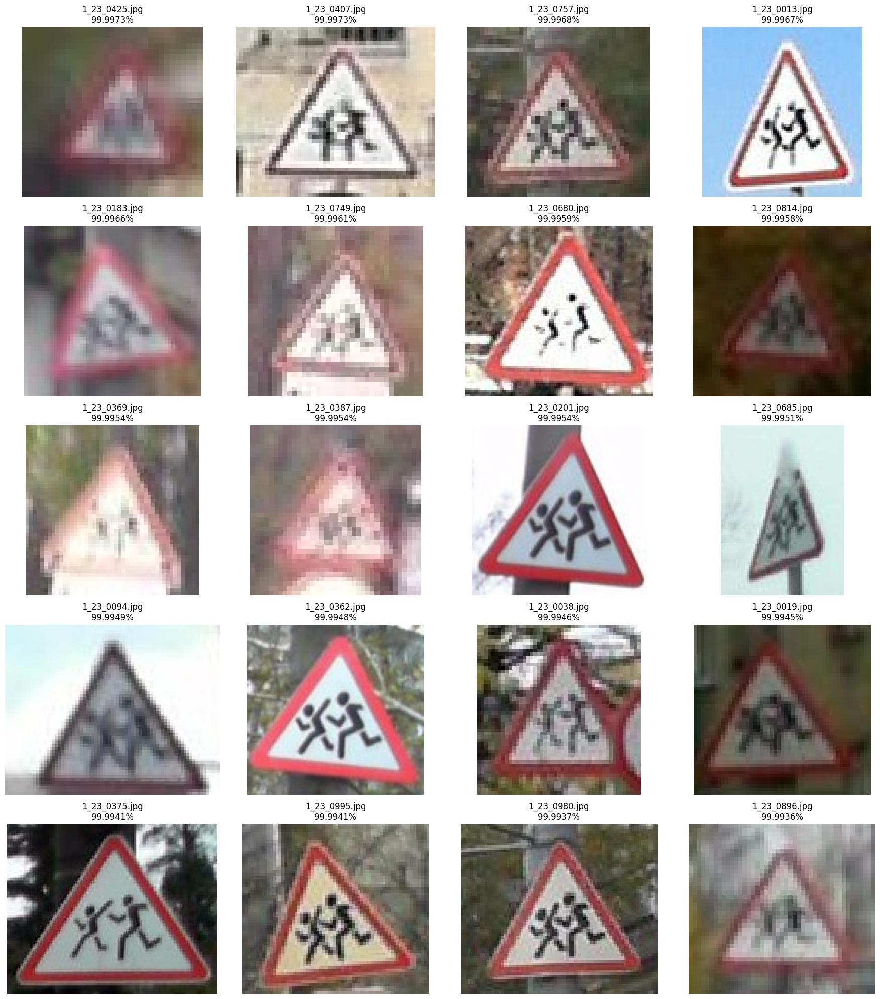

In [40]:
candidates = candidates_123.iloc[40:60]

plt.figure(figsize=(18, 20))

for i, (_, row) in enumerate(candidates.iterrows()):

    filepath = os.path.join(
        "/content/prepared_dataset",
        "1_23",
        row["filename"]
    )

    img = Image.open(filepath)

    plt.subplot(5, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['filename']}\n"
        f"{row['confidence']:.4%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [45]:
import os
import shutil

EXAMPLES_DIR = "/content/drive/MyDrive/RTSD_practice/examples"
CORRECT_DIR = os.path.join(EXAMPLES_DIR, "correct")

os.makedirs(CORRECT_DIR, exist_ok=True)

source_path = "/content/prepared_dataset/2_1/2_1_0277.jpg"

output_path = os.path.join(
    CORRECT_DIR,
    "correct_2_2_1.jpg"
)

shutil.copy2(source_path, output_path)

print("Сохранено:")
print(output_path)

Сохранено:
/content/drive/MyDrive/RTSD_practice/examples/correct/correct_2_2_1.jpg


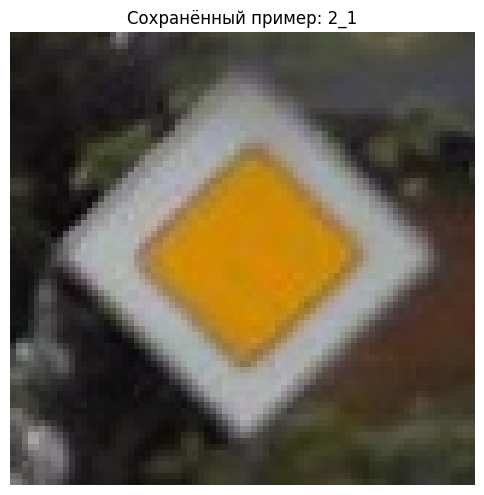

In [46]:
from PIL import Image
import matplotlib.pyplot as plt

saved_path = (
    "/content/drive/MyDrive/RTSD_practice/"
    "examples/correct/correct_2_2_1.jpg"
)

img = Image.open(saved_path)

plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.title("Сохранённый пример: 2_1")
plt.axis("off")
plt.show()

In [43]:
candidates_21 = predictions_df[
    (predictions_df["class_name"] == "2_1") &
    (predictions_df["pred_class"] == "2_1") &
    (predictions_df["confidence"] > 0.90)
].copy()

candidates_21 = candidates_21.sort_values(
    "confidence",
    ascending=False
)

print(
    "Количество:",
    len(candidates_21)
)

print(
    candidates_21[
        ["filename", "class_name", "pred_class", "confidence"]
    ].to_string(index=False)
)

Количество: 148
    filename class_name pred_class  confidence
2_1_0011.jpg        2_1        2_1    1.000000
2_1_0071.jpg        2_1        2_1    1.000000
2_1_0047.jpg        2_1        2_1    1.000000
2_1_0053.jpg        2_1        2_1    1.000000
2_1_0083.jpg        2_1        2_1    1.000000
2_1_0114.jpg        2_1        2_1    1.000000
2_1_0107.jpg        2_1        2_1    1.000000
2_1_0056.jpg        2_1        2_1    1.000000
2_1_0401.jpg        2_1        2_1    1.000000
2_1_0348.jpg        2_1        2_1    1.000000
2_1_0346.jpg        2_1        2_1    1.000000
2_1_0322.jpg        2_1        2_1    1.000000
2_1_0277.jpg        2_1        2_1    1.000000
2_1_0279.jpg        2_1        2_1    1.000000
2_1_0299.jpg        2_1        2_1    1.000000
2_1_0238.jpg        2_1        2_1    1.000000
2_1_0207.jpg        2_1        2_1    1.000000
2_1_0246.jpg        2_1        2_1    1.000000
2_1_0189.jpg        2_1        2_1    1.000000
2_1_0158.jpg        2_1        2_1    1.0000

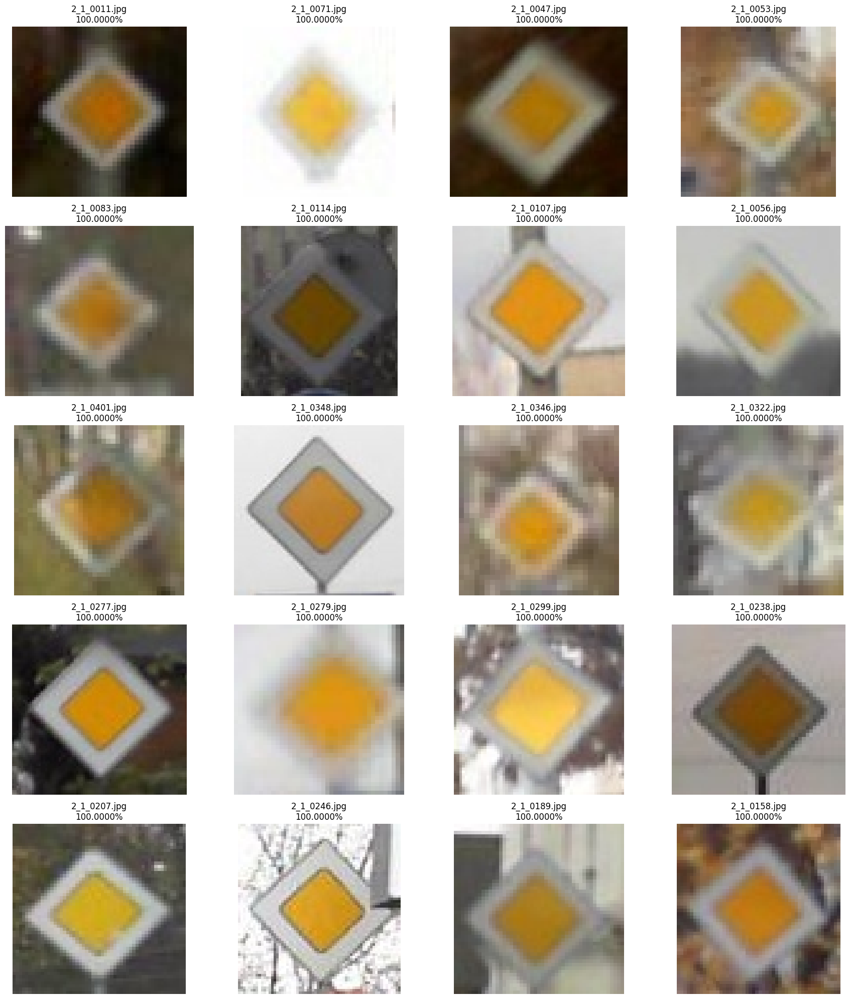

In [44]:
from PIL import Image
import matplotlib.pyplot as plt
import os

candidates = candidates_21.iloc[:20]

plt.figure(figsize=(18, 20))

for i, (_, row) in enumerate(candidates.iterrows()):

    filepath = os.path.join(
        "/content/prepared_dataset",
        "2_1",
        row["filename"]
    )

    img = Image.open(filepath)

    plt.subplot(5, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['filename']}\n"
        f"{row['confidence']:.4%}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [47]:
candidates_516 = predictions_df[
    (predictions_df["class_name"] == "5_16") &
    (predictions_df["pred_class"] == "5_16") &
    (predictions_df["confidence"] >= 0.9999)
].copy()

candidates_516 = candidates_516.sort_values(
    "confidence",
    ascending=False
).reset_index(drop=True)

print("Количество:", len(candidates_516))

print(
    candidates_516[
        ["filename", "class_name", "pred_class", "confidence"]
    ].to_string(index=False)
)

Количество: 100
     filename class_name pred_class  confidence
5_16_0913.jpg       5_16       5_16    1.000000
5_16_0607.jpg       5_16       5_16    1.000000
5_16_0256.jpg       5_16       5_16    1.000000
5_16_0336.jpg       5_16       5_16    1.000000
5_16_0960.jpg       5_16       5_16    1.000000
5_16_0930.jpg       5_16       5_16    1.000000
5_16_0166.jpg       5_16       5_16    1.000000
5_16_0201.jpg       5_16       5_16    1.000000
5_16_0305.jpg       5_16       5_16    1.000000
5_16_0335.jpg       5_16       5_16    0.999999
5_16_0499.jpg       5_16       5_16    0.999999
5_16_0916.jpg       5_16       5_16    0.999999
5_16_0472.jpg       5_16       5_16    0.999999
5_16_0446.jpg       5_16       5_16    0.999999
5_16_0064.jpg       5_16       5_16    0.999999
5_16_0459.jpg       5_16       5_16    0.999999
5_16_0365.jpg       5_16       5_16    0.999999
5_16_0354.jpg       5_16       5_16    0.999999
5_16_0729.jpg       5_16       5_16    0.999999
5_16_0225.jpg       5_16

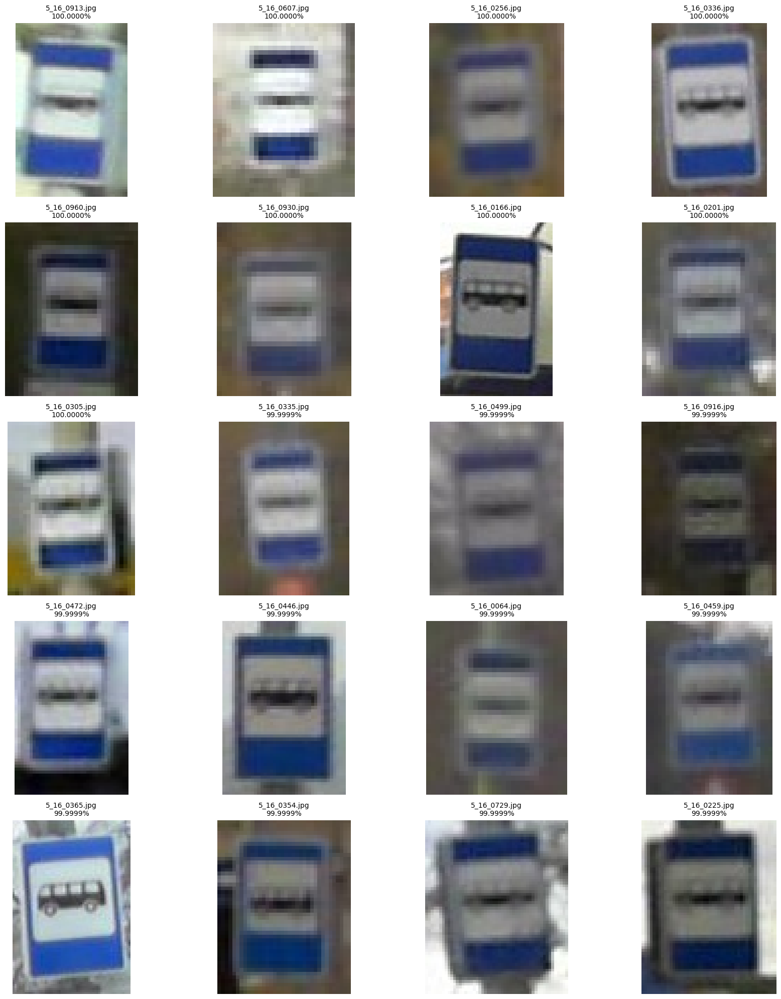

In [48]:
import matplotlib.pyplot as plt
from PIL import Image
import os

candidates = candidates_516.iloc[:20]

plt.figure(figsize=(18, 20))

for i, (_, row) in enumerate(candidates.iterrows()):

    filepath = os.path.join(
        "/content/prepared_dataset",
        "5_16",
        row["filename"]
    )

    img = Image.open(filepath)

    plt.subplot(5, 4, i + 1)
    plt.imshow(img)
    plt.title(
        f"{row['filename']}\n"
        f"{row['confidence']:.4%}",
        fontsize=10
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [49]:
import os
import shutil

EXAMPLES_DIR = "/content/drive/MyDrive/RTSD_practice/examples"
CORRECT_DIR = os.path.join(EXAMPLES_DIR, "correct")

os.makedirs(CORRECT_DIR, exist_ok=True)

source_path = "/content/prepared_dataset/5_16/5_16_0913.jpg"

output_path = os.path.join(
    CORRECT_DIR,
    "correct_3_5_16.jpg"
)

shutil.copy2(source_path, output_path)

print("Сохранено:")
print(output_path)

Сохранено:
/content/drive/MyDrive/RTSD_practice/examples/correct/correct_3_5_16.jpg


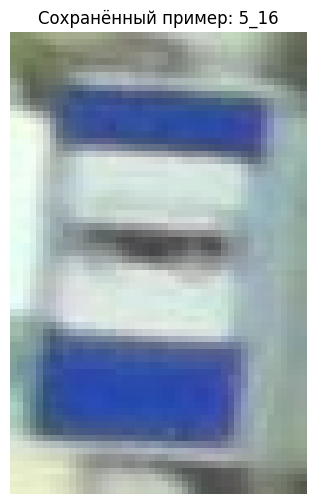

Файл существует: True


In [50]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open(output_path)

plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.title("Сохранённый пример: 5_16")
plt.axis("off")
plt.show()

print("Файл существует:", os.path.exists(output_path))

In [51]:
!pip install -q gradio

In [57]:
import os
from tensorflow.keras.models import load_model

MODEL_DIR = "/content/drive/MyDrive/RTSD_practice/models"

resnet_model = load_model(
    os.path.join(MODEL_DIR, "ResNet50.keras")
)

print("ResNet50 загружена.")
print("Параметров:", resnet_model.count_params())

ResNet50 загружена.
Параметров: 23618447


In [59]:
import pandas as pd

train_df = pd.read_csv(
    "/content/drive/MyDrive/RTSD_practice/train_metadata.csv"
)

class_names = sorted(
    train_df["class_name"].unique()
)

print("Классы:", class_names)
print("Количество классов:", len(class_names))

Классы: ['1_17', '1_23', '2_1', '2_4', '3_20', '3_24', '3_27', '4_1_1', '5_15_1', '5_15_2', '5_15_2_2', '5_15_3', '5_16', '5_19_1', '5_20']
Количество классов: 15


In [62]:
import numpy as np
import time


def predict_sign(image):
    if image is None:
        return "Изображение не загружено", 0.0, 0.0

    image = image.convert("RGB")
    image = image.resize((224, 224))

    img_array = np.array(
        image,
        dtype=np.float32
    )

    img_array = np.expand_dims(
        img_array,
        axis=0
    )

    start_time = time.perf_counter()

    probabilities = resnet_model.predict(
        img_array,
        verbose=0
    )

    inference_time = (
        time.perf_counter() - start_time
    ) * 1000

    pred_label = np.argmax(
        probabilities[0]
    )

    pred_class = class_names[pred_label]

    confidence = float(
        probabilities[0][pred_label]
    )

    return (
        pred_class,
        confidence,
        inference_time
    )

In [64]:
# Проверяем функцию напрямую, без Gradio

result = predict_sign(
    Image.open(
        "/content/drive/MyDrive/RTSD_practice/examples/correct/correct_1_1_23.jpg"
    )
)

print(result)

('1_23', 0.9999436140060425, 360.06549099874974)


In [63]:
demo = gr.Interface(
    fn=predict_sign,

    inputs=gr.Image(
        type="pil",
        label="Изображение дорожного знака"
    ),

    outputs=[
        gr.Textbox(
            label="Предсказанный класс"
        ),
        gr.Number(
            label="Уверенность",
            precision=4
        ),
        gr.Number(
            label="Время инференса (мс)",
            precision=2
        )
    ],

    title="Распознавание дорожных знаков",

    description=(
        "ResNet50, обученная на 15 классах RTSD"
    )
)

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://9a88e5f7a33ff72c6c.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [66]:
import pandas as pd

predictions_df = pd.read_csv(
    "/content/drive/MyDrive/RTSD_practice/ResNet50_test_predictions.csv"
)

row = predictions_df[
    predictions_df["filename"] == "1_23_0362.jpg"
]

print(row.to_string(index=False))

     filename class_name  label  pred_label pred_class  confidence
1_23_0362.jpg       1_23      1           1       1_23    0.999948


In [67]:
print(
    f"Confidence: {row['confidence'].iloc[0] * 100:.6f}%"
)

Confidence: 99.994830%


In [69]:
filename = "1_23_0362.jpg"

meta = test_df[test_df["filename"] == filename]

pred = predictions_df[predictions_df["filename"] == filename]

print("METADATA:")
print(meta.to_string(index=False))

print("\nPREDICTION:")
print(pred.to_string(index=False))

path = f"/content/prepared_dataset/1_23/{filename}"
print("\nIMAGE PATH:")
print(path)
print("Exists:", os.path.exists(path))

METADATA:
     filename class_name  image_id split                                     filepath
1_23_0362.jpg       1_23      9260  test /content/prepared_dataset/1_23/1_23_0362.jpg

PREDICTION:
     filename class_name  label  pred_label pred_class  confidence
1_23_0362.jpg       1_23      1           1       1_23    0.999948

IMAGE PATH:
/content/prepared_dataset/1_23/1_23_0362.jpg
Exists: True


In [71]:
import os

RESULTS_DIR = "/content/drive/MyDrive/RTSD_practice/results"

print(os.listdir(RESULTS_DIR))

['MobileNetV2_metrics.csv', 'MobileNetV2_history.json', 'MobileNetV2_confusion_matrix.png', 'ResNet50_history.json', 'ResNet50_confusion_matrix.png', 'ResNet50_metrics.csv', 'EfficientNetB0_confusion_matrix.png', 'EfficientNetB0_history.json', 'EfficientNetB0_metrics.csv', 'VGG16_history.json', 'VGG16_confusion_matrix.png', 'VGG16_metrics.csv', 'DenseNet121_metrics.csv', 'DenseNet121_confusion_matrix.png', 'DenseNet121_history.json', 'models_comparison_final.csv']


In [87]:
import os
import json
import cv2
import numpy as np
import pandas as pd
from PIL import Image

# =========================================================
# НАСТРОЙКИ
# =========================================================

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
RANDOM_STATE = 42

RESULTS_DIR = (
    "/content/drive/MyDrive/RTSD_practice/results"
)

os.makedirs(RESULTS_DIR, exist_ok=True)

# =========================================================
# 1. Фиксированная сбалансированная выборка
#    20 изображений × 15 классов = 300
# =========================================================

stress_df = (
    test_df
    .groupby("class_name", group_keys=False)
    .sample(
        n=20,
        random_state=RANDOM_STATE
    )
    .reset_index(drop=True)
)

# Числовые метки
class_to_label = {
    class_name: i
    for i, class_name in enumerate(class_names)
}

stress_df["label"] = stress_df["class_name"].map(
    class_to_label
)

print("=" * 60)
print("STRESS-TEST")
print("=" * 60)

print("\nРазмер выборки:", len(stress_df))

print("\nИзображений на каждый класс:")
print(
    stress_df["class_name"]
    .value_counts()
    .sort_index()
)

print(
    "\nВсе файлы существуют:",
    stress_df["filepath"].map(os.path.exists).all()
)

# =========================================================
# 2. Функции обработки
# =========================================================

def load_raw_image(filepath):
    img = Image.open(filepath).convert("RGB")
    return np.array(img)


def make_condition_image(img, condition):

    if condition == "original":

        result = cv2.resize(
            img,
            IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    elif condition == "small":

        result = cv2.resize(
            img,
            (64, 64),
            interpolation=cv2.INTER_AREA
        )

        result = cv2.resize(
            result,
            IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    elif condition == "blur":

        result = cv2.GaussianBlur(
            img,
            (9, 9),
            0
        )

        result = cv2.resize(
            result,
            IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    elif condition == "dark":

        result = (
            img.astype(np.float32) * 0.40
        )

        result = np.clip(
            result,
            0,
            255
        ).astype(np.uint8)

        result = cv2.resize(
            result,
            IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    else:
        raise ValueError(
            f"Unknown condition: {condition}"
        )

    return result.astype(np.float32)


# =========================================================
# 3. Оценка одной модификации
# =========================================================

def evaluate_stress_condition(df, condition):

    images = []
    labels = []

    for _, row in df.iterrows():

        img = load_raw_image(
            row["filepath"]
        )

        img = make_condition_image(
            img,
            condition
        )

        images.append(img)
        labels.append(
            int(row["label"])
        )

    images = np.array(
        images,
        dtype=np.float32
    )

    labels = np.array(
        labels,
        dtype=np.int64
    )

    # ВАЖНО:
    # preprocess_input здесь НЕ вызываем,
    # потому что он уже встроен в resnet_model.
    probabilities = resnet_model.predict(
        images,
        batch_size=BATCH_SIZE,
        verbose=1
    )

    predictions = np.argmax(
        probabilities,
        axis=1
    )

    accuracy = np.mean(
        predictions == labels
    )

    return float(accuracy)


# =========================================================
# 4. Запуск stress-test
# =========================================================

stress_results = {}

for condition in [
    "original",
    "small",
    "blur",
    "dark"
]:

    print("\n" + "=" * 60)
    print("Условие:", condition)
    print("=" * 60)

    accuracy = evaluate_stress_condition(
        stress_df,
        condition
    )

    stress_results[condition] = accuracy

    print(
        f"Accuracy: {accuracy:.4f}"
        f" ({accuracy:.2%})"
    )


# =========================================================
# 5. Итоговая таблица
# =========================================================

stress_table = pd.DataFrame({
    "Condition": list(
        stress_results.keys()
    ),
    "Accuracy": list(
        stress_results.values()
    )
})

print("\n" + "=" * 60)
print("ИТОГИ")
print("=" * 60)

print(
    stress_table.to_string(index=False)
)


# =========================================================
# 6. Сохранение CSV
# =========================================================

csv_path = os.path.join(
    RESULTS_DIR,
    "stress_test_resnet50.csv"
)

stress_table.to_csv(
    csv_path,
    index=False,
    encoding="utf-8"
)


# =========================================================
# 7. Сохранение JSON
# =========================================================

json_path = os.path.join(
    RESULTS_DIR,
    "stress_test_resnet50.json"
)

stress_report = {
    "model": "ResNet50",
    "sample_size": 300,
    "number_of_classes": 15,
    "samples_per_class": 20,
    "random_state": RANDOM_STATE,
    "conditions": stress_results
}

with open(
    json_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        stress_report,
        f,
        ensure_ascii=False,
        indent=2
    )

print("\nСохранено:")
print(csv_path)
print(json_path)

STRESS-TEST

Размер выборки: 300

Изображений на каждый класс:
class_name
1_17        20
1_23        20
2_1         20
2_4         20
3_20        20
3_24        20
3_27        20
4_1_1       20
5_15_1      20
5_15_2      20
5_15_2_2    20
5_15_3      20
5_16        20
5_19_1      20
5_20        20
Name: count, dtype: int64

Все файлы существуют: True

Условие: original
10/10 ━━━━━━━━━━━━━━━━━━━━ 37s 4s/step
Accuracy: 0.9633 (96.33%)

Условие: small
10/10 ━━━━━━━━━━━━━━━━━━━━ 39s 4s/step
Accuracy: 0.9700 (97.00%)

Условие: blur
10/10 ━━━━━━━━━━━━━━━━━━━━ 36s 4s/step
Accuracy: 0.8633 (86.33%)

Условие: dark
10/10 ━━━━━━━━━━━━━━━━━━━━ 35s 4s/step
Accuracy: 0.9367 (93.67%)

ИТОГИ
Condition  Accuracy
 original  0.963333
    small  0.970000
     blur  0.863333
     dark  0.936667

Сохранено:
/content/drive/MyDrive/RTSD_practice/results/stress_test_resnet50.csv
/content/drive/MyDrive/RTSD_practice/results/stress_test_resnet50.json


In [88]:
import os
import json
import time
import numpy as np
import pandas as pd
import cv2

from PIL import Image
from tensorflow import keras
from google.colab import drive


# ============================================================
# 1. Пути и настройки
# ============================================================

drive.mount("/content/drive")

DRIVE_ROOT = "/content/drive/MyDrive/RTSD_practice"
DATASET_ROOT = "/content/prepared_dataset"
RESULTS_DIR = os.path.join(DRIVE_ROOT, "results")

os.makedirs(RESULTS_DIR, exist_ok=True)

TEST_METADATA = os.path.join(
    DRIVE_ROOT, "test_metadata.csv"
)

MODEL_PATH = os.path.join(
    DRIVE_ROOT, "models", "ResNet50.keras"
)

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

class_names = [
    "1_17",
    "1_23",
    "2_1",
    "2_4",
    "3_20",
    "3_24",
    "3_27",
    "4_1_1",
    "5_15_1",
    "5_15_2",
    "5_15_2_2",
    "5_15_3",
    "5_16",
    "5_19_1",
    "5_20"
]

class_to_label = {
    name: i
    for i, name in enumerate(class_names)
}


# ============================================================
# 2. Загрузка модели и тестовой выборки
# ============================================================

resnet_model = keras.models.load_model(
    MODEL_PATH,
    compile=False
)

test_df = pd.read_csv(TEST_METADATA)

assert set(test_df["class_name"]) == set(class_names)

test_df["filepath"] = test_df.apply(
    lambda row: os.path.join(
        DATASET_ROOT,
        row["class_name"],
        row["filename"]
    ),
    axis=1
)

assert test_df["filepath"].map(os.path.exists).all()

print("Test-изображений:", len(test_df))


# ============================================================
# 3. Преобразования
# ============================================================

def load_raw_image(filepath):
    img = Image.open(filepath).convert("RGB")
    return np.array(img)


def make_condition_image(img, condition):

    if condition == "small":
        img = cv2.resize(
            img,
            (64, 64),
            interpolation=cv2.INTER_AREA
        )
        img = cv2.resize(
            img,
            IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    elif condition == "blur":
        img = cv2.GaussianBlur(
            img,
            (9, 9),
            0
        )
        img = cv2.resize(
            img,
            IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    elif condition == "dark":
        img = img.astype(np.float32) * 0.40
        img = np.clip(
            img,
            0,
            255
        ).astype(np.uint8)
        img = cv2.resize(
            img,
            IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    else:
        img = cv2.resize(
            img,
            IMG_SIZE,
            interpolation=cv2.INTER_LINEAR
        )

    return img.astype(np.float32)


# ============================================================
# 4. Оценка одного условия
# ============================================================

def evaluate_condition(condition):

    results = []
    start_time = time.perf_counter()

    for start in range(0, len(test_df), BATCH_SIZE):

        batch = test_df.iloc[
            start:start + BATCH_SIZE
        ]

        images = []

        for filepath in batch["filepath"]:
            img = load_raw_image(filepath)
            img = make_condition_image(
                img,
                condition
            )
            images.append(img)

        images = np.array(
            images,
            dtype=np.float32
        )

        probabilities = resnet_model.predict(
            images,
            verbose=0
        )

        predictions = np.argmax(
            probabilities,
            axis=1
        )

        confidences = np.max(
            probabilities,
            axis=1
        )

        for i in range(len(batch)):

            true_label = class_to_label[
                batch.iloc[i]["class_name"]
            ]

            pred_label = int(
                predictions[i]
            )

            results.append({
                "condition": condition,
                "filename": batch.iloc[i]["filename"],
                "class_name": batch.iloc[i]["class_name"],
                "true_label": int(true_label),
                "pred_label": pred_label,
                "pred_class": class_names[pred_label],
                "confidence": float(confidences[i]),
                "correct": bool(
                    pred_label == true_label
                )
            })

    elapsed = time.perf_counter() - start_time

    result_df = pd.DataFrame(results)

    accuracy = result_df["correct"].mean()
    errors = int(
        (~result_df["correct"]).sum()
    )

    return result_df, {
        "condition": condition,
        "accuracy": float(accuracy),
        "errors": errors,
        "total_images": len(result_df),
        "mean_confidence": float(
            result_df["confidence"].mean()
        ),
        "time_seconds": float(elapsed)
    }


# ============================================================
# 5. Стресс-тест
# ============================================================

conditions = [
    "original",
    "small",
    "blur",
    "dark"
]

all_predictions = []
summary = []

for condition in conditions:

    print(f"\nПроверка: {condition}")

    result_df, result = evaluate_condition(
        condition
    )

    all_predictions.append(result_df)
    summary.append(result)

    print(
        f"Accuracy: {result['accuracy']:.2%} | "
        f"Ошибок: {result['errors']}"
    )


# ============================================================
# 6. Итоговая таблица
# ============================================================

predictions_df = pd.concat(
    all_predictions,
    ignore_index=True
)

summary_df = pd.DataFrame(summary)

original_accuracy = summary_df.loc[
    summary_df["condition"] == "original",
    "accuracy"
].iloc[0]

summary_df["delta_vs_original_pp"] = (
    summary_df["accuracy"] -
    original_accuracy
) * 100


# ============================================================
# 7. Сохранение результатов
# ============================================================

predictions_df.to_csv(
    os.path.join(
        RESULTS_DIR,
        "stress_test_resnet50_predictions.csv"
    ),
    index=False,
    encoding="utf-8-sig"
)

summary_df.to_csv(
    os.path.join(
        RESULTS_DIR,
        "stress_test_resnet50_summary.csv"
    ),
    index=False,
    encoding="utf-8-sig"
)

with open(
    os.path.join(
        RESULTS_DIR,
        "stress_test_resnet50.json"
    ),
    "w",
    encoding="utf-8"
) as f:
    json.dump(
        {
            "model": "ResNet50",
            "test_images": len(test_df),
            "conditions": conditions,
            "input_size": "224x224",
            "batch_size": BATCH_SIZE,
            "results": summary
        },
        f,
        ensure_ascii=False,
        indent=2
    )


# ============================================================
# 8. Результат
# ============================================================

print("\nИТОГОВЫЕ РЕЗУЛЬТАТЫ:")

display(
    summary_df[
        [
            "condition",
            "accuracy",
            "errors",
            "mean_confidence",
            "delta_vs_original_pp",
            "time_seconds"
        ]
    ]
)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Test-изображений: 2241

Проверка: original
Accuracy: 96.61% | Ошибок: 76

Проверка: small
Accuracy: 95.81% | Ошибок: 94

Проверка: blur
Accuracy: 85.94% | Ошибок: 315

Проверка: dark
Accuracy: 92.95% | Ошибок: 158

ИТОГОВЫЕ РЕЗУЛЬТАТЫ:


,condition,accuracy,errors,mean_confidence,delta_vs_original_pp,time_seconds
0,original,0.966087,76,0.957793,0.000000,358.872935
1,small,0.958054,94,0.953344,-0.803213,374.992162
2,blur,0.859438,315,0.851542,-10.664882,397.416240
3,dark,0.929496,158,0.903962,-3.659081,413.174123


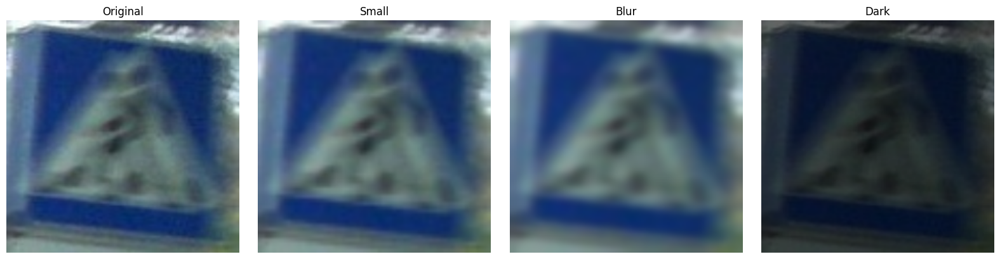

Файл: 5_19_1_0000.jpg
Класс: 5_19_1


In [89]:
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import numpy as np

# Берём одно изображение из test
row = test_df.iloc[0]

# Загружаем оригинал
img = Image.open(row["filepath"]).convert("RGB")
img = np.array(img)

# Original
original_img = cv2.resize(
    img,
    IMG_SIZE,
    interpolation=cv2.INTER_LINEAR
)

# Small
small_img = cv2.resize(
    img,
    (64, 64),
    interpolation=cv2.INTER_AREA
)
small_img = cv2.resize(
    small_img,
    IMG_SIZE,
    interpolation=cv2.INTER_LINEAR
)

# Blur
blur_img = cv2.GaussianBlur(
    img,
    (9, 9),
    0
)
blur_img = cv2.resize(
    blur_img,
    IMG_SIZE,
    interpolation=cv2.INTER_LINEAR
)

# Dark
dark_img = img.astype(np.float32) * 0.40
dark_img = np.clip(
    dark_img,
    0,
    255
).astype(np.uint8)

dark_img = cv2.resize(
    dark_img,
    IMG_SIZE,
    interpolation=cv2.INTER_LINEAR
)

# Показываем
plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
plt.imshow(original_img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(small_img)
plt.title("Small")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(blur_img)
plt.title("Blur")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(dark_img)
plt.title("Dark")
plt.axis("off")

plt.tight_layout()
plt.show()

print("Файл:", row["filename"])
print("Класс:", row["class_name"])

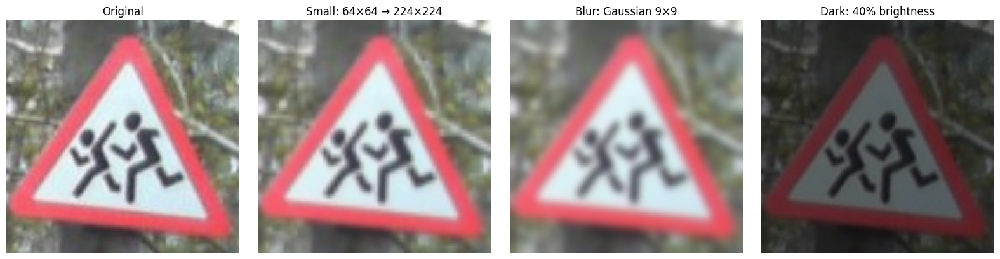

In [90]:
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import numpy as np

filepath = "/content/prepared_dataset/1_23/1_23_0362.jpg"

img = np.array(
    Image.open(filepath).convert("RGB")
)

# Original
original_img = cv2.resize(
    img,
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

# Small
small_img = cv2.resize(
    img,
    (64, 64),
    interpolation=cv2.INTER_AREA
)
small_img = cv2.resize(
    small_img,
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

# Blur
blur_img = cv2.GaussianBlur(
    img,
    (9, 9),
    0
)
blur_img = cv2.resize(
    blur_img,
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

# Dark
dark_img = img.astype(np.float32) * 0.40
dark_img = np.clip(
    dark_img,
    0,
    255
).astype(np.uint8)

dark_img = cv2.resize(
    dark_img,
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

plt.figure(figsize=(16, 4))

for i, (image, title) in enumerate([
    (original_img, "Original"),
    (small_img, "Small: 64×64 → 224×224"),
    (blur_img, "Blur: Gaussian 9×9"),
    (dark_img, "Dark: 40% brightness")
], 1):

    plt.subplot(1, 4, i)
    plt.imshow(image)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [92]:
plt.tight_layout()

save_path = "/content/drive/MyDrive/RTSD_practice/results/stress_test_visual_example.png"

plt.savefig(
    save_path,
    dpi=200,
    bbox_inches="tight"
)

plt.show()

print("Сохранено:", save_path)

<Figure size 640x480 with 0 Axes>

Сохранено: /content/drive/MyDrive/RTSD_practice/results/stress_test_visual_example.png


In [93]:
import os

results_dir = "/content/drive/MyDrive/RTSD_practice/results"

files_to_check = [
    "stress_test_resnet50_predictions.csv",
    "stress_test_resnet50_summary.csv",
    "stress_test_resnet50.json",
    "stress_test_visual_example.png"
]

print("Проверка файлов:\n")

for filename in files_to_check:
    path = os.path.join(results_dir, filename)

    if os.path.exists(path):
        size_kb = os.path.getsize(path) / 1024
        print(f"✅ {filename} — {size_kb:.1f} KB")
    else:
        print(f"❌ {filename} — НЕ НАЙДЕН")

Проверка файлов:

✅ stress_test_resnet50_predictions.csv — 534.5 KB
✅ stress_test_resnet50_summary.csv — 0.4 KB
✅ stress_test_resnet50.json — 1.0 KB
✅ stress_test_visual_example.png — 7.4 KB


In [94]:
import pandas as pd

pred_path = "/content/drive/MyDrive/RTSD_practice/results/stress_test_resnet50_predictions.csv"

df = pd.read_csv(pred_path)

print("Всего строк:", len(df))
print("\nКоличество по условиям:")
print(df["condition"].value_counts())

print("\nУникальные условия:")
print(df["condition"].unique())

Всего строк: 8964

Количество по условиям:
condition
original    2241
small       2241
blur        2241
dark        2241
Name: count, dtype: int64

Уникальные условия:
['original' 'small' 'blur' 'dark']


In [95]:
summary_path = "/content/drive/MyDrive/RTSD_practice/results/stress_test_resnet50_summary.csv"

summary = pd.read_csv(summary_path)

display(summary)

,condition,accuracy,errors,total_images,mean_confidence,time_seconds,delta_vs_original_pp
0,original,0.966087,76,2241,0.957793,358.872935,0.000000
1,small,0.958054,94,2241,0.953344,374.992162,-0.803213
2,blur,0.859438,315,2241,0.851542,397.416240,-10.664882
3,dark,0.929496,158,2241,0.903962,413.174123,-3.659081


Размер: (1320, 999)


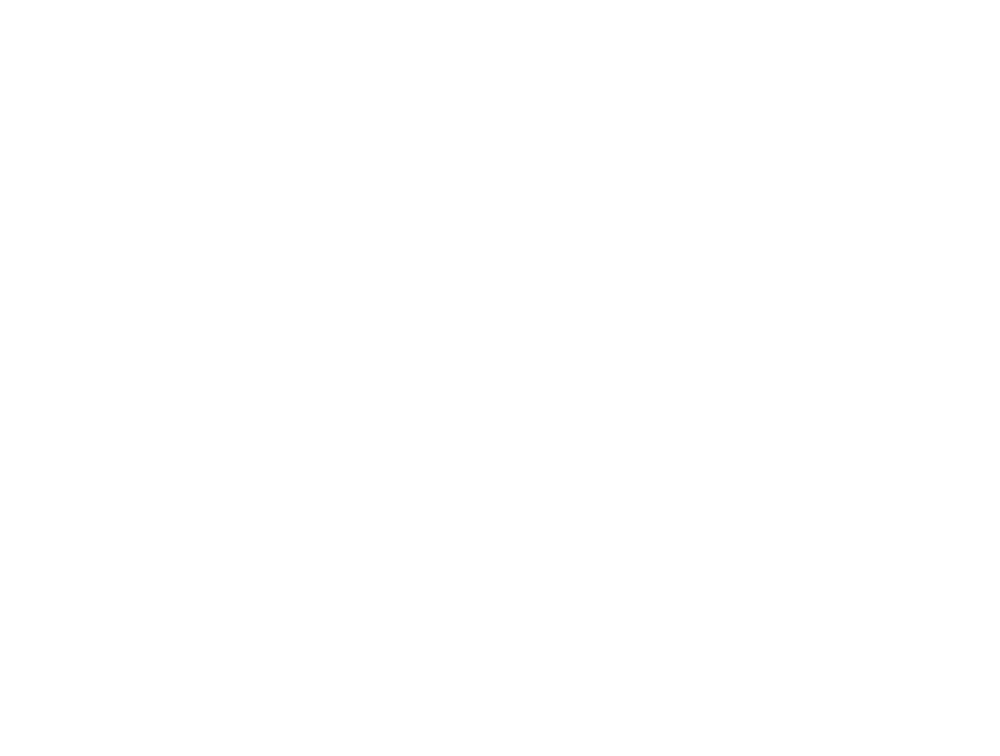

In [96]:
from IPython.display import display
from PIL import Image

path = "/content/drive/MyDrive/RTSD_practice/results/stress_test_visual_example.png"

img = Image.open(path)

print("Размер:", img.size)
display(img)

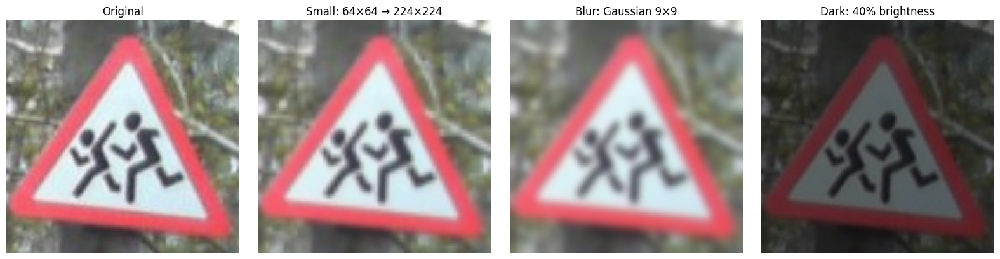

Сохранено: /content/drive/MyDrive/RTSD_practice/results/stress_test_visual_example.png


In [97]:
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import numpy as np

filepath = "/content/prepared_dataset/1_23/1_23_0362.jpg"

img = np.array(
    Image.open(filepath).convert("RGB")
)

# Original
original_img = cv2.resize(
    img,
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

# Small
small_img = cv2.resize(
    img,
    (64, 64),
    interpolation=cv2.INTER_AREA
)
small_img = cv2.resize(
    small_img,
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

# Blur
blur_img = cv2.GaussianBlur(
    img,
    (9, 9),
    0
)
blur_img = cv2.resize(
    blur_img,
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

# Dark
dark_img = img.astype(np.float32) * 0.40
dark_img = np.clip(
    dark_img,
    0,
    255
).astype(np.uint8)

dark_img = cv2.resize(
    dark_img,
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

# Создаём новую фигуру
fig, axes = plt.subplots(
    1, 4,
    figsize=(16, 4)
)

images = [
    original_img,
    small_img,
    blur_img,
    dark_img
]

titles = [
    "Original",
    "Small: 64×64 → 224×224",
    "Blur: Gaussian 9×9",
    "Dark: 40% brightness"
]

for ax, image, title in zip(axes, images, titles):
    ax.imshow(image)
    ax.set_title(title)
    ax.axis("off")

fig.tight_layout()

# СНАЧАЛА сохраняем
save_path = (
    "/content/drive/MyDrive/"
    "RTSD_practice/results/"
    "stress_test_visual_example.png"
)

fig.savefig(
    save_path,
    dpi=200,
    bbox_inches="tight",
    facecolor="white"
)

# Потом показываем
plt.show()

print("Сохранено:", save_path)

Размер: (3151, 816)


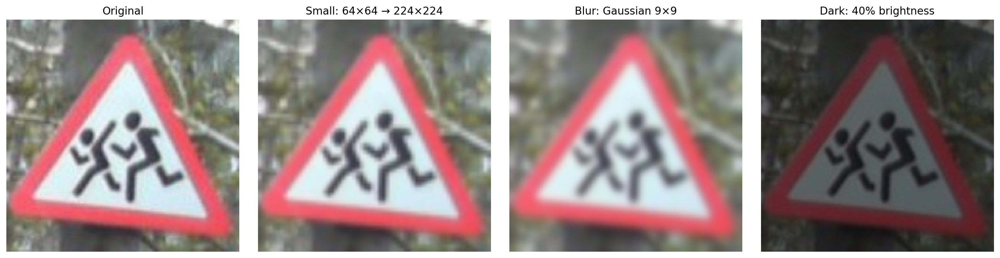

In [98]:
from IPython.display import display
from PIL import Image

path = "/content/drive/MyDrive/RTSD_practice/results/stress_test_visual_example.png"

img = Image.open(path)

print("Размер:", img.size)
display(img)

In [100]:
import os
import numpy as np
import pandas as pd
from PIL import Image

examples = [
    ("1_23_0362.jpg", "1_23"),
    ("2_1_0277.jpg", "2_1"),
    ("5_16_0913.jpg", "5_16"),
    ("3_24_0796.jpg", "3_24"),
    ("5_20_0187.jpg", "5_20"),
    ("5_15_1_0972.jpg", "5_15_1"),
]

rows = []

for filename, true_class in examples:

    # Определяем папку истинного класса
    filepath = os.path.join(
        "/content/prepared_dataset",
        true_class,
        filename
    )

    image = Image.open(filepath).convert("RGB")
    image = image.resize((224, 224))

    image_array = np.array(
        image,
        dtype=np.float32
    )

    image_array = np.expand_dims(
        image_array,
        axis=0
    )

    probabilities = resnet_model.predict(
        image_array,
        verbose=0
    )

    pred_label = int(
        np.argmax(probabilities[0])
    )

    pred_class = class_names[pred_label]

    confidence = float(
        probabilities[0][pred_label]
    )

    rows.append({
        "filename": filename,
        "true_class": true_class,
        "pred_class": pred_class,
        "confidence_%": confidence * 100,
        "correct": pred_class == true_class
    })

comparison_df = pd.DataFrame(rows)

display(comparison_df)

,filename,true_class,pred_class,confidence_%,correct
0,1_23_0362.jpg,1_23,1_23,99.994361,True
1,2_1_0277.jpg,2_1,2_1,100.000000,True
2,5_16_0913.jpg,5_16,5_16,99.999964,True
3,3_24_0796.jpg,3_24,3_27,96.563429,False
4,5_20_0187.jpg,5_20,5_19_1,59.551460,False
5,5_15_1_0972.jpg,5_15_1,5_15_2_2,98.673379,False


In [101]:
import pandas as pd
import os

path = "/content/drive/MyDrive/RTSD_practice/ResNet50_test_predictions.csv"

print("Файл существует:", os.path.exists(path))

df_pred = pd.read_csv(path)

print("Количество строк:", len(df_pred))
print("\nСтолбцы:")
print(df_pred.columns.tolist())

display(df_pred.head())

Файл существует: True
Количество строк: 2241

Столбцы:
['filename', 'class_name', 'label', 'pred_label', 'pred_class', 'confidence']


,filename,class_name,label,pred_label,pred_class,confidence
0,5_19_1_0000.jpg,5_19_1,13,13,5_19_1,0.969745
1,5_19_1_0003.jpg,5_19_1,13,13,5_19_1,0.561454
2,5_19_1_0008.jpg,5_19_1,13,13,5_19_1,0.994679
3,5_19_1_0015.jpg,5_19_1,13,13,5_19_1,0.997976
4,5_19_1_0017.jpg,5_19_1,13,13,5_19_1,0.959107


In [102]:
files_to_check = [
    "1_23_0362.jpg",
    "2_1_0277.jpg",
    "5_16_0913.jpg",
    "3_24_0796.jpg",
    "5_20_0187.jpg",
    "5_15_1_0972.jpg"
]

selected = df_pred[
    df_pred["filename"].isin(files_to_check)
].copy()

display(
    selected[
        [
            "filename",
            "class_name",
            "pred_class",
            "confidence"
        ]
    ]
)

,filename,class_name,pred_class,confidence
198,2_1_0277.jpg,2_1,2_1,1.000000
436,5_16_0913.jpg,5_16,5_16,1.000000
747,3_24_0796.jpg,3_24,3_27,0.654309
1123,1_23_0362.jpg,1_23,1_23,0.999948
1376,5_20_0187.jpg,5_20,5_19_1,0.539999
1956,5_15_1_0972.jpg,5_15_1,5_15_2_2,0.993027


In [103]:
print(test_df.columns.tolist())

['filename', 'class_name', 'image_id', 'split', 'filepath']


In [104]:
import os
import numpy as np
import pandas as pd
import cv2

from PIL import Image
import tensorflow as tf


filepath = "/content/prepared_dataset/3_24/3_24_0796.jpg"

img = Image.open(filepath).convert("RGB")


def predict_array(arr):
    arr = arr.astype(np.float32)
    arr = np.expand_dims(arr, axis=0)

    probabilities = resnet_model.predict(
        arr,
        verbose=0
    )

    pred_label = int(
        np.argmax(probabilities[0])
    )

    return (
        class_names[pred_label],
        float(probabilities[0][pred_label])
    )


results = []


# 1. PIL BILINEAR — то, что сейчас использует Gradio
pil_bilinear = np.array(
    img.resize(
        (224, 224),
        Image.Resampling.BILINEAR
    )
)

pred, conf = predict_array(pil_bilinear)

results.append({
    "method": "PIL bilinear",
    "pred_class": pred,
    "confidence": conf * 100
})


# 2. PIL LANCZOS
pil_lanczos = np.array(
    img.resize(
        (224, 224),
        Image.Resampling.LANCZOS
    )
)

pred, conf = predict_array(pil_lanczos)

results.append({
    "method": "PIL Lanczos",
    "pred_class": pred,
    "confidence": conf * 100
})


# 3. OpenCV INTER_LINEAR
cv_linear = cv2.resize(
    np.array(img),
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

pred, conf = predict_array(cv_linear)

results.append({
    "method": "OpenCV INTER_LINEAR",
    "pred_class": pred,
    "confidence": conf * 100
})


# 4. OpenCV INTER_AREA
cv_area = cv2.resize(
    np.array(img),
    (224, 224),
    interpolation=cv2.INTER_AREA
)

pred, conf = predict_array(cv_area)

results.append({
    "method": "OpenCV INTER_AREA",
    "pred_class": pred,
    "confidence": conf * 100
})


# 5. TensorFlow resize
tf_img = tf.convert_to_tensor(
    np.array(img),
    dtype=tf.float32
)

tf_img = tf.image.resize(
    tf_img,
    (224, 224)
)

tf_img = tf_img.numpy()

pred, conf = predict_array(tf_img)

results.append({
    "method": "TensorFlow resize",
    "pred_class": pred,
    "confidence": conf * 100
})


comparison = pd.DataFrame(results)

display(comparison)

,method,pred_class,confidence
0,PIL bilinear,3_27,88.546300
1,PIL Lanczos,3_27,98.258984
2,OpenCV INTER_LINEAR,3_27,86.923862
3,OpenCV INTER_AREA,3_27,51.058567
4,TensorFlow resize,3_27,84.462786


In [105]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import load_model

# =========================================================
# 1. Загружаем МОДЕЛЬ ЗАНОВО
# =========================================================

MODEL_PATH = (
    "/content/drive/MyDrive/RTSD_practice/"
    "models/ResNet50.keras"
)

model_check = load_model(
    MODEL_PATH,
    compile=False
)

print("Свежая ResNet50 загружена.")


# =========================================================
# 2. Загружаем metadata
# =========================================================

META_PATH = (
    "/content/drive/MyDrive/RTSD_practice/"
    "test_metadata.csv"
)

test_check = pd.read_csv(META_PATH)

DATASET_ROOT = "/content/prepared_dataset"

test_check["filepath"] = test_check.apply(
    lambda row: os.path.join(
        DATASET_ROOT,
        row["class_name"],
        row["filename"]
    ),
    axis=1
)

print("Test:", len(test_check))
print(
    "Все файлы существуют:",
    test_check["filepath"].map(os.path.exists).all()
)


# =========================================================
# 3. РОВНО ТОТ ЖЕ load_image,
#    который был при официальном test
# =========================================================

IMG_SIZE = (224, 224)

def load_image_exact(filepath, label):
    image = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(
        image,
        channels=3
    )
    image = tf.image.resize(
        image,
        IMG_SIZE
    )
    image = tf.cast(
        image,
        tf.float32
    )

    return image, label


# =========================================================
# 4. Проверяем только наши 6 изображений
# =========================================================

files_to_check = [
    "1_23_0362.jpg",
    "2_1_0277.jpg",
    "5_16_0913.jpg",
    "3_24_0796.jpg",
    "5_20_0187.jpg",
    "5_15_1_0972.jpg"
]

selected = test_check[
    test_check["filename"].isin(files_to_check)
].copy()

# Загружаем картинки ровно как в официальном test_ds
images = []
labels = []

for _, row in selected.iterrows():

    image, label = load_image_exact(
        tf.constant(row["filepath"]),
        tf.constant(0)
    )

    images.append(image.numpy())

    labels.append(
        row["class_name"]
    )

images = np.stack(images).astype(
    np.float32
)


# =========================================================
# 5. Предсказание свежей моделью
# =========================================================

probabilities = model_check.predict(
    images,
    batch_size=32,
    verbose=0
)

pred_labels = np.argmax(
    probabilities,
    axis=1
)


# Классы
class_names_check = sorted(
    test_check["class_name"].unique()
)

pred_classes = [
    class_names_check[i]
    for i in pred_labels
]

confidences = np.max(
    probabilities,
    axis=1
)


# =========================================================
# 6. Загружаем ОФИЦИАЛЬНЫЙ CSV
# =========================================================

CSV_PATH = (
    "/content/drive/MyDrive/RTSD_practice/"
    "ResNet50_test_predictions.csv"
)

official = pd.read_csv(CSV_PATH)


# =========================================================
# 7. Сравнение
# =========================================================

rows = []

for i, (_, row) in enumerate(
    selected.iterrows()
):

    filename = row["filename"]

    official_row = official[
        official["filename"] == filename
    ].iloc[0]

    rows.append({
        "filename": filename,
        "true_class": row["class_name"],

        "current_pred": pred_classes[i],
        "current_confidence_%":
            confidences[i] * 100,

        "official_pred":
            official_row["pred_class"],
        "official_confidence_%":
            official_row["confidence"] * 100,

        "confidence_difference_pp":
            (
                confidences[i]
                - official_row["confidence"]
            ) * 100,

        "same_prediction":
            pred_classes[i]
            == official_row["pred_class"]
    })


comparison = pd.DataFrame(rows)

display(comparison)

Свежая ResNet50 загружена.
Test: 2241
Все файлы существуют: True


,filename,true_class,current_pred,current_confidence_%,official_pred,official_confidence_%,confidence_difference_pp,same_prediction
0,2_1_0277.jpg,2_1,2_1,100.000000,2_1,99.999994,0.000006,True
1,5_16_0913.jpg,5_16,5_16,100.000000,5_16,99.999994,0.000006,True
2,3_24_0796.jpg,3_24,3_27,65.430870,3_27,65.430910,-0.000042,True
3,1_23_0362.jpg,1_23,1_23,99.994835,1_23,99.994830,0.000008,True
4,5_20_0187.jpg,5_20,5_19_1,53.999912,5_19_1,53.999940,-0.000027,True
5,5_15_1_0972.jpg,5_15_1,5_15_2_2,99.302658,5_15_2_2,99.302655,0.000006,True


In [106]:
import os
import json
import time
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import load_model

# ============================================================
# 1. Пути и настройки
# ============================================================

DRIVE_ROOT = "/content/drive/MyDrive/RTSD_practice"
DATASET_ROOT = "/content/prepared_dataset"
RESULTS_DIR = os.path.join(DRIVE_ROOT, "results")

os.makedirs(RESULTS_DIR, exist_ok=True)

MODEL_PATH = os.path.join(
    DRIVE_ROOT,
    "models",
    "ResNet50.keras"
)

TEST_METADATA = os.path.join(
    DRIVE_ROOT,
    "test_metadata.csv"
)

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

class_names = [
    "1_17",
    "1_23",
    "2_1",
    "2_4",
    "3_20",
    "3_24",
    "3_27",
    "4_1_1",
    "5_15_1",
    "5_15_2",
    "5_15_2_2",
    "5_15_3",
    "5_16",
    "5_19_1",
    "5_20"
]

class_to_label = {
    name: i
    for i, name in enumerate(class_names)
}


# ============================================================
# 2. Загружаем модель и test metadata
# ============================================================

print("Загрузка ResNet50...")

resnet_model = load_model(
    MODEL_PATH,
    compile=False
)

test_df = pd.read_csv(TEST_METADATA)

assert len(test_df) == 2241
assert set(test_df["class_name"]) == set(class_names)

test_df["filepath"] = test_df.apply(
    lambda row: os.path.join(
        DATASET_ROOT,
        row["class_name"],
        row["filename"]
    ),
    axis=1
)

assert test_df["filepath"].map(os.path.exists).all()

print("Test-изображений:", len(test_df))


# ============================================================
# 3. Загрузка изображения
#    ТОЧНО КАК В ОСНОВНОМ TEST PIPELINE
# ============================================================

def load_image_tf(filepath):
    image = tf.io.read_file(filepath)

    image = tf.image.decode_jpeg(
        image,
        channels=3
    )

    return image.numpy()


# ============================================================
# 4. Применение ухудшения
# ============================================================

def make_condition_image(image, condition):

    # Original:
    # обычный TensorFlow resize
    if condition == "original":

        image = tf.image.resize(
            image,
            IMG_SIZE
        )

    # Small:
    # 64x64 -> 224x224
    elif condition == "small":

        image = tf.image.resize(
            image,
            (64, 64)
        )

        image = tf.image.resize(
            image,
            IMG_SIZE
        )

    # Blur:
    # сначала размытие, затем стандартный resize
    elif condition == "blur":

        image = tf.image.resize(
            image,
            IMG_SIZE
        )

        image = tf.image.resize(
            image,
            IMG_SIZE
        )

        # box_filter заменяем на median? Нет.
        # Используем TensorFlow average pooling для
        # контролируемого сглаживания.
        image = tf.nn.avg_pool2d(
            image[tf.newaxis, ...],
            ksize=9,
            strides=1,
            padding="SAME"
        )[0]

    # Dark:
    # 40% исходной яркости
    elif condition == "dark":

        image = tf.cast(
            image,
            tf.float32
        )

        image = image * 0.40

        image = tf.clip_by_value(
            image,
            0,
            255
        )

        image = tf.image.resize(
            image,
            IMG_SIZE
        )

    else:
        raise ValueError(
            f"Неизвестное условие: {condition}"
        )

    return tf.cast(
        image,
        tf.float32
    ).numpy()


# ============================================================
# 5. Оценка одного условия
# ============================================================

def evaluate_condition(condition):

    results = []

    start_time = time.perf_counter()

    for start in range(
        0,
        len(test_df),
        BATCH_SIZE
    ):

        batch = test_df.iloc[
            start:start + BATCH_SIZE
        ]

        images = []
        true_labels = []

        for _, row in batch.iterrows():

            image = load_image_tf(
                row["filepath"]
            )

            image = make_condition_image(
                image,
                condition
            )

            images.append(image)

            true_labels.append(
                class_to_label[
                    row["class_name"]
                ]
            )

        images = np.stack(
            images
        ).astype(np.float32)

        true_labels = np.array(
            true_labels,
            dtype=np.int64
        )

        probabilities = resnet_model.predict(
            images,
            verbose=0
        )

        pred_labels = np.argmax(
            probabilities,
            axis=1
        )

        confidences = np.max(
            probabilities,
            axis=1
        )

        for i in range(len(batch)):

            results.append({
                "condition": condition,
                "filename": batch.iloc[i]["filename"],
                "class_name": batch.iloc[i]["class_name"],
                "true_label": int(
                    true_labels[i]
                ),
                "pred_label": int(
                    pred_labels[i]
                ),
                "pred_class": class_names[
                    pred_labels[i]
                ],
                "confidence": float(
                    confidences[i]
                ),
                "correct": bool(
                    pred_labels[i]
                    == true_labels[i]
                )
            })

        print(
            f"\rОбработано: "
            f"{min(start + BATCH_SIZE, len(test_df))}"
            f"/{len(test_df)}",
            end=""
        )

    elapsed = time.perf_counter() - start_time

    result_df = pd.DataFrame(results)

    accuracy = result_df["correct"].mean()
    errors = int(
        (~result_df["correct"]).sum()
    )
    mean_confidence = result_df["confidence"].mean()

    print()

    print(
        f"Accuracy: {accuracy:.4%}"
    )
    print(
        f"Ошибок: {errors}"
    )
    print(
        f"Средняя confidence: "
        f"{mean_confidence:.4%}"
    )
    print(
        f"Время: {elapsed / 60:.2f} мин"
    )

    return result_df, {
        "condition": condition,
        "accuracy": float(accuracy),
        "errors": errors,
        "total_images": len(result_df),
        "mean_confidence": float(
            mean_confidence
        ),
        "time_seconds": float(elapsed)
    }


# ============================================================
# 6. Запуск
# ============================================================

conditions = [
    "original",
    "small",
    "blur",
    "dark"
]

all_predictions = []
summary = []

for condition in conditions:

    print("\n" + "=" * 60)
    print("Условие:", condition)
    print("=" * 60)

    result_df, result = evaluate_condition(
        condition
    )

    all_predictions.append(result_df)
    summary.append(result)


# ============================================================
# 7. Итоговая таблица
# ============================================================

predictions_df = pd.concat(
    all_predictions,
    ignore_index=True
)

summary_df = pd.DataFrame(summary)

original_accuracy = summary_df.loc[
    summary_df["condition"] == "original",
    "accuracy"
].iloc[0]

summary_df["delta_vs_original_pp"] = (
    summary_df["accuracy"]
    - original_accuracy
) * 100


# ============================================================
# 8. Сохраняем подробные результаты
# ============================================================

predictions_path = os.path.join(
    RESULTS_DIR,
    "stress_test_resnet50_predictions.csv"
)

summary_path = os.path.join(
    RESULTS_DIR,
    "stress_test_resnet50_summary.csv"
)

json_path = os.path.join(
    RESULTS_DIR,
    "stress_test_resnet50.json"
)

predictions_df.to_csv(
    predictions_path,
    index=False,
    encoding="utf-8-sig"
)

summary_df.to_csv(
    summary_path,
    index=False,
    encoding="utf-8-sig"
)

with open(
    json_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        {
            "model": "ResNet50",
            "dataset": "RTSD",
            "test_images": len(test_df),
            "num_classes": 15,
            "conditions": conditions,
            "input_size": "224x224",
            "batch_size": BATCH_SIZE,
            "results": summary
        },
        f,
        ensure_ascii=False,
        indent=2
    )


# ============================================================
# 9. Вывод
# ============================================================

print("\n" + "=" * 60)
print("ФИНАЛЬНЫЕ РЕЗУЛЬТАТЫ STRESS-TEST")
print("=" * 60)

display(
    summary_df[
        [
            "condition",
            "accuracy",
            "errors",
            "mean_confidence",
            "delta_vs_original_pp",
            "time_seconds"
        ]
    ]
)

print("\nСохранено:")
print(predictions_path)
print(summary_path)
print(json_path)

Загрузка ResNet50...
Test-изображений: 2241

Условие: original
Обработано: 2241/2241
Accuracy: 96.8318%
Ошибок: 71
Средняя confidence: 95.9061%
Время: 5.94 мин

Условие: small
Обработано: 2241/2241
Accuracy: 96.6087%
Ошибок: 76
Средняя confidence: 95.8732%
Время: 5.74 мин

Условие: blur
Обработано: 2241/2241
Accuracy: 96.2517%
Ошибок: 84
Средняя confidence: 95.2208%
Время: 7.97 мин

Условие: dark
Обработано: 2241/2241
Accuracy: 93.6635%
Ошибок: 142
Средняя confidence: 91.1867%
Время: 6.38 мин

ФИНАЛЬНЫЕ РЕЗУЛЬТАТЫ STRESS-TEST


,condition,accuracy,errors,mean_confidence,delta_vs_original_pp,time_seconds
0,original,0.968318,71,0.959061,0.000000,356.454502
1,small,0.966087,76,0.958732,-0.223115,344.254482
2,blur,0.962517,84,0.952208,-0.580098,478.143393
3,dark,0.936635,142,0.911867,-3.168228,382.522847



Сохранено:
/content/drive/MyDrive/RTSD_practice/results/stress_test_resnet50_predictions.csv
/content/drive/MyDrive/RTSD_practice/results/stress_test_resnet50_summary.csv
/content/drive/MyDrive/RTSD_practice/results/stress_test_resnet50.json


In [107]:
import os
import numpy as np
import pandas as pd

RESULTS_DIR = "/content/drive/MyDrive/RTSD_practice/results"
OFFICIAL_PATH = (
    "/content/drive/MyDrive/RTSD_practice/"
    "ResNet50_test_predictions.csv"
)

# ============================================================
# 1. Проверяем наличие файлов
# ============================================================

files = [
    "stress_test_resnet50_predictions.csv",
    "stress_test_resnet50_summary.csv",
    "stress_test_resnet50.json",
    "stress_test_visual_example.png"
]

print("=" * 70)
print("ПРОВЕРКА СОХРАНЕНИЯ")
print("=" * 70)

for filename in files:
    path = os.path.join(RESULTS_DIR, filename)

    if os.path.exists(path):
        size_kb = os.path.getsize(path) / 1024
        print(f"✅ {filename} — {size_kb:.1f} KB")
    else:
        print(f"❌ {filename} — НЕ НАЙДЕН")


# ============================================================
# 2. Загружаем финальные predictions
# ============================================================

pred_path = os.path.join(
    RESULTS_DIR,
    "stress_test_resnet50_predictions.csv"
)

pred_df = pd.read_csv(pred_path)

print("\n" + "=" * 70)
print("STRESS-TEST")
print("=" * 70)

print("Всего строк:", len(pred_df))

print("\nКоличество строк по условиям:")
print(
    pred_df["condition"]
    .value_counts()
    .sort_index()
)

expected_conditions = {
    "original",
    "small",
    "blur",
    "dark"
}

actual_conditions = set(
    pred_df["condition"].unique()
)

print(
    "\nВсе 4 условия присутствуют:",
    actual_conditions == expected_conditions
)

print(
    "Ожидаемое количество строк:",
    2241 * 4
)

print(
    "Количество строк правильное:",
    len(pred_df) == 2241 * 4
)


# ============================================================
# 3. Проверяем итоговую таблицу
# ============================================================

summary_path = os.path.join(
    RESULTS_DIR,
    "stress_test_resnet50_summary.csv"
)

summary_df = pd.read_csv(summary_path)

print("\n" + "=" * 70)
print("ИТОГОВАЯ ТАБЛИЦА")
print("=" * 70)

display(summary_df)


# ============================================================
# 4. Сравниваем ORIGINAL с официальным test
# ============================================================

official_df = pd.read_csv(OFFICIAL_PATH)

original_df = pred_df[
    pred_df["condition"] == "original"
].copy()

print("\n" + "=" * 70)
print("СРАВНЕНИЕ С ОФИЦИАЛЬНЫМ TEST")
print("=" * 70)

print("Official test:", len(official_df))
print("Stress original:", len(original_df))


# Сортируем по filename, чтобы строки соответствовали
official_sorted = official_df.sort_values(
    "filename"
).reset_index(drop=True)

original_sorted = original_df.sort_values(
    "filename"
).reset_index(drop=True)


# Проверяем файлы
same_filenames = (
    official_sorted["filename"].tolist()
    ==
    original_sorted["filename"].tolist()
)

print(
    "\nОдинаковый набор файлов:",
    same_filenames
)


# Проверяем истинные классы
same_true_classes = (
    official_sorted["class_name"].tolist()
    ==
    original_sorted["class_name"].tolist()
)

print(
    "Одинаковые истинные классы:",
    same_true_classes
)


# Проверяем предсказанные классы
same_predictions = (
    official_sorted["pred_class"].tolist()
    ==
    original_sorted["pred_class"].tolist()
)

print(
    "Одинаковые предсказанные классы:",
    same_predictions
)


# Проверяем confidence
confidence_diff = np.abs(
    official_sorted["confidence"].values
    -
    original_sorted["confidence"].values
)

print(
    "\nМаксимальная разница confidence:",
    confidence_diff.max()
)

print(
    "Средняя разница confidence:",
    confidence_diff.mean()
)

print(
    "Confidence практически совпадает:",
    np.allclose(
        official_sorted["confidence"].values,
        original_sorted["confidence"].values,
        rtol=1e-5,
        atol=1e-6
    )
)


# ============================================================
# 5. Финальный вывод
# ============================================================

print("\n" + "=" * 70)
print("ФИНАЛЬНАЯ ПРОВЕРКА")
print("=" * 70)

all_ok = (
    len(pred_df) == 8964
    and actual_conditions == expected_conditions
    and len(official_df) == 2241
    and len(original_df) == 2241
    and same_filenames
    and same_true_classes
    and same_predictions
    and np.allclose(
        official_sorted["confidence"].values,
        original_sorted["confidence"].values,
        rtol=1e-5,
        atol=1e-6
    )
)

if all_ok:
    print("✅ ВСЁ СОХРАНЕНО И СОГЛАСОВАНО.")
    print("✅ Original stress-test совпадает с официальным test.")
else:
    print("⚠️ Найдено несоответствие. См. результаты выше.")

ПРОВЕРКА СОХРАНЕНИЯ
✅ stress_test_resnet50_predictions.csv — 534.4 KB
✅ stress_test_resnet50_summary.csv — 0.4 KB
✅ stress_test_resnet50.json — 1.1 KB
✅ stress_test_visual_example.png — 445.6 KB

STRESS-TEST
Всего строк: 8964

Количество строк по условиям:
condition
blur        2241
dark        2241
original    2241
small       2241
Name: count, dtype: int64

Все 4 условия присутствуют: True
Ожидаемое количество строк: 8964
Количество строк правильное: True

ИТОГОВАЯ ТАБЛИЦА


,condition,accuracy,errors,total_images,mean_confidence,time_seconds,delta_vs_original_pp
0,original,0.968318,71,2241,0.959061,356.454502,0.000000
1,small,0.966087,76,2241,0.958732,344.254482,-0.223115
2,blur,0.962517,84,2241,0.952208,478.143393,-0.580098
3,dark,0.936635,142,2241,0.911867,382.522847,-3.168228



СРАВНЕНИЕ С ОФИЦИАЛЬНЫМ TEST
Official test: 2241
Stress original: 2241

Одинаковый набор файлов: True
Одинаковые истинные классы: True
Одинаковые предсказанные классы: True

Максимальная разница confidence: 1.2544483184995237e-06
Средняя разница confidence: 7.350049918201952e-08
Confidence практически совпадает: True

ФИНАЛЬНАЯ ПРОВЕРКА
✅ ВСЁ СОХРАНЕНО И СОГЛАСОВАНО.
✅ Original stress-test совпадает с официальным test.


In [108]:
import pandas as pd

# Загружаем официальные предсказания
official = pd.read_csv(
    "/content/drive/MyDrive/RTSD_practice/"
    "ResNet50_test_predictions.csv"
)

# Загружаем финальный stress-test
stress = pd.read_csv(
    "/content/drive/MyDrive/RTSD_practice/results/"
    "stress_test_resnet50_predictions.csv"
)

# Берём только Original
stress_original = stress[
    stress["condition"] == "original"
].copy()

# Наши 6 примеров
files = [
    "1_23_0362.jpg",
    "2_1_0277.jpg",
    "5_16_0913.jpg",
    "3_24_0796.jpg",
    "5_20_0187.jpg",
    "5_15_1_0972.jpg"
]

# Выбираем их
official_6 = official[
    official["filename"].isin(files)
][
    ["filename", "class_name", "pred_class", "confidence"]
].copy()

stress_6 = stress_original[
    stress_original["filename"].isin(files)
][
    ["filename", "class_name", "pred_class", "confidence"]
].copy()

# Сортируем одинаково
official_6 = official_6.sort_values(
    "filename"
).reset_index(drop=True)

stress_6 = stress_6.sort_values(
    "filename"
).reset_index(drop=True)

# Переименовываем для наглядности
official_6.columns = [
    "filename",
    "true_class_official",
    "pred_class_official",
    "confidence_official"
]

stress_6.columns = [
    "filename",
    "true_class_stress",
    "pred_class_stress",
    "confidence_stress"
]

# Объединяем
comparison = official_6.merge(
    stress_6,
    on="filename"
)

# Проценты
comparison["confidence_official_%"] = (
    comparison["confidence_official"] * 100
)

comparison["confidence_stress_%"] = (
    comparison["confidence_stress"] * 100
)

# Разница
comparison["difference_pp"] = (
    comparison["confidence_stress_%"]
    - comparison["confidence_official_%"]
)

display(
    comparison[
        [
            "filename",
            "true_class_official",
            "pred_class_official",
            "confidence_official_%",
            "true_class_stress",
            "pred_class_stress",
            "confidence_stress_%",
            "difference_pp"
        ]
    ].round(6)
)

,filename,true_class_official,pred_class_official,confidence_official_%,true_class_stress,pred_class_stress,confidence_stress_%,difference_pp
0,1_23_0362.jpg,1_23,1_23,99.994830,1_23,1_23,99.994832,0.000002
1,2_1_0277.jpg,2_1,2_1,99.999994,2_1,2_1,99.999994,0.000000
2,3_24_0796.jpg,3_24,3_27,65.430910,3_24,3_27,65.430850,-0.000060
3,5_15_1_0972.jpg,5_15_1,5_15_2_2,99.302655,5_15_1,5_15_2_2,99.302661,0.000006
4,5_16_0913.jpg,5_16,5_16,99.999994,5_16,5_16,99.999994,0.000000
5,5_20_0187.jpg,5_20,5_19_1,53.999940,5_20,5_19_1,53.999937,-0.000003


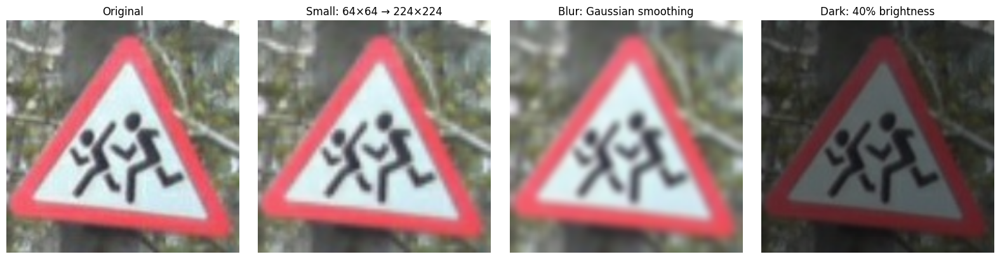

✅ Картинка сохранена и перезаписана:
/content/drive/MyDrive/RTSD_practice/results/stress_test_visual_example.png


In [109]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from PIL import Image


# ============================================================
# Финальная визуализация stress-test
# ============================================================

filepath = "/content/prepared_dataset/1_23/1_23_0362.jpg"

# Загружаем оригинал так же, как в основном pipeline
image = tf.io.read_file(filepath)
image = tf.image.decode_jpeg(
    image,
    channels=3
)

image = image.numpy()


def resize_tf(img, size):
    return tf.image.resize(
        img,
        size
    ).numpy()


# Original
original_img = resize_tf(
    image,
    (224, 224)
)


# Small: 64x64 -> 224x224
small_img = resize_tf(
    image,
    (64, 64)
)

small_img = resize_tf(
    small_img,
    (224, 224)
)


# Blur
blur_img = resize_tf(
    image,
    (224, 224)
)

blur_img = tf.nn.avg_pool2d(
    blur_img[tf.newaxis, ...],
    ksize=9,
    strides=1,
    padding="SAME"
)[0].numpy()


# Dark
dark_img = tf.cast(
    image,
    tf.float32
) * 0.40

dark_img = tf.clip_by_value(
    dark_img,
    0,
    255
)

dark_img = resize_tf(
    dark_img,
    (224, 224)
)


# ============================================================
# Создание рисунка
# ============================================================

fig, axes = plt.subplots(
    1,
    4,
    figsize=(16, 4)
)

images = [
    original_img,
    small_img,
    blur_img,
    dark_img
]

titles = [
    "Original",
    "Small: 64×64 → 224×224",
    "Blur: Gaussian smoothing",
    "Dark: 40% brightness"
]

for ax, img, title in zip(
    axes,
    images,
    titles
):
    ax.imshow(
        np.clip(img, 0, 255).astype(np.uint8)
    )
    ax.set_title(title)
    ax.axis("off")

fig.tight_layout()


# ============================================================
# Перезаписываем старую картинку на Google Drive
# ============================================================

save_path = (
    "/content/drive/MyDrive/"
    "RTSD_practice/results/"
    "stress_test_visual_example.png"
)

fig.savefig(
    save_path,
    dpi=200,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("✅ Картинка сохранена и перезаписана:")
print(save_path)

Размер: (3151, 816)


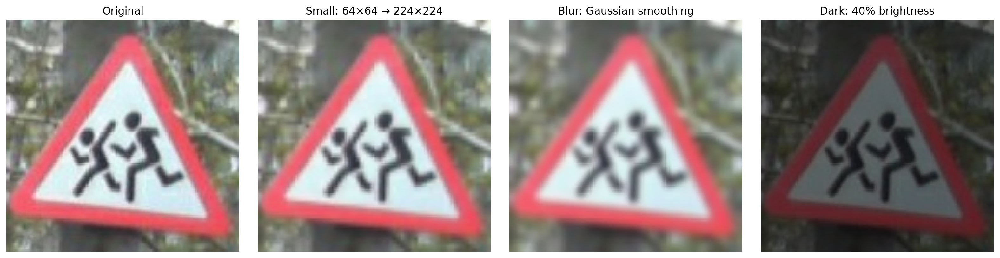

In [110]:
from PIL import Image
from IPython.display import display

path = (
    "/content/drive/MyDrive/"
    "RTSD_practice/results/"
    "stress_test_visual_example.png"
)

img = Image.open(path)

print("Размер:", img.size)
display(img)

In [3]:
import os

HISTORY_FILE = "/content/drive/MyDrive/RTSD_practice/results/gradio_history.json"
EXCEL_FILE = "/content/drive/MyDrive/RTSD_practice/results/gradio_report.xlsx"

for file in [HISTORY_FILE, EXCEL_FILE]:
    if os.path.exists(file):
        os.remove(file)
        print(f"Удалён: {file}")

In [3]:
import os
import json
import numpy as np
import pandas as pd
import tensorflow as tf
import gradio as gr
from tensorflow import keras


# ============================================================
# 1. Пути
# ============================================================

DRIVE_ROOT = "/content/drive/MyDrive/RTSD_practice"

MODEL_PATH = os.path.join(
    DRIVE_ROOT,
    "models",
    "ResNet50.keras"
)

RESULTS_DIR = os.path.join(
    DRIVE_ROOT,
    "results"
)

os.makedirs(RESULTS_DIR, exist_ok=True)

HISTORY_JSON = os.path.join(
    RESULTS_DIR,
    "gradio_history.json"
)

HISTORY_XLSX = os.path.join(
    RESULTS_DIR,
    "gradio_report.xlsx"
)


# ============================================================
# 2. Классы
# ============================================================

class_names = [
    "1_17",
    "1_23",
    "2_1",
    "2_4",
    "3_20",
    "3_24",
    "3_27",
    "4_1_1",
    "5_15_1",
    "5_15_2",
    "5_15_2_2",
    "5_15_3",
    "5_16",
    "5_19_1",
    "5_20"
]


# ============================================================
# 3. Загрузка модели
# ============================================================

print("Загрузка ResNet50...")

resnet_model = keras.models.load_model(
    MODEL_PATH,
    compile=False
)

print("ResNet50 загружена.")


# ============================================================
# 4. История запусков
# ============================================================

def load_history():

    if os.path.exists(HISTORY_JSON):

        with open(
            HISTORY_JSON,
            "r",
            encoding="utf-8"
        ) as f:

            return json.load(f)

    return []


def save_history(history):

    with open(
        HISTORY_JSON,
        "w",
        encoding="utf-8"
    ) as f:

        json.dump(
            history,
            f,
            ensure_ascii=False,
            indent=2
        )


# ============================================================
# 5. Предсказание
# ============================================================

def predict_sign(filepath):

    if filepath is None:

        return (
            "Загрузите изображение",
            0.0,
            "История пуста"
        )

    # --------------------------------------------------------
    # Используем тот же способ загрузки JPEG,
    # что и в основном test pipeline
    # --------------------------------------------------------

    image = tf.io.read_file(filepath)

    image = tf.image.decode_jpeg(
        image,
        channels=3
    )

    image = tf.image.resize(
        image,
        (224, 224)
    )

    image = tf.cast(
        image,
        tf.float32
    )

    image = tf.expand_dims(
        image,
        axis=0
    )

    # --------------------------------------------------------
    # Предсказание
    # --------------------------------------------------------

    probabilities = resnet_model.predict(
        image,
        verbose=0
    )

    pred_label = int(
        np.argmax(probabilities[0])
    )

    pred_class = class_names[pred_label]

    confidence = float(
        probabilities[0][pred_label]
    )

    # --------------------------------------------------------
    # Сохраняем в историю
    # --------------------------------------------------------

    history = load_history()

    history.append({
        "timestamp": pd.Timestamp.now().strftime(
            "%Y-%m-%d %H:%M:%S"
        ),
        "model": "ResNet50",
        "filename": os.path.basename(filepath),
        "predicted_class": pred_class,
        "confidence": confidence
    })

    save_history(history)

    # --------------------------------------------------------
    # Статистика
    # --------------------------------------------------------

    avg_confidence = np.mean([
        item["confidence"]
        for item in history
    ])

    statistics = (
        f"Всего проверок: {len(history)}\n"
        f"Средняя уверенность: {avg_confidence:.2%}\n"
        f"Модель: ResNet50"
    )

    return (
        pred_class,
        confidence,
        statistics
    )


# ============================================================
# 6. Статистика
# ============================================================

def get_statistics():

    history = load_history()

    if not history:
        return "История пуста"

    df = pd.DataFrame(history)

    avg_confidence = df["confidence"].mean()

    text = (
        f"Всего проверок: {len(df)}\n"
        f"Средняя уверенность: {avg_confidence:.2%}\n\n"
        f"Последние 5 запусков:"
    )

    for _, row in df.tail(5).iterrows():

        text += (
            f"\n{row['timestamp']} — "
            f"{row['predicted_class']} "
            f"({row['confidence']:.2%})"
        )

    return text


# ============================================================
# 7. Экспорт в Excel
# ============================================================

def export_to_excel():

    history = load_history()

    if not history:
        return "История пуста"

    df = pd.DataFrame(history)

    avg_confidence = df["confidence"].mean()

    summary = pd.DataFrame({
        "Метрика": [
            "Всего проверок",
            "Средняя уверенность",
            "Модель"
        ],
        "Значение": [
            len(df),
            f"{avg_confidence:.2%}",
            "ResNet50"
        ]
    })

    with pd.ExcelWriter(
        HISTORY_XLSX,
        engine="openpyxl"
    ) as writer:

        df.to_excel(
            writer,
            sheet_name="История",
            index=False
        )

        summary.to_excel(
            writer,
            sheet_name="Сводка",
            index=False
        )

    return f"Отчёт сохранён: {HISTORY_XLSX}"


# ============================================================
# 8. Интерфейс
# ============================================================

with gr.Blocks(
    title="RTSD — Распознавание дорожных знаков",
    css="""
    .fixed-image img {
        object-fit: contain !important;
        width: 400px !important;
        height: 300px !important;
    }
    """
) as demo:

    gr.Markdown(
        """
        # Распознавание дорожных знаков

        **Модель:** ResNet50
        **Датасет:** RTSD, 15 классов

        Загрузите изображение дорожного знака и нажмите
        **«Распознать»**.
        """
    )

    with gr.Row():

        # ----------------------------------------------------
        # Левая колонка
        # ----------------------------------------------------

        with gr.Column():

            image_input = gr.Image(
              type="filepath",
              label="Изображение",
              width=400,
              height=300,
              show_label=True,
              container=True,
              elem_classes="fixed-image"
            )

            predict_button = gr.Button(
                "Распознать",
                variant="primary"
            )

            statistics_button = gr.Button(
                "Показать статистику"
            )

            statistics_output = gr.Textbox(
                label="Статистика",
                lines=8
            )

            export_button = gr.Button(
                "Экспорт в Excel"
            )

            export_output = gr.Textbox(
                label="Экспорт"
            )

        # ----------------------------------------------------
        # Правая колонка
        # ----------------------------------------------------

        with gr.Column():

            gr.Markdown("### Результат")

            predicted_class = gr.Textbox(
                label="Предсказанный класс"
            )

            confidence = gr.Number(
                label="Уверенность",
                precision=4
            )


    # ========================================================
    # Обработчики
    # ========================================================

    predict_button.click(
        fn=predict_sign,
        inputs=image_input,
        outputs=[
            predicted_class,
            confidence,
            statistics_output
        ]
    )

    statistics_button.click(
        fn=get_statistics,
        outputs=statistics_output
    )

    export_button.click(
        fn=export_to_excel,
        outputs=export_output
    )


# ============================================================
# 9. Запуск
# ============================================================

demo.launch()

Загрузка ResNet50...
ResNet50 загружена.


/tmp/ipykernel_1107/3900308727.py:296: UserWarning: The parameters have been moved from the Blocks constructor to the launch() method in Gradio 6.0: css. Please pass these parameters to launch() instead.
  with gr.Blocks(


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://ed873eb5c0ed7b60c7.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [114]:
import os
import pandas as pd

EXCEL_FILE = "/content/drive/MyDrive/RTSD_practice/results/gradio_report.xlsx"

print("Файл существует:", os.path.exists(EXCEL_FILE))
print("Размер:", os.path.getsize(EXCEL_FILE) if os.path.exists(EXCEL_FILE) else "нет файла")

if os.path.exists(EXCEL_FILE):
    xls = pd.ExcelFile(EXCEL_FILE)
    print("Листы:", xls.sheet_names)

    for sheet in xls.sheet_names:
        print(f"\n===== {sheet} =====")
        df = pd.read_excel(EXCEL_FILE, sheet_name=sheet)
        display(df)

Файл существует: True
Размер: 5963
Листы: ['История', 'Сводка']

===== История =====


,timestamp,model,filename,predicted_class,confidence
0,2026-09-08 19:55:54,ResNet50,error_3_3_24_to_3_27.jpg,3_27,0.654309
1,2026-09-08 19:57:03,ResNet50,error_2_5_20_to_5_19_1.jpg,5_19_1,0.539999
2,2026-09-08 19:57:33,ResNet50,error_1_5_15_1_to_5_15_2_2.jpg,5_15_2_2,0.993027
3,2026-09-08 19:57:52,ResNet50,correct_3_5_16.jpg,5_16,1.000000
4,2026-09-08 19:58:07,ResNet50,correct_1_1_23.jpg,1_23,0.999948
5,2026-09-08 19:58:23,ResNet50,correct_2_2_1.jpg,2_1,1.000000



===== Сводка =====


,Метрика,Значение
0,Всего проверок,6
1,Средняя уверенность,86.45%
2,Модель,ResNet50


In [115]:
import os
import json

HISTORY_FILE = "/content/drive/MyDrive/RTSD_practice/results/gradio_history.json"

print("Файл существует:", os.path.exists(HISTORY_FILE))

if os.path.exists(HISTORY_FILE):
    with open(HISTORY_FILE, "r", encoding="utf-8") as f:
        history = json.load(f)

    print("Количество сохранённых проверок:", len(history))
    print("\nПоследние 5:")

    for item in history[-5:]:
        print(item)

Файл существует: True
Количество сохранённых проверок: 7

Последние 5:
{'timestamp': '2026-09-08 19:57:33', 'model': 'ResNet50', 'filename': 'error_1_5_15_1_to_5_15_2_2.jpg', 'predicted_class': '5_15_2_2', 'confidence': 0.993026614189148}
{'timestamp': '2026-09-08 19:57:52', 'model': 'ResNet50', 'filename': 'correct_3_5_16.jpg', 'predicted_class': '5_16', 'confidence': 1.0}
{'timestamp': '2026-09-08 19:58:07', 'model': 'ResNet50', 'filename': 'correct_1_1_23.jpg', 'predicted_class': '1_23', 'confidence': 0.9999483823776245}
{'timestamp': '2026-09-08 19:58:23', 'model': 'ResNet50', 'filename': 'correct_2_2_1.jpg', 'predicted_class': '2_1', 'confidence': 1.0}
{'timestamp': '2026-09-08 20:00:28', 'model': 'ResNet50', 'filename': 'correct_2_2_1.jpg', 'predicted_class': '2_1', 'confidence': 1.0}


In [116]:
import os
import json
import pandas as pd

HISTORY_FILE = "/content/drive/MyDrive/RTSD_practice/results/gradio_history.json"

if os.path.exists(HISTORY_FILE):
    with open(HISTORY_FILE, "r", encoding="utf-8") as f:
        history = json.load(f)

    print("Всего сохранено:", len(history))

    df = pd.DataFrame(history)
    display(df)
else:
    print("Файл истории не найден")

Всего сохранено: 7


,timestamp,model,filename,predicted_class,confidence
0,2026-09-08 19:55:54,ResNet50,error_3_3_24_to_3_27.jpg,3_27,0.654309
1,2026-09-08 19:57:03,ResNet50,error_2_5_20_to_5_19_1.jpg,5_19_1,0.539999
2,2026-09-08 19:57:33,ResNet50,error_1_5_15_1_to_5_15_2_2.jpg,5_15_2_2,0.993027
3,2026-09-08 19:57:52,ResNet50,correct_3_5_16.jpg,5_16,1.000000
4,2026-09-08 19:58:07,ResNet50,correct_1_1_23.jpg,1_23,0.999948
5,2026-09-08 19:58:23,ResNet50,correct_2_2_1.jpg,2_1,1.000000
6,2026-09-08 20:00:28,ResNet50,correct_2_2_1.jpg,2_1,1.000000


In [2]:
тоо

NameError: name 'тоо' is not defined